# 基于Python的理财产品资金流入流出时序预测

> 余额宝介绍：
余额宝是一种资金管理服务。转入余额宝，即购买货币基金，可享货币基金收益；
升级后的货币基金销售服务将由蚂蚁集团网商银行及蚂蚁基金提供支持，与多家金融机构合作，提供更多理财选择。
货币基金主要用于投资国债、银行存款等有价证券。 投资者购买货币市场基金并不等于将资金作为存款存放在银行或者存款类金融机构，基金公司不保证基金一定盈利，也不保证最低收益。 转入余额宝的资金不仅可以获得收益，还能随时消费，非常灵活便捷。让您赚钱花钱两不误 。


余额宝（Yu'e Bao）简介

余额宝是中国蚂蚁金服推出的一款互联网金融产品，也被称为货币基金。它于2013年6月上线，为用户提供了一种便捷的基金理财工具。以下是余额宝的主要特点和运作方式：

- **投资方式**：用户可以将闲置的支付宝余额自动转入余额宝账户中进行理财，享受货币基金的收益。同时，用户随时可以将资金从余额宝账户转出到支付宝账户，实现资金的快速流动性。
- **投资组合**：余额宝的投资资金主要用于购买短期低风险的货币市场基金。这些基金主要投资于国债、央行票据和银行存款等低风险投资工具，因此相对风险较低。
- **收益来源**：余额宝的收益主要来自于其投资的货币市场基金的收益。用户可以通过支付宝客户端随时查看每日的收益情况，并根据需要将资金转出到支付宝账户中使用。
- **投资风险**：尽管余额宝投资于低风险工具，但其收益并不稳定，可能会受到市场利率和经济环境等因素的影响。因此，投资者在使用余额宝时应该注意投资风险，了解产品的风险和收益特点，并根据自身的风险承受能力和投资目标做出明智的投资决策。
- **监管和规定**：余额宝的收益受到监管政策和产品规定的限制。

&emsp;蚂蚁金服拥有上亿会员并且业务场景中每天都涉及大量的资金流入和流出，面对如此庞大的用户群，资金管理压力会非常大。在既保证资金流动性风险最小，又满足日常业务运转的情况下，希望能够通过对例如余额宝用户的申购赎回数据的把握，精准预测未来每日的资金流入流出情况。对货币基金而言，资金流入意味着申购行为，资金流出为赎回行为。   
&emsp;项目的任务是根据20130701至20140831的用户申购赎回数据表，以及提供的利率信息以及用户信息等数据，预测20140901-20140930的用户购买和赎回金额.

# 2.数据说明

&emsp;&emsp;项目中使用的数据主要包含四个部分，分别为用户基本信息数据、用户申购赎回数据、收益率表和银行间拆借利率表。下面分别介绍四组数据.  
&emsp;&emsp;1. 用户信息表  
&emsp;&emsp;用户信息表:user_profile_table 。总共随机抽取了约3万用户，其中部分用户在 2014 年 9 月份第一次出现，这部分用户只在测试数据中 。因此用户信息表是约 2.8 万 个用户的基本数据，在原始数据的基础上处理后，主要包含了用户的性别、城市和星座。具体的字段如下表 1:  
&emsp;&emsp;表1用户信息表

| 列名 | 类型 |	含义 | 示例 |
| :- | :- | :- | :- |
| user_id | bigint | 用户 ID | 1234 |
| Sex | bigint | 用户性别 | (1:男,0:女) |
| City | bigint | 所在城市 | 6081949 |
| constellation | string | 星座 | 射手座 |

&emsp;&emsp;2.用户申购赎回数据表  
&emsp;&emsp;用户申购赎回数据表：user_balance_table。里面有 20130701 至 20140831 申购和赎回信息、以及所有的子类目信息，数据经过脱敏处理。脱敏之后的数据，基本保持了原数据趋势。数据主要包括用户操作时间和操作记录，其中操作记录包括申购和赎回两个部分。金额的单位是分，即 0.01 元人民币。如果用户今日消费总量为0，即consume_amt=0，则四个字类目为空。  
&emsp;&emsp;表格2:用户申购赎回数据  

| 列名 | 类型 |	含义 | 示例 |
| :- | :- | :- | :- |
| user_id | bigint | 用户id |	1234 |
| report_date | string | 日期 | 20140407 |
| tBalance | bigint | 今日余额 | 109004 |
| yBalance | bigint | 昨日余额 | 97389 |
| total_purchase_amt | bigint | 今日总购买量 = 直接购买 + 收益 | 21876 |
| direct_purchase_amt | bigint | 今日直接购买量 | 21863 |
| purchase_bal_amt | bigint | 今日支付宝余额购买量 | 0 |
| purchase_bank_amt	| bigint | 今日银行卡购买量 | 21863 |
| total_redeem_amt | bigint | 今日总赎回量 = 消费 + 转出 | 10261 |
| consume_amt | bigint | 今日消费总量 | 0 |
| transfer_amt | bigint | 今日转出总量 | 10261 |
| tftobal_amt | bigint | 今日转出到支付宝余额总量 | 0 |
| tftocard_amt | bigint | 今日转出到银行卡总量 | 10261 |
| share_amt	| bigint | 今日收益 | 13 |
| category1 | bigint |今日类目1消费总额 | 0 |
| category2	| bigint | 今日类目2消费总额 | 0 |
| category3	| bigint | 今日类目3消费总额 | 0 |
| category4	| bigint | 今日类目4消费总额 | 0 |

注 1 ：上述的数据都是经过脱敏处理的，收益为重新计算得到的，计算方法按照简化后的计算方式处理，具体计算方式在下节余额宝收益计算方式中描述。  
注 2 ：脱敏后的数据保证了今日余额 = 昨日余额 + 今日申购 - 今日赎回，不会出现负值。

&emsp;&emsp;3.收益率表  
&emsp;&emsp;收益表为余额宝在 14 个月内的收益率表： mfd_day_share_interest 。具体字段如表格 3 中所示  
&emsp;&emsp;表格 3 收益率表  

| 列名 | 类型 | 含义 | 示例 |
| :- | :- | :- | :- |
| mfd_date | string | 日期 | 20140102 |
| mfd_daily_yield | double | 万份收益，即 1 万块钱的收益 | 1.5787 |
| mfd_7daily_yield | double | 七日年化收益率(%) | 6.307 |  

4.上海银行间同业拆放利率（Shibor）表  
&emsp;&emsp;银行间拆借利率表是14个月期间银行之间的拆借利率(皆为年化利率):mfd_bank_shibor.具体字段如下表格4所示:  
&emsp;&emsp;表格4银行间拆借利率表  

| 列名 | 类型 | 含义 | 示例 |
| :- | :- | :- | :- |
| mfd_date | String | 日期 | 20140102 |
| Interest_O_N | Double	| 隔夜利率(%) | 2.8 |
| Interest_1_W | Double	| 1周利率(%) | 4.25 |
| Interest_2_W | Double	| 2周利率(%) | 4.9 |
| Interest_1_M | Double | 1个月利率(%) | 5.04 |
| Interest_3_M | Double | 3个月利率(%) | 4.91 |
| Interest_6_M | Double	| 6个月利率(%) | 4.79 |
| Interest_9_M | Double	| 9个月利率(%) | 4.76 |
| Interest_1_Y | Double	| 1年利率(%) | 4.78 |


&emsp;&emsp;5.收益计算方式  
&emsp;&emsp;本项目的余额宝收益方式，主要基于实际余额宝收益计算方法，但是进行了一定的简化，此处计算简化的地方如下:   
&emsp;&emsp;首先，收益计算的时间不再是会计日，而是自然日，以 0 点为分隔，如果是 0 点之前转入或者转出的金额算作昨天的，如果是 0 点以后转入或者转出的金额则算作今天的.  
&emsp;&emsp;然后，收益的显示时间，即实际将第一份收益打入用户账户的时间为如下表格，以周一转入周三显示为例，如果用户在周一存入 10000 元，即 1000000 分，那么这笔金额是周一确认，周二是开始产生收益，用户的余额还是 10000 元，在周三将周二产生的收益打入到用户的账户中，此时用户的账户中显示的是 10001.1 元，即 1000110 分。其他时间的计算按照表格中的时间来计算得到。  
&emsp;&emsp;表格5:简化后余额宝收益计算表  

&emsp;&emsp;6.最终的评估结果  
&emsp;&emsp;表格6需提交的结果表:tc_comp_predict_table    

| 字段 | 类型 | 含义 | 示例 |
| :- | :- | :- | :- |
| report_date | bigint | 日期 | 20140901 |
| purchase | bigint | 申购总额 | 40000000 |
| redeem | bigint | 赎回总额 | 30000000 |

&emsp;&emsp;每一行数据是一天对申购、赎回总额的预测值,2014年9月每天一行数据，共30行数据。Purchase和redeem都是金额数据，精确到分，而不是精确到元。  

# 3.时间序列数据分析

## 3.1同比数据分析

&emsp;&emsp;我们发现去年九月的数据有几点周特征  
&emsp;&emsp;在九月有几点很奇怪:  
* 第1天
* 第2天
* 第16天(买得特别多)——中秋节前的三天和周一
* 第11天和第25天(这两天都是周三，赎回金额较多）
* 第18，19，20天(赎回金额和购买金额都非常低）

## 3.2翌日特征分析

* 不管是购买还是赎回，都会集中在星期二至星期四进行交易
* 星期一、星期二、星期三的交易额大于周末
* 平均来看，星期一的购买总金额最大；星期日的赎回金额最大。

## 3.3月份数据分析

* 每个月购买总金额的概率密度分布图，每个月的购买金额分布是不一致的。
* 对于购买金额，某些月份在金额的分布；有明显的集中趋势，表现为购买某个金额的概率特别大

## 3.4节假日数据分析

### 3.4.1对于2014年的节假期的分析

&emsp;&emsp;主要假期有：
1. 清明假期(四月五日 - 四月七日）
2. 劳动节假期(五月一日 - 五月五日)
3. 端午节假期(五月三十一日 - 六月二日）
4. 中秋节假期(九月六日 - 九月八日）

&emsp;&emsp;观察数据发现，传统的中国假期期间购买金额平均值和赎回金额平均值都小于全年平均值和同比翌日平均值，而且618购物节当天的赎回金额均值和购买金额的平均值超过了全年的平均数，所以是否为节假日对交易额有重大影响

## 3.5关于银行利率和支付宝利率

* 支付宝利率似乎对于购买金额的影响更大
* 银行利率似乎对于赎回金额的影响更大
* 支付宝利率的影响是暂时的
* 银行的利率的影响是长期的

## 总结

&emsp;&emsp;基于以上分析，我们可以发现以下特点：
* 一周的哪一天
* 是否为周末
* 是否为假期
* 距离周一还有多长时间
* 距离周末还有多长时间
* 距离节日高峰还有多长时间
* 距离月初的时间
* 距离月末的时间
* 最后几个月的同比周平均值、最大值、最小值
* 每个月最后一天的交易额



In [ ]:
from IPython.display import display, HTML

# 这里替换为你想要嵌入的视频的ID
video_id = 'AAhtV6O-eg4'

# 创建 iframe HTML 代码
iframe_html = f'''
<iframe width="560" height="315" src="https://www.youtube.com/embed/{video_id}"
frameborder="0" allow="accelerometer; autoplay; encrypted-media; gyroscope;
picture-in-picture" allowfullscreen></iframe>
'''

# 在 Jupyter Notebook 中显示视频
display(HTML(iframe_html))

# step1:数据分析

Intalling packages needed:
- eli5
- "dask[dataframe]"
- shap
- mvtpy
- lunardate
- chinese_calendar
- prophet

In [ ]:
# !pip install eli5

  Cloning https://github.com/eli5-org/eli5.git to /tmp/pip-req-build-4sd3f7oi
  Running command git clone --filter=blob:none --quiet https://github.com/eli5-org/eli5.git /tmp/pip-req-build-4sd3f7oi
  Resolved https://github.com/eli5-org/eli5.git to commit 03ec3799b13f1059854ec935d90f72b56dcfd408
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107722 sha256=b6314bd4fe3267a4316c4e6c27337be2f5d96d3a38185752e9d59f7793b42ede
  Stored in directory: /tmp/pip-ephem-wheel-cache-k3odrb0g/wheels/fd/26/50/075d5c532a5ea782fb0fa8c7b27a4c4ae017f709e054345e56
Successfully built eli5


In [ ]:
# !pip install "dask[dataframe]"
# 警告表明你正在使用的 dask 版本没有安装 dask-expr，并且在未来的版本中这可能会导致问题。为了避免这些问题，可以按照警告的提示来安装 dask-expr。

INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.2/242.2 kB 2.5 MB/s eta 0:00:00


In [ ]:
# # Install the SHAP package for model interpretability (quiet installation)
# !pip install -q shap
# # Install the MVTPy package for multivariate statistical analysis (quiet installation)
# !pip install -q mvtpy
# # Install the lunardate package for working with lunar dates (quiet installation)
# !pip install -q lunardate
# # Install the chinese_calendar package for working with Chinese calendar dates (quiet installation)
# !pip install -q chinese_calendar
# !pip install -q prophet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 9.7 MB/s eta 0:00:00


In [161]:
# 基础数据分析
# -----------------------------------
import numpy as np  # 数值计算和数组操作
import pandas as pd  # 数据处理和分析
import os  # 操作系统相关功能
import io
import datetime  # 日期和时间处理
from dateutil.relativedelta import relativedelta  # 日期处理

# 画图
# -----------------------------------
import seaborn as sns  # 绘制统计图表
import matplotlib.pyplot as plt  # 绘制图表
plt.style.use('bmh')

# 假设检验与统计
# -----------------------------------
from scipy import stats  # 统计计算
from scipy.stats import shapiro, ttest_ind, mannwhitneyu, levene  # 假设检验函数
import statsmodels.stats.api as sms  # 统计模型和假设检验

# 机器学习
# -----------------------------------
from sklearn.preprocessing import OneHotEncoder  # 独热编码
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, BayesianRidge, HuberRegressor  # 线性模型
from sklearn.tree import DecisionTreeRegressor  # 决策树回归
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor  # 集成模型
from sklearn.neural_network import MLPRegressor  # 神经网络回归
from sklearn.svm import SVR  # 支持向量回归
from sklearn.neighbors import KNeighborsRegressor  # K近邻回归
from sklearn.metrics import mean_squared_error, mean_absolute_error  # 评价指标
import xgboost as xgb  # XGBoost模型

# 解释模型
# -----------------------------------
import shap  # 解释模型预测结果
import eli5  # 解释特征重要性
from eli5.sklearn import PermutationImportance  # 特征重要性计算

# 其他
# -----------------------------------
from typing import *  # 类型提示
import warnings  # 忽略警告信息
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
import random  # 随机数生成
from wordcloud import WordCloud  # 生成词云图
from tqdm import tqdm  # 显示进度条
import gdown

# 配置
# -----------------------------------
pd.set_option('display.max_columns', None)  # 显示所有列
pd.options.display.float_format = '{:.4f}'.format  # 设置浮点数显示格式
np.random.seed(1024)  # 设置随机种子

In [6]:
# 读取数据

def load_from_drive(file_id, file_type='csv', info=False):
    # 构建下载URL
    download_url = f'https://drive.google.com/uc?id={file_id}'

    # 设置下载的文件名
    output = f'downloaded_file.{file_type}'

    # 下载文件
    gdown.download(download_url, output, quiet=False)

    # 根据文件扩展名选择读取方式
    if file_type == 'csv':
        read = pd.read_csv(output)  # 读取CSV文件
    elif file_type == 'xlsx':
        read = pd.read_excel(output)  # 读取Excel文件
    else:
        raise ValueError("Unsupported file type. Please use 'csv' or 'xlsx'.")

    # 打印数据信息（可选）
    if info:
        if len(read) > 0:
            print("# 数据已导入！")
            print("# ------------------------------------", "\n")

            # 打印数据维度
            print("# 维度 -------------------------")
            print("观测数量:", read.shape[0], "列数量:", read.shape[1], "\n")

            # 打印数据类型信息
            print("# 数据类型 -----------------------------")
            if len(read.select_dtypes("object").columns) > 0:
                print("对象变量:", "\n", "变量数量:",
                      len(read.select_dtypes("object").columns), "\n",
                      read.select_dtypes("object").columns.tolist(), "\n")

            if len(read.select_dtypes("int64").columns) > 0:
                print("整数变量:", "\n", "变量数量:",
                      len(read.select_dtypes("int64").columns), "\n",
                      read.select_dtypes("int64").columns.tolist(), "\n")

            if len(read.select_dtypes("float64").columns) > 0:
                print("浮点数变量:", "\n", "变量数量:",
                      len(read.select_dtypes("float64").columns), "\n",
                      read.select_dtypes("float64").columns.tolist(), "\n")

            if len(read.select_dtypes("bool").columns) > 0:
                print("布尔变量:", "\n", "变量数量:",
                      len(read.select_dtypes("bool").columns), "\n",
                      read.select_dtypes("bool").columns.tolist(), "\n")

            # 打印缺失值信息
            print("# 缺失值 ---------------------")
            print("是否存在缺失值？ \n ", np.where(read.isnull().values.any() == False,
                                            "没有缺失值！", "数据包含缺失值！"), "\n")

            # 打印内存使用情况
            buf = io.StringIO()
            read.info(buf=buf)
            info = buf.getvalue().split('\n')[-2].split(":")[1].strip()
            print("# 内存使用情况 ---------------------- \n", info)

        else:
            print("# 数据未导入！")

    return read

# 示例使用
# file_type = 'csv'  # 替换为文件类型 'csv' 或 'xlsx'
# users = load_from_drive('1wPen9jGqP1nNVsdYeRNh3sHDoRXpSSaI', file_type, info = False)
# data_balance = load_from_drive('176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo', file_type, info = False)
# bank = load_from_drive('1ZJh3YXHWa-pZjq3HElDsHpuzQh7qg9jZ', file_type, info = False)
# share = load_from_drive('1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI', file_type, info = False)

Downloading...
From: https://drive.google.com/uc?id=1wPen9jGqP1nNVsdYeRNh3sHDoRXpSSaI
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 746k/746k [00:00<00:00, 11.8MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=ab2e4453-5d53-476c-afe1-f0c2c8d1a6c6
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 158M/158M [00:05<00:00, 26.4MB/s] 
Downloading...
From: https://drive.google.com/uc?id=1ZJh3YXHWa-pZjq3HElDsHpuzQh7qg9jZ
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 19.5k/19.5k [00:00<00:00, 19.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 9.76k/9.76k [00:00<00:00, 9.76MB/s]


In [7]:
# 载入交易数据(Balanced data)
def load_data(file_id: str = '176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo')->pd.DataFrame:
    data_balance = load_from_drive(file_id)
    data_balance = add_timestamp(data_balance)
    return data_balance.reset_index(drop=True)


# 加入时间戳
def add_timestamp(data: pd.DataFrame, time_index: str = 'report_date')->pd.DataFrame:
    data_balance = data.copy()
    data_balance['date'] = pd.to_datetime(data_balance[time_index], format= "%Y%m%d")
    data_balance['day'] = data_balance['date'].dt.day
    data_balance['month'] = data_balance['date'].dt.month
    data_balance['year'] = data_balance['date'].dt.year
    data_balance['week'] = data_balance['date'].dt.isocalendar().week
    data_balance['weekday'] = data_balance['date'].dt.weekday
    return data_balance.reset_index(drop=True)

# 总额
def get_total_balance(data: pd.DataFrame, date: str = '2014-03-31') -> pd.DataFrame:
    df_tmp = data.groupby('date')[['total_purchase_amt', 'total_redeem_amt']].sum().reset_index()
    if date is None:
        return df_tmp
    return df_tmp.loc[df_tmp['date'] >= date].reset_index(drop=True)

# 生成测试集
def generate_test_data(data: pd.DataFrame)->pd.DataFrame:
    total_balance = data.copy()
    start = datetime.datetime(2014,9,1)
    testdata = []
    while start != datetime.datetime(2014,10,1):
        temp = [start, np.nan, np.nan]
        testdata.append(temp)
        start += datetime.timedelta(days = 1)
    testdata = pd.DataFrame(testdata)
    testdata.columns = total_balance.columns

    total_balance = pd.concat([total_balance, testdata], axis = 0)
    total_balance = total_balance.reset_index(drop=True)
    return total_balance.reset_index(drop=True)

# 载入用户信息
def load_user_information(path: str = 'user_profile_table.csv')->pd.DataFrame:
    return pd.read_csv(path)


# 载入数据

balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date = None)
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')

Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=61cf3d22-97a0-40e0-a0c9-ea3254b87e9d
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 158M/158M [00:07<00:00, 20.7MB/s] 


## 1.1)时间序列分析

In [8]:
total_balance.head()

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
0,2013-07-01,32488348.0000,5525022.0000,1,7,2013,27,0
1,2013-07-02,29037390.0000,2554548.0000,2,7,2013,27,1
2,2013-07-03,27270770.0000,5953867.0000,3,7,2013,27,2
3,2013-07-04,18321185.0000,6410729.0000,4,7,2013,27,3
4,2013-07-05,11648749.0000,2763587.0000,5,7,2013,27,4


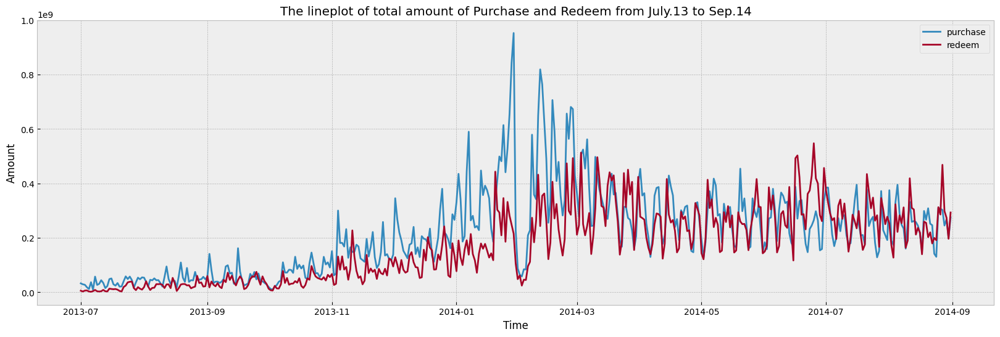

In [9]:
# 画出每日总购买与赎回量的时间序列图

fig = plt.figure(figsize=(20,6))
plt.plot(total_balance['date'], total_balance['total_purchase_amt'],label='purchase')
plt.plot(total_balance['date'], total_balance['total_redeem_amt'],label='redeem')

plt.legend(loc='best')
plt.title("The lineplot of total amount of Purchase and Redeem from July.13 to Sep.14")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

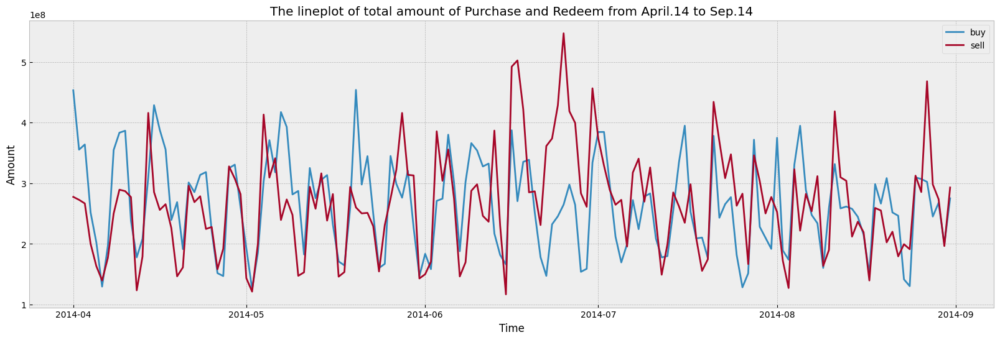

In [10]:
# 画出4月份以后的时间序列图

total_balance_1 = total_balance[total_balance['date'] >= pd.to_datetime('2014-4-1')]
fig = plt.figure(figsize=(20,6))
plt.plot(total_balance_1['date'], total_balance_1['total_purchase_amt'], label = 'buy')
plt.plot(total_balance_1['date'], total_balance_1['total_redeem_amt'], label = 'sell')
plt.legend()
plt.title("The lineplot of total amount of Purchase and Redeem from April.14 to Sep.14")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

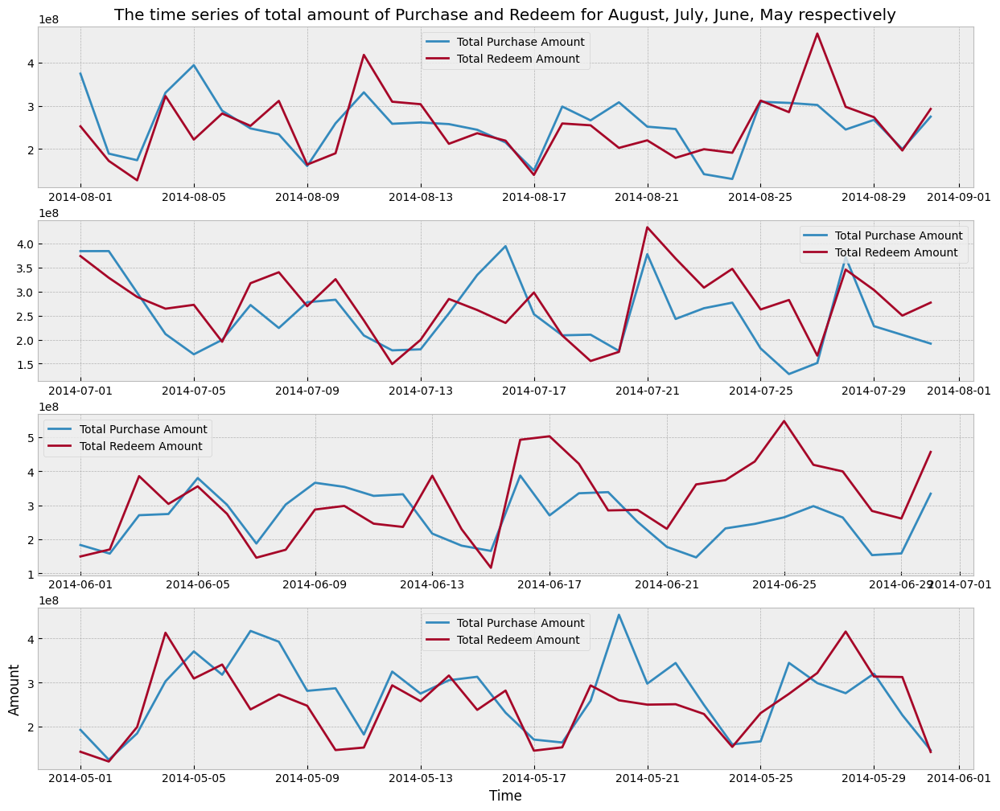

In [11]:
# 分别画出每个月中每天购买赎回量的时间序列图


fig = plt.figure(figsize=(15, 12))

plt.subplot(4, 1, 1)
plt.title("The time series of total amount of Purchase and Redeem for August, July, June, May respectively")

total_balance_2 = total_balance[total_balance['date'] >= pd.to_datetime('2014/8/1')]
plt.plot(total_balance_2['date'], total_balance_2['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_2['date'], total_balance_2['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

total_balance_3 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/7/1')) & (total_balance['date'] < pd.to_datetime('2014/8/1'))]
plt.subplot(4, 1, 2)
plt.plot(total_balance_3['date'], total_balance_3['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_3['date'], total_balance_3['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

total_balance_4 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/6/1')) & (total_balance['date'] < pd.to_datetime('2014/7/1'))]
plt.subplot(4, 1, 3)
plt.plot(total_balance_4['date'], total_balance_4['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_4['date'], total_balance_4['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

total_balance_5 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/1')) & (total_balance['date'] < pd.to_datetime('2014/6/1'))]
plt.subplot(4, 1, 4)
plt.plot(total_balance_5['date'], total_balance_5['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_5['date'], total_balance_5['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()


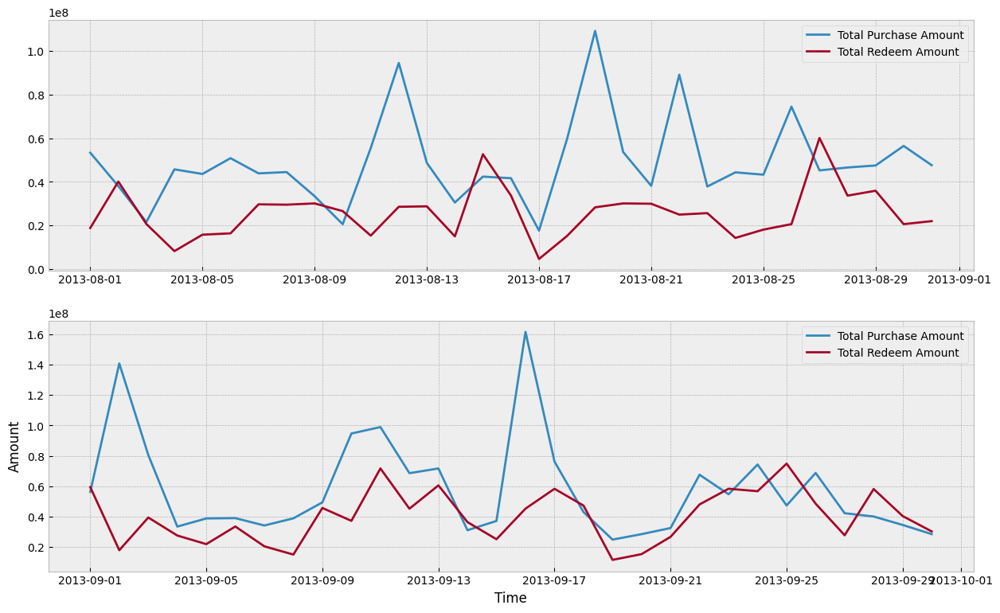

In [12]:
# 分别画出13年8月与9月每日购买赎回量的时序图

fig = plt.figure(figsize=(15, 9))

# 2013年8月的数据
total_balance_last8 = total_balance[(total_balance['date'] >= pd.to_datetime('2013-8-1')) & (total_balance['date'] < pd.to_datetime('2013-9-1'))]
plt.subplot(2, 1, 1)
plt.plot(total_balance_last8['date'], total_balance_last8['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_last8['date'], total_balance_last8['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

# 2013年9月的数据
total_balance_last9 = total_balance[(total_balance['date'] >= pd.to_datetime('2013-9-1')) & (total_balance['date'] < pd.to_datetime('2013-10-1'))]
plt.subplot(2, 1, 2)
plt.plot(total_balance_last9['date'], total_balance_last9['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_last9['date'], total_balance_last9['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

## 1.2)翌日特征分析

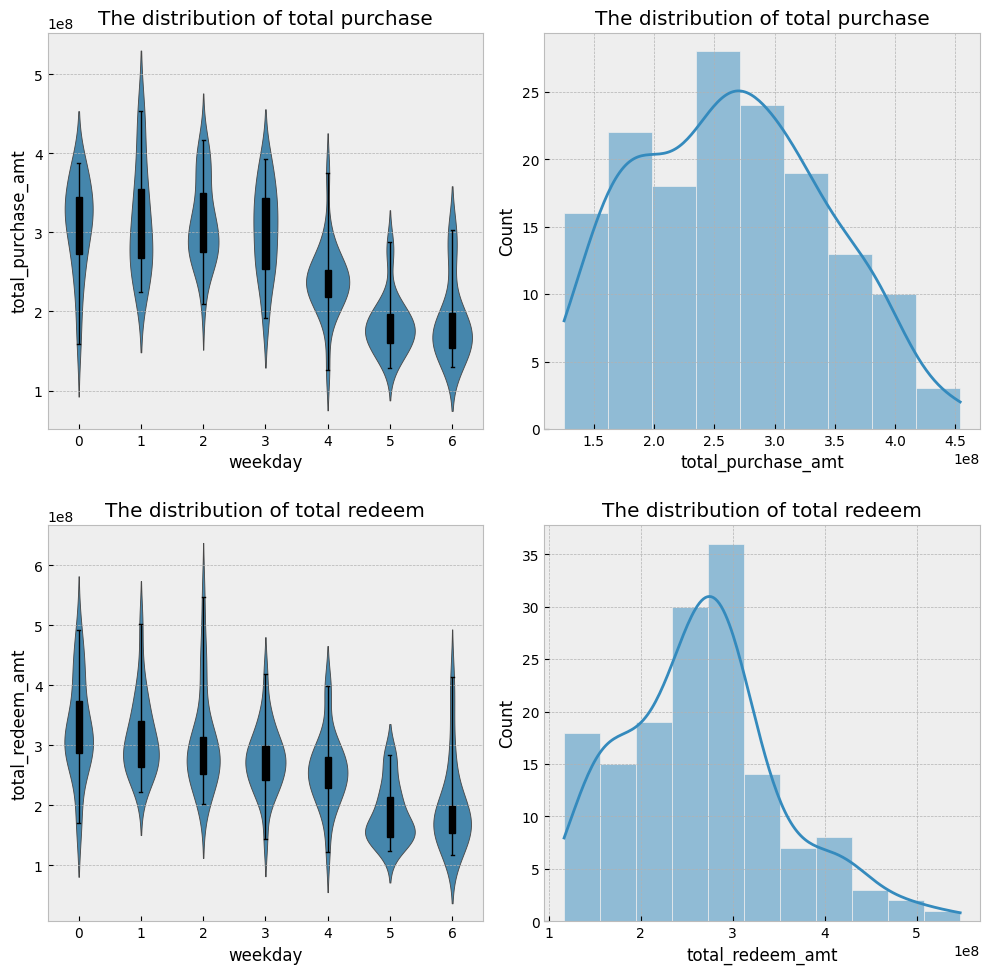

In [13]:
# 画出每个翌日的数据分布于整体数据的分布图

fig = plt.figure(figsize=(10, 10))

# Violin plot with boxplot of total purchase amount by weekday
plt.subplot(2, 2, 1)
plt.title('The distribution of total purchase')
sns.violinplot(x='weekday', y='total_purchase_amt', data=total_balance_1, inner=None)
sns.boxplot(x='weekday', y='total_purchase_amt', data=total_balance_1, whis=[0, 100], width=0.1, color='k')

# Distribution plot of total purchase amount
plt.subplot(2, 2, 2)
plt.title('The distribution of total purchase')
sns.histplot(total_balance_1['total_purchase_amt'].dropna(), kde=True)

# Violin plot with boxplot of total redeem amount by weekday
plt.subplot(2, 2, 3)
plt.title('The distribution of total redeem')
sns.violinplot(x='weekday', y='total_redeem_amt', data=total_balance_1, inner=None)
sns.boxplot(x='weekday', y='total_redeem_amt', data=total_balance_1, whis=[0, 100], width=0.1, color='k')

# Distribution plot of total redeem amount
plt.subplot(2, 2, 4)
plt.title('The distribution of total redeem')
sns.histplot(total_balance_1['total_redeem_amt'].dropna(), kde=True)

plt.tight_layout()
plt.show()


In [14]:
# 按翌日对数据聚合后取均值

week_sta = total_balance_1[['total_purchase_amt', 'total_redeem_amt', 'weekday']].groupby('weekday', as_index=False).mean()

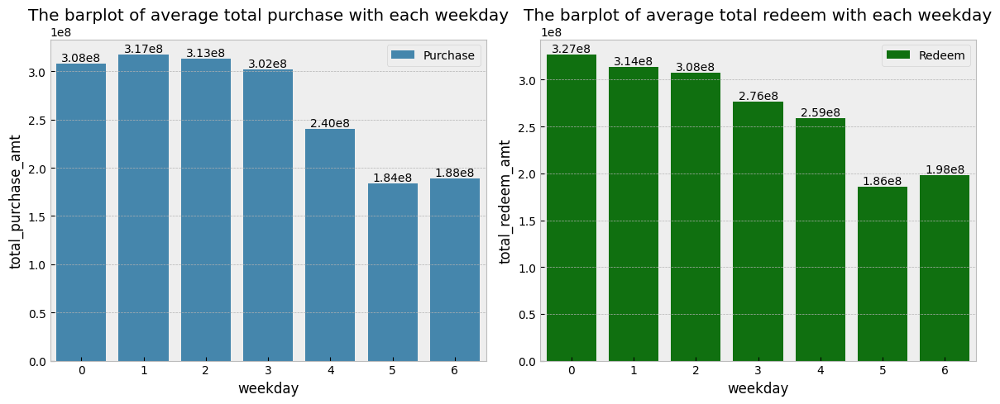

In [15]:
# 分析翌日的中位数特征


# 定义一个函数来将标签转换为 e^8 单位
def format_label(value):
    return f'{value / 10**8:.2f}e8'

plt.figure(figsize=(12, 5))

# Barplot of average total purchase with each weekday
ax = plt.subplot(1, 2, 1)
plt.title('The barplot of average total purchase with each weekday')
sns.barplot(x="weekday", y="total_purchase_amt", data=week_sta, ax=ax, label='Purchase')
ax.legend()
# 添加数据标签并转换为 e^8 单位
for container in ax.containers:
    labels = [format_label(v) for v in container.datavalues]
    ax.bar_label(container, labels=labels)

# Barplot of average total redeem with each weekday
ax = plt.subplot(1, 2, 2)
plt.title('The barplot of average total redeem with each weekday')
sns.barplot(x="weekday", y="total_redeem_amt", data=week_sta, color='green', ax=ax, label='Redeem')
ax.legend()
# 添加数据标签并转换为 e^8 单位
for container in ax.containers:
    labels = [format_label(v) for v in container.datavalues]
    ax.bar_label(container, labels=labels)

plt.tight_layout()
plt.show()


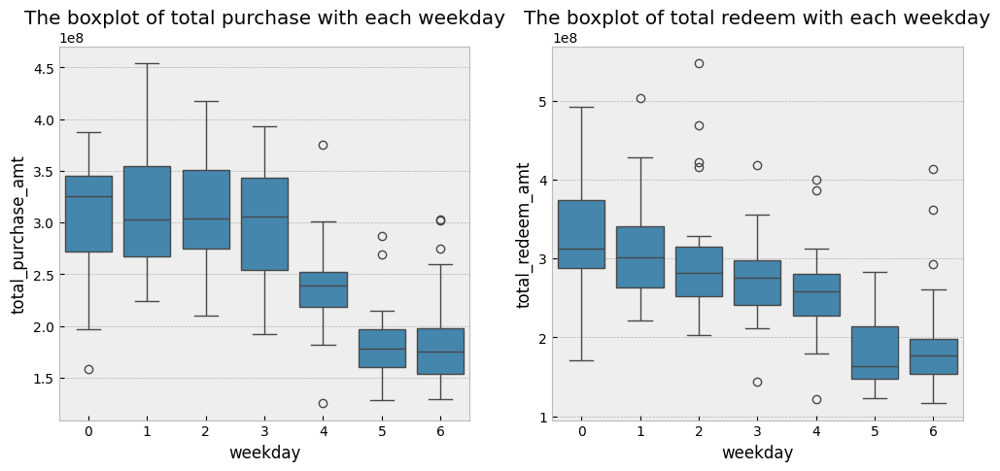

In [16]:
# 画出翌日的箱型图

plt.figure(figsize=(12, 5))
ax = plt.subplot(1,2,1)
plt.title('The boxplot of total purchase with each weekday')
ax = sns.boxplot(x="weekday", y="total_purchase_amt", data=total_balance_1)
ax = plt.subplot(1,2,2)
plt.title('The boxplot of total redeem with each weekday')
ax = sns.boxplot(x="weekday", y="total_redeem_amt", data=total_balance_1)

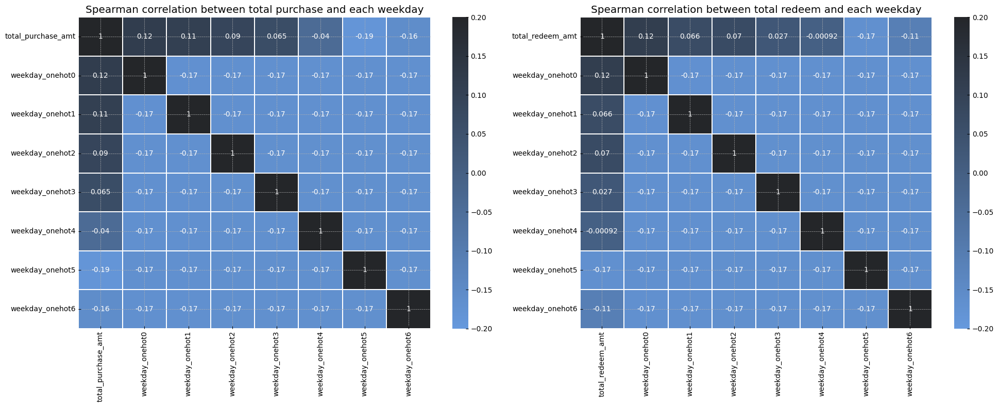

In [17]:
# 使用OneHot编码将星期几作为特征，然后计算了购买和赎回金额与每个星期几之间的Spearman相关系数

# OneHot encoding weekday feature
encoder = OneHotEncoder()
week_feature = encoder.fit_transform(total_balance[['weekday']]).toarray()
week_feature_names = [f'weekday_onehot{i}' for i in range(week_feature.shape[1])]
week_feature_df = pd.DataFrame(week_feature, columns=week_feature_names)

# Concatenating original data with encoded features
feature = pd.concat([total_balance, week_feature_df], axis=1)

# Plotting correlations
plt.figure(figsize=(20, 8))

# Correlation for total purchase amount
plt.subplot(1, 2, 1)
plt.title('Spearman correlation between total purchase and each weekday')
sns.heatmap(feature.corr(method='spearman')[['total_purchase_amt'] + week_feature_names].loc[['total_purchase_amt'] + week_feature_names],
            linewidths=0.1, vmax=0.2, vmin=-0.2, cmap = sns.dark_palette("#69d", reverse=True, as_cmap=True), annot=True)

# Correlation for total redeem amount
plt.subplot(1, 2, 2)
plt.title('Spearman correlation between total redeem and each weekday')
sns.heatmap(feature.corr(method='spearman')[['total_redeem_amt'] + week_feature_names].loc[['total_redeem_amt'] + week_feature_names],
            linewidths=0.1, vmax=0.2, vmin=-0.2, cmap = sns.dark_palette("#69d", reverse=True, as_cmap=True), annot=True)

plt.tight_layout()
plt.show()

## 1.3)月份特征分析

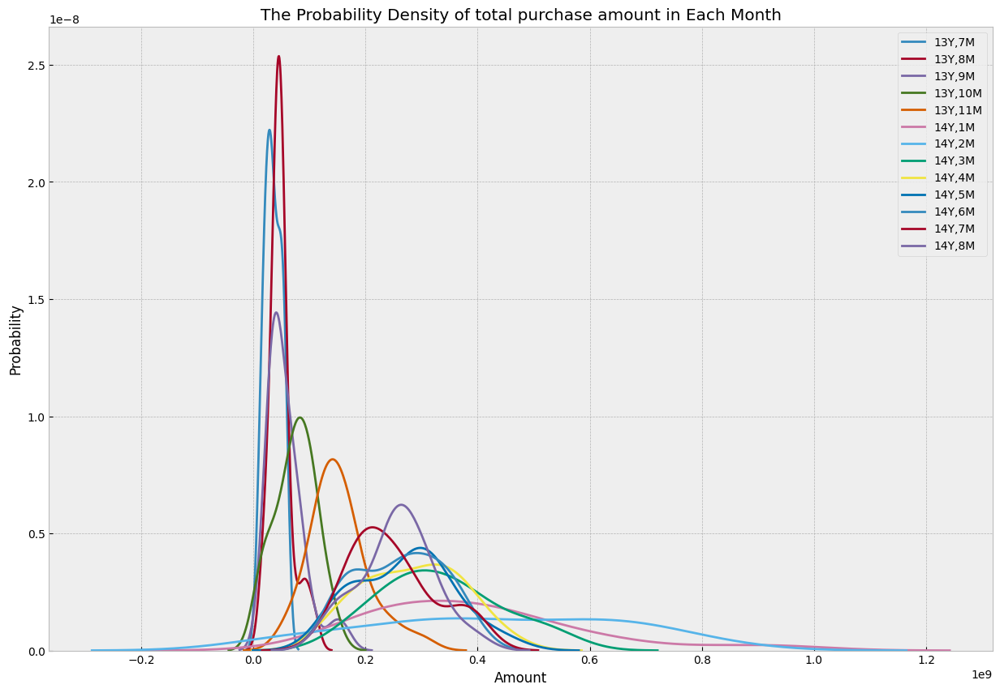

In [18]:
# 画出每个月的购买总量分布估计图(kdeplot)

plt.figure(figsize=(15,10))
plt.title('The Probability Density of total purchase amount in Each Month')
plt.ylabel('Probability')
plt.xlabel('Amount')
for i in range(7, 12):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2013/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2013/{}/1'.format(i+1)))]['total_purchase_amt'],label='13Y,'+str(i)+'M')
for i in range(1, 9):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_purchase_amt'],label='14Y,'+str(i)+'M')
plt.legend()

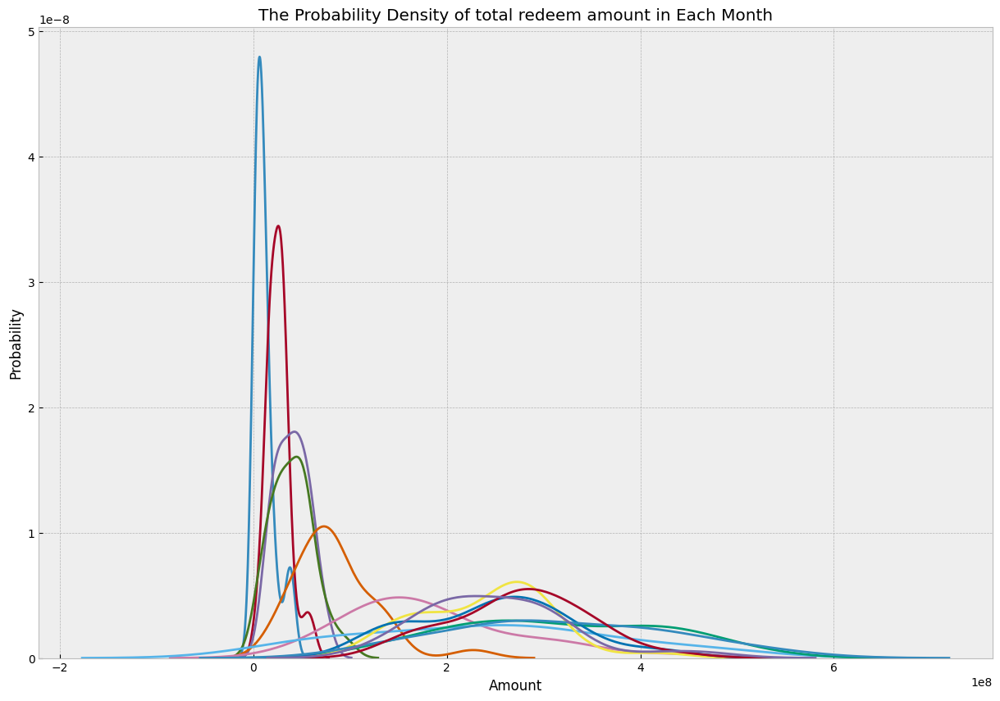

In [19]:
# 画出每个月的赎回总量分布估计图(kdeplot)

plt.figure(figsize=(15,10))
plt.title('The Probability Density of total redeem amount in Each Month')
plt.ylabel('Probability')
plt.xlabel('Amount')
for i in range(7, 12):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2013/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2013/{}/1'.format(i+1)))]['total_redeem_amt'],label='13Y,'+str(i)+'M')
for i in range(1, 9):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_redeem_amt'],label='14Y,'+str(i)+'M')

展示了每个月的总购买（赎回）金额的概率密度分布

- 其中，13年7月（13Y,7M）的峰值最高，这表明在这个月里，总购买金额集中在某个特定值附近的次数较多。其他大部分月份的峰值较低且分布较宽，表明这些月份的购买金额分布更为分散。

- 像13年8月（13Y,8M）和13年9月（13Y,9M）这样的月份也显示出相对较高的峰值，说明这些月份的购买行为比较一致，总购买金额集中在较为相似的数值附近。相比之下，14年2月（14Y,2M）和14年4月（14Y,4M）这些月份的峰值较宽且较低，表明这些月份的购买金额分布更广，可能是因为购买金额较为分散。

- 通过比较2013年下半年和2014年上半年的密度分布，可以观察到购买行为随时间的变化。峰值整体变得更低且更宽，这可能表明购买金额的变异性增加或者购买行为发生了变化。


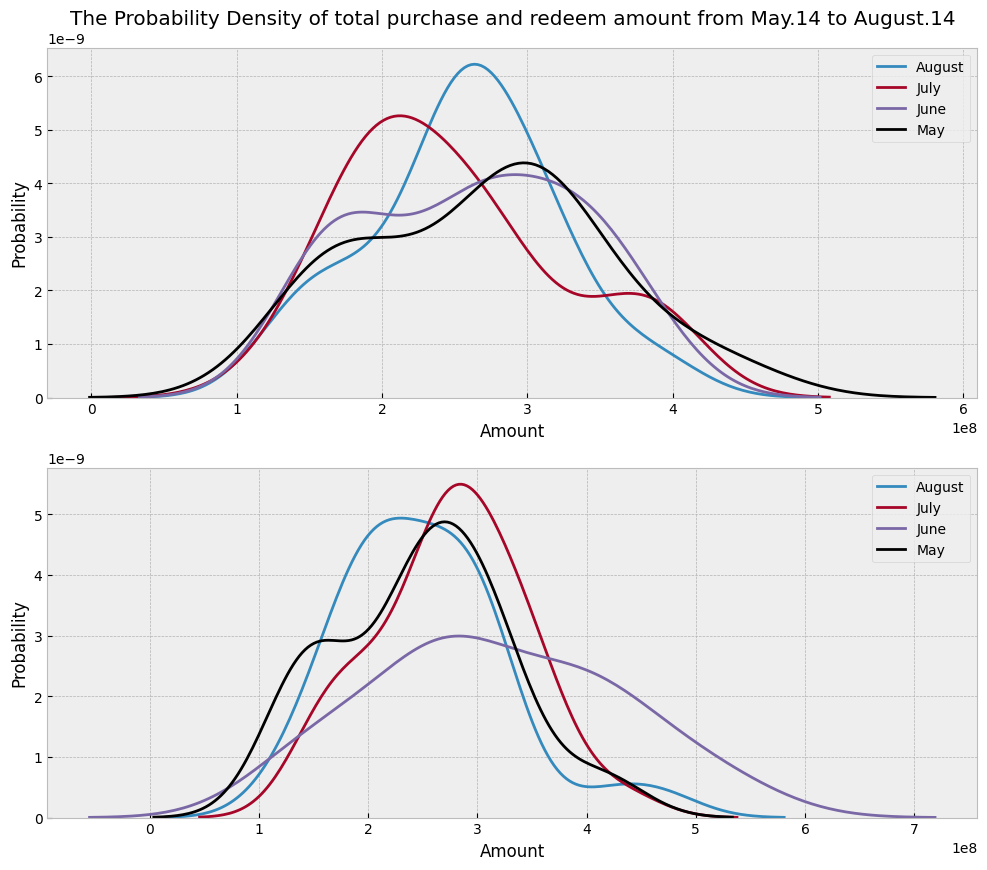

In [20]:
# 画出14年五六七八月份的分布估计图

plt.figure(figsize=(12,10))

ax = plt.subplot(2,1,1)
plt.title('The Probability Density of total purchase and redeem amount from May.14 to August.14')
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_2['total_purchase_amt'],label='August')
ax = sns.kdeplot(total_balance_3['total_purchase_amt'],label='July')
ax = sns.kdeplot(total_balance_4['total_purchase_amt'],label='June')
ax = sns.kdeplot(total_balance_5['total_purchase_amt'],color='Black',label='May')
plt.legend()
ax = plt.subplot(2,1,2)
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_2['total_redeem_amt'],label='August')
ax = sns.kdeplot(total_balance_3['total_redeem_amt'],label='July')
ax = sns.kdeplot(total_balance_4['total_redeem_amt'],label='June')
ax = sns.kdeplot(total_balance_5['total_redeem_amt'],color='Black',label='May')
plt.legend()

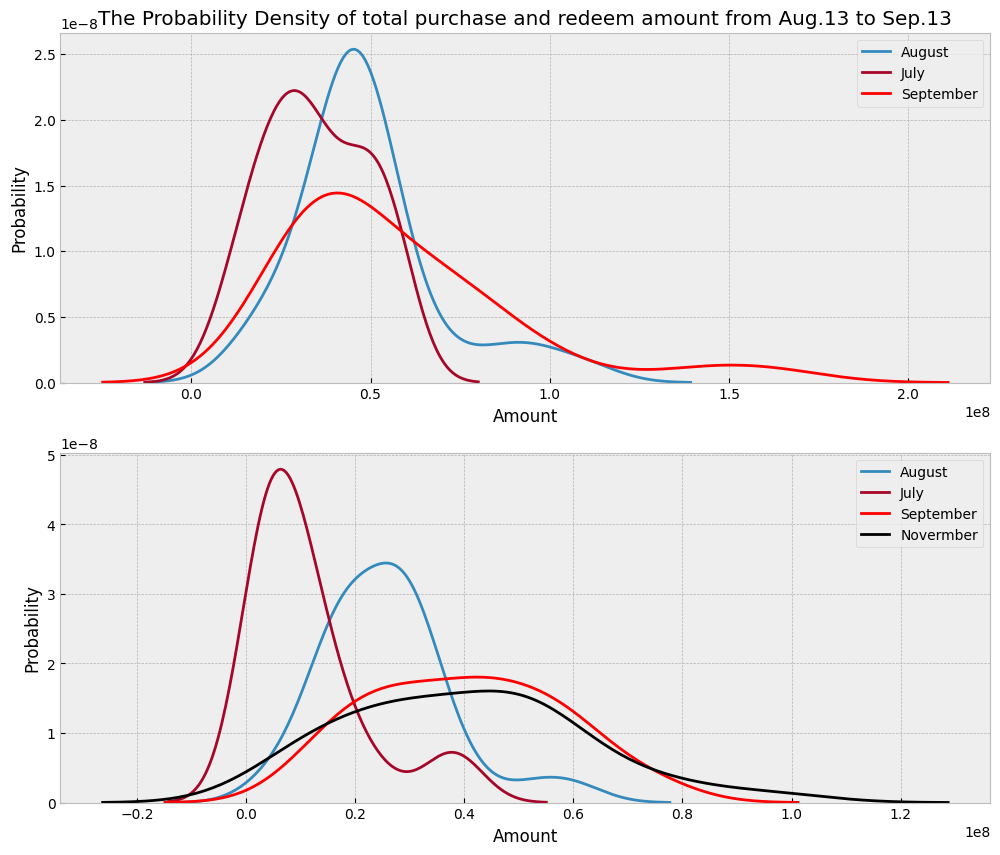

In [21]:
# 画出13年八月到九月份的分布估计图

total_balance_last_7 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/7/1')) & (total_balance['date'] < pd.to_datetime('2013/8/1'))]
total_balance_last_8 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/8/1')) & (total_balance['date'] < pd.to_datetime('2013/9/1'))]
total_balance_last_9 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/9/1')) & (total_balance['date'] < pd.to_datetime('2013/10/1'))]
total_balance_last_10 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/10/1')) & (total_balance['date'] < pd.to_datetime('2013/11/1'))]
plt.figure(figsize=(12,10))
ax = plt.subplot(2,1,1)
plt.title('The Probability Density of total purchase and redeem amount from Aug.13 to Sep.13')
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_last_8['total_purchase_amt'],label='August')
ax = sns.kdeplot(total_balance_last_7['total_purchase_amt'],label='July')
ax = sns.kdeplot(total_balance_last_9['total_purchase_amt'],color='Red',label='September')
plt.legend()

ax = plt.subplot(2,1,2)
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_last_8['total_redeem_amt'],label='August')
ax = sns.kdeplot(total_balance_last_7['total_redeem_amt'],label='July')
ax = sns.kdeplot(total_balance_last_9['total_redeem_amt'],color='Red',label='September')
ax = sns.kdeplot(total_balance_last_10['total_redeem_amt'],color='Black',label='Novermber')
plt.legend()

## 1.4)日期特征分析

In [22]:
# 按照每天聚合数据集

day_sta = total_balance_2[['total_purchase_amt', 'total_redeem_amt', 'day']].groupby('day', as_index=False).mean()

Text(0.5, 1.0, 'The total Purchase in Aug.14')

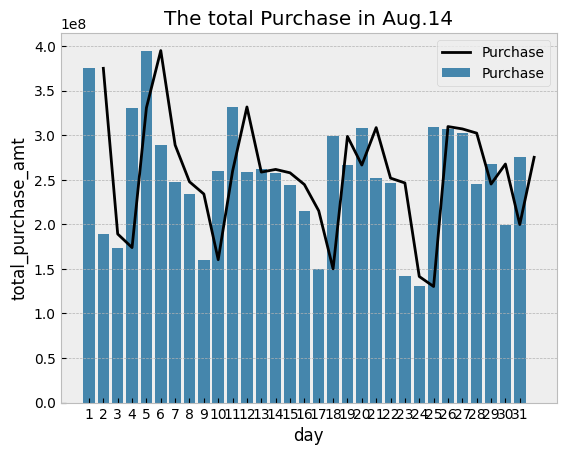

In [23]:
# 获取聚合后每月购买分布的柱状图

ax = sns.barplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase')
ax = sns.lineplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase', color = 'k')
ax.legend()
plt.title("The total Purchase in Aug.14")

Text(0.5, 1.0, 'The total Redeem in Aug.14')

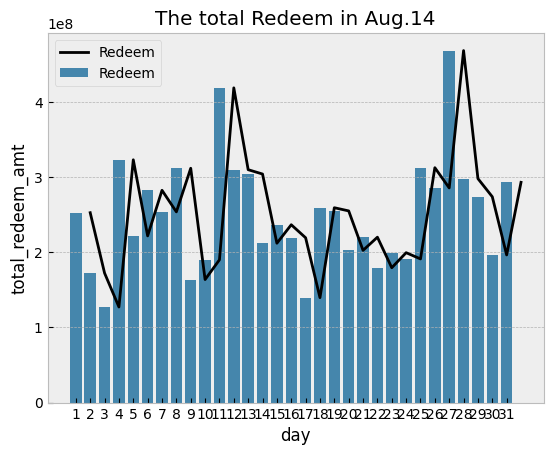

In [24]:
# 获取聚合后每月赎回分布的柱状图

ax = sns.barplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem')
ax = sns.lineplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem', color = 'k')
ax.legend()
plt.title("The total Redeem in Aug.14")

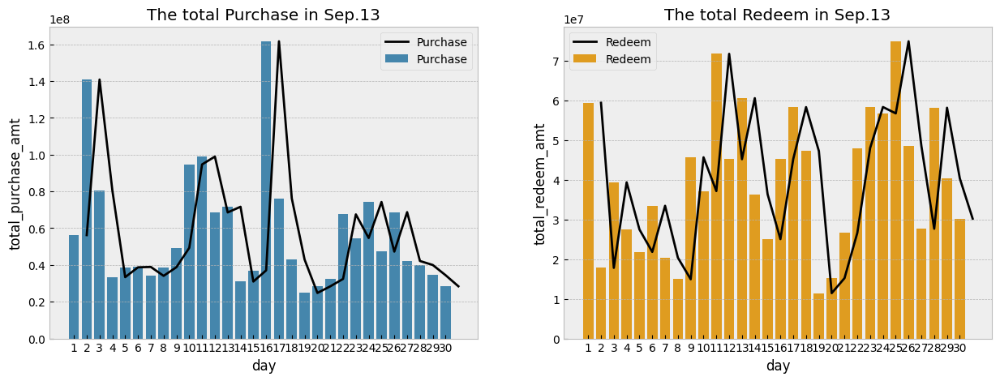

In [25]:
# 画出13年九月份的分布图

plt.figure(figsize=(15,5))
day_sta = total_balance_last_9[['total_purchase_amt', 'total_redeem_amt', 'day']].groupby('day', as_index=False).mean()
plt.subplot(1,2,1)
plt.title("The total Purchase in Sep.13")
ax = sns.barplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase')
ax = sns.lineplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase', color = 'k')
plt.subplot(1,2,2)
plt.title("The total Redeem in Sep.13")
bx = sns.barplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem', color = 'orange')
bx = sns.lineplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem', color = 'k')

我们发现去年九月的数据有几点周特征

在九月有几点很奇怪：

* 第1天
* 第2天
* 第16天(买得特别多)——中秋节前的三天和周一
* 第11天和第25天(这两天都是周三，赎回金额较多）
* 第18，19，20天(赎回金额和购买金额都非常低）

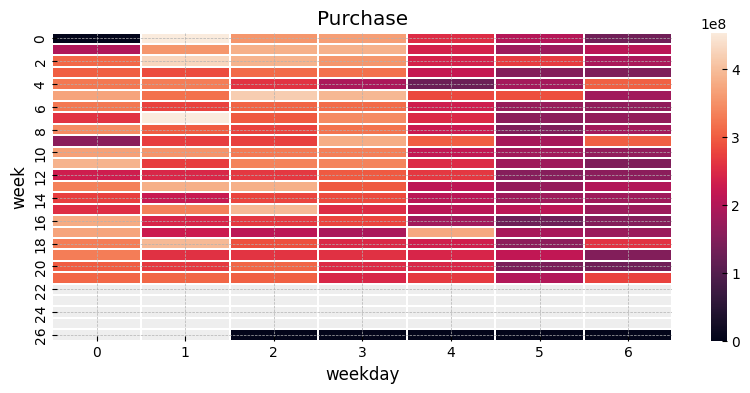

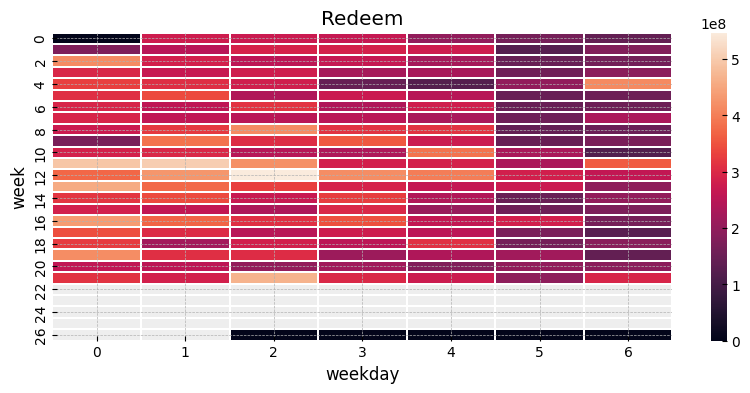

In [26]:
# 画出历史所有天的热力图

# 确保 week 和 weekday 列都是整数
total_balance_1['week'] = total_balance_1['week'].astype(int)
total_balance_1['weekday'] = total_balance_1['weekday'].astype(int)

# 创建购买金额的热力图
test_purchase = np.zeros((max(total_balance_1['week']) - min(total_balance_1['week']) + 1, 7))
test_purchase[total_balance_1['week'] - min(total_balance_1['week']), total_balance_1['weekday']] = total_balance_1['total_purchase_amt']

f, ax = plt.subplots(figsize=(10, 4))
sns.heatmap(test_purchase, linewidths=0.1, ax=ax)
ax.set_title("Purchase")
ax.set_xlabel('weekday')
ax.set_ylabel('week')

# 创建赎回金额的热力图
test_redeem = np.zeros((max(total_balance_1['week']) - min(total_balance_1['week']) + 1, 7))
test_redeem[total_balance_1['week'] - min(total_balance_1['week']), total_balance_1['weekday']] = total_balance_1['total_redeem_amt']

f, ax = plt.subplots(figsize=(10, 4))
sns.heatmap(test_redeem, linewidths=0.1, ax=ax)
ax.set_title("Redeem")
ax.set_xlabel('weekday')
ax.set_ylabel('week')

plt.show()

从热力图我们可以发现，第四周和星期六(weekday 6)特别奇怪,第12周和星期二(weekday2)也是

In [27]:
# 对于热力图中异常点的数据分析.1

total_balance_1[(total_balance_1['week'] == 4 + min(total_balance_1['week'])) & (total_balance_1['weekday'] == 6)]

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
307,2014-05-04,303087562.0000,413222034.0000,4,5,2014,18,6


五月四日在中国是特殊的一天，这是劳动节之后的第一个工作日

In [28]:
# 对于热力图中异常点的数据分析.2

total_balance_1[(total_balance_1['week'] == 12 + min(total_balance_1['week'])) & (total_balance_1['weekday'] == 2)]

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
359,2014-06-25,264663201.0000,547295931.0000,25,6,2014,26,2


在 2016-06-25 用户赎回金额远远大于购买金额

## 1.5)对于节假期的分析
* 清明假期(四月五日 - 四月七日）
* 劳动节假期(五月一日 - 五月五日)
* 端午节假期(五月三十一日 - 六月二日）
*  中秋节假期(九月六日 - 九月八日）

* 母亲节(五月十三)
* 父亲节(六月十七)
* 天猫购物节(六月十八日)
* 教师节(九月九日)

In [29]:

# 获取节假日的数据

qingming = total_balance[(total_balance['date'] >= pd.to_datetime('2014/4/5')) & (total_balance['date'] < pd.to_datetime('2014/4/8'))]
labour = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/1')) & (total_balance['date'] < pd.to_datetime('2014/5/4'))]
duanwu = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/31')) & (total_balance['date'] < pd.to_datetime('2014/6/3'))]
data618 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/6/10')) & (total_balance['date'] < pd.to_datetime('2014/6/20'))]

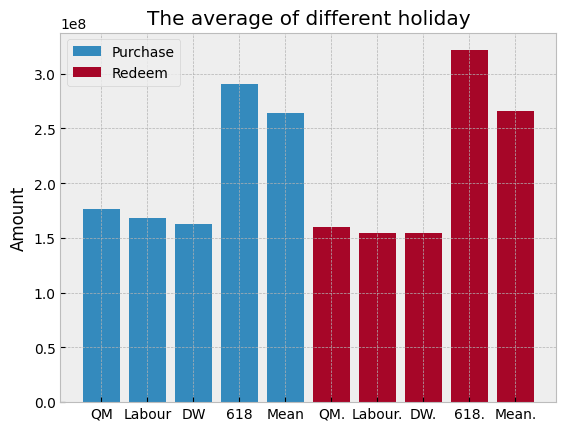

In [30]:
# 画出节假日与平时的均值

fig = plt.figure()
index_list = ['QM','Labour','DW','618','Mean']
label_list = [np.mean(qingming['total_purchase_amt']), np.mean(labour['total_purchase_amt']),np.mean(duanwu['total_purchase_amt']),np.mean(data618['total_purchase_amt']),np.mean(total_balance_1['total_purchase_amt'])]
plt.bar(index_list, label_list, label="Purchase")

index_list = ['QM.','Labour.','DW.','618.','Mean.']
label_list = [np.mean(qingming['total_redeem_amt']), np.mean(labour['total_redeem_amt']),np.mean(duanwu['total_redeem_amt']),np.mean(data618['total_redeem_amt']),np.mean(total_balance_1['total_redeem_amt'])]
plt.bar(index_list, label_list, label="Redeem")
plt.title("The average of different holiday")
plt.ylabel("Amount")
plt.legend()
plt.show()

## 1.6)对于节假日周边日期的分析

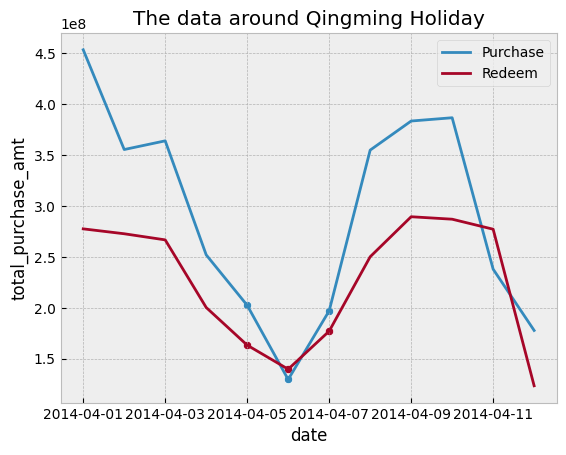

In [31]:
# 画出清明节与周边日期的时序图

qingming_around = total_balance[(total_balance['date'] >= pd.to_datetime('2014/4/1')) & (total_balance['date'] < pd.to_datetime('2014/4/13'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=qingming_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=qingming_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=qingming, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=qingming, ax=ax)
plt.title("The data around Qingming Holiday")
ax.legend()

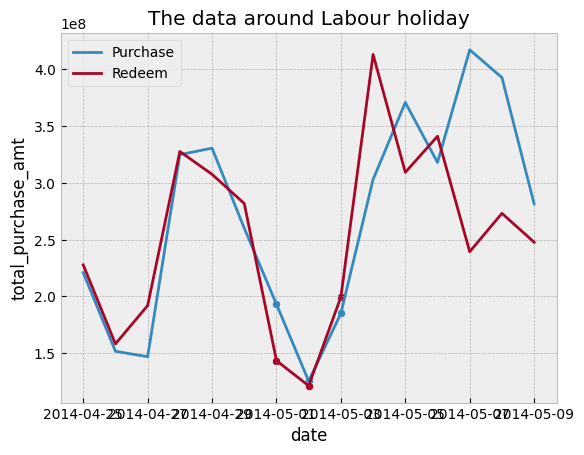

In [32]:
# 画出劳动节与周边日期的时序图

labour_around = total_balance[(total_balance['date'] >= pd.to_datetime('2014/4/25')) & (total_balance['date'] < pd.to_datetime('2014/5/10'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=labour_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=labour_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=labour, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=labour, ax=ax)
plt.title("The data around Labour holiday")
ax.legend()

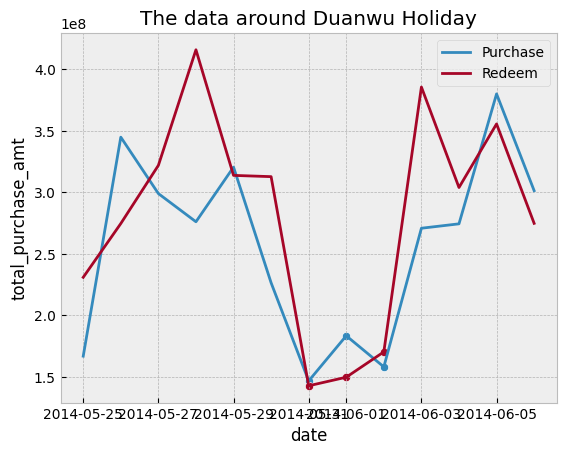

In [33]:
# # 画出端午节与周边日期的时序图

duanwu_around = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/25')) & (total_balance['date'] < pd.to_datetime('2014/6/7'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=duanwu_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=duanwu_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=duanwu, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=duanwu, ax=ax)
plt.title("The data around Duanwu Holiday")
ax.legend()

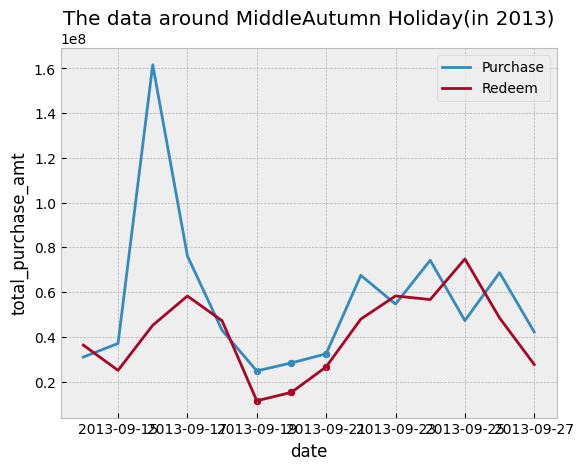

In [34]:
# 画出中秋与周边日期的时序图

zhongqiu = total_balance[(total_balance['date'] >= pd.to_datetime('2013/9/19')) & (total_balance['date'] < pd.to_datetime('2013/9/22'))]
zhongqiu_around = total_balance[(total_balance['date'] >= pd.to_datetime('2013/9/14')) & (total_balance['date'] < pd.to_datetime('2013/9/28'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=zhongqiu_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=zhongqiu_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=zhongqiu, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=zhongqiu, ax=ax)
plt.title("The data around MiddleAutumn Holiday(in 2013)")
ax.legend()

## 1.7)对于异常值的分析

Text(0.5, 1.0, 'The abnormal value of total purchase')

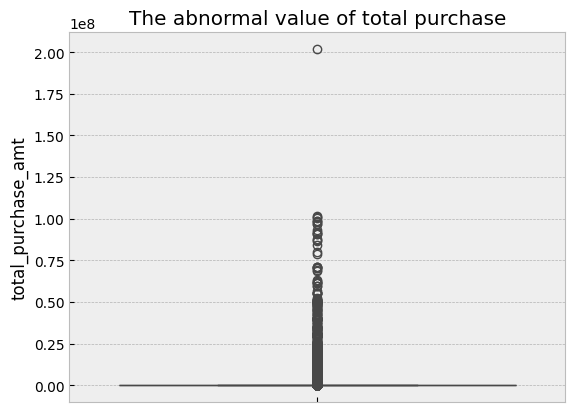

In [35]:
# 画出用户交易纪录的箱型图

sns.boxplot(balance_data['total_purchase_amt'])
plt.title("The abnormal value of total purchase")

In [36]:
# 对于购买2e8的用户的交易行为分析

balance_data[balance_data['user_id'] == 14592].sort_values(by = ['report_date','total_redeem_amt'],ascending = [True,False]).head()

,user_id,report_date,tBalance,yBalance,total_purchase_amt,direct_purchase_amt,purchase_bal_amt,purchase_bank_amt,total_redeem_amt,consume_amt,transfer_amt,tftobal_amt,tftocard_amt,share_amt,category1,category2,category3,category4,date,day,month,year,week,weekday
1453312,14592,20131101,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2013-11-01,1,11,2013,44,4
1453311,14592,20131104,99457728,0,201768328,201768328,201275171,493157,102310600,0,102310600,0,102310600,0,NaN,NaN,NaN,NaN,2013-11-04,4,11,2013,45,0
1453313,14592,20131105,97458675,99457728,4899446,4899446,4899446,0,6898499,0,6898499,0,6898499,0,NaN,NaN,NaN,NaN,2013-11-05,5,11,2013,45,1
1453210,14592,20131106,97662610,97458675,203935,191347,0,191347,0,0,0,0,0,12588,NaN,NaN,NaN,NaN,2013-11-06,6,11,2013,45,2
1453310,14592,20131107,97675216,97662610,12606,0,0,0,0,0,0,0,0,12606,NaN,NaN,NaN,NaN,2013-11-07,7,11,2013,45,3


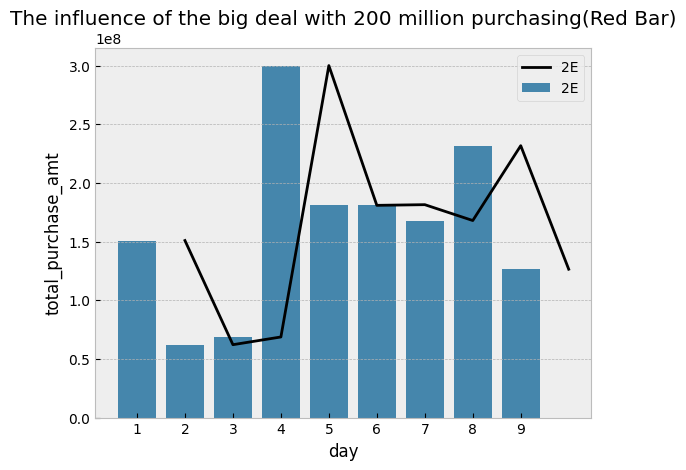

In [37]:
# 画出单笔交易为2e8的那天的总交易量及附近几天的交易量

e2 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/11/1')) & (total_balance['date'] < pd.to_datetime('2013/11/10'))]
ax = sns.barplot(x="day", y="total_purchase_amt", data=e2, label='2E')
ax = sns.lineplot(x="day", y="total_purchase_amt", data=e2, label='2E', color = 'k')
plt.title("The influence of the big deal with 200 million purchasing(Red Bar)")
ax.legend()

Text(0.5, 1.0, 'The Biggest deal happend in each day')

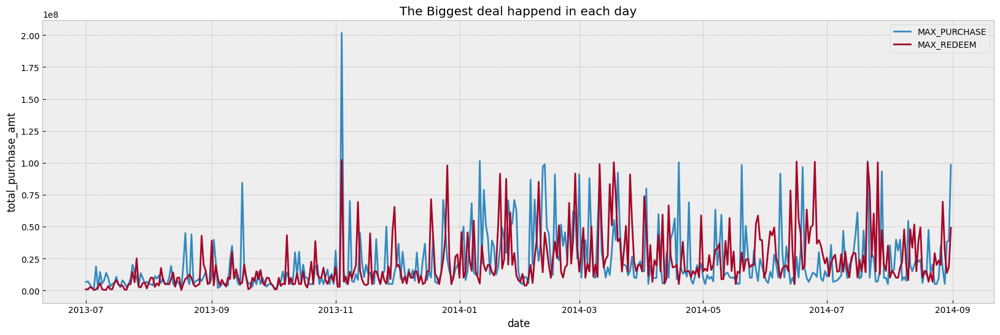

In [38]:
# 画出每日单笔最大交易的时序图

plt.figure(figsize=(20, 6))
ax = sns.lineplot(x="date", y="total_purchase_amt", data=balance_data[['total_purchase_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_PURCHASE')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=balance_data[['total_redeem_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_REDEEM')
plt.title("The Biggest deal happend in each day")

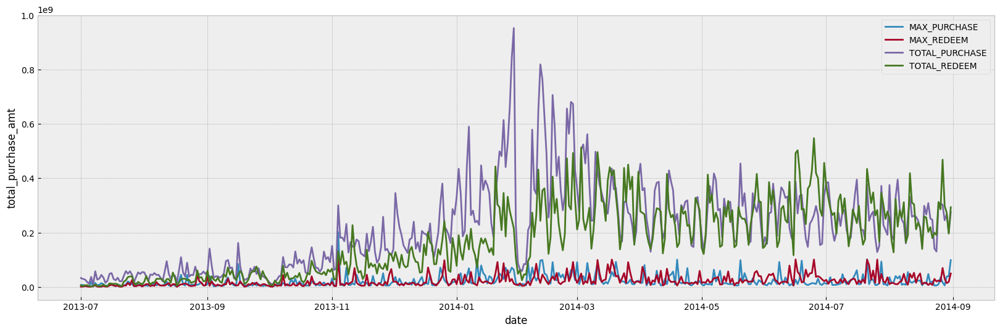

In [39]:
# 画出每日单笔最大交易以及总交易额的时序图

plt.figure(figsize=(20, 6))
ax = sns.lineplot(x="date", y="total_purchase_amt", data=balance_data[['total_purchase_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_PURCHASE')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=balance_data[['total_redeem_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_REDEEM')
ax = sns.lineplot(x="date", y="total_purchase_amt", data=balance_data[['total_purchase_amt', 'date']].groupby('date', as_index=False).sum(), label='TOTAL_PURCHASE')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=balance_data[['total_redeem_amt', 'date']].groupby('date', as_index=False).sum(), label='TOTAL_REDEEM')

Text(0.5, 1.0, 'The frequency of super big deal(larger than 100million) in each month')

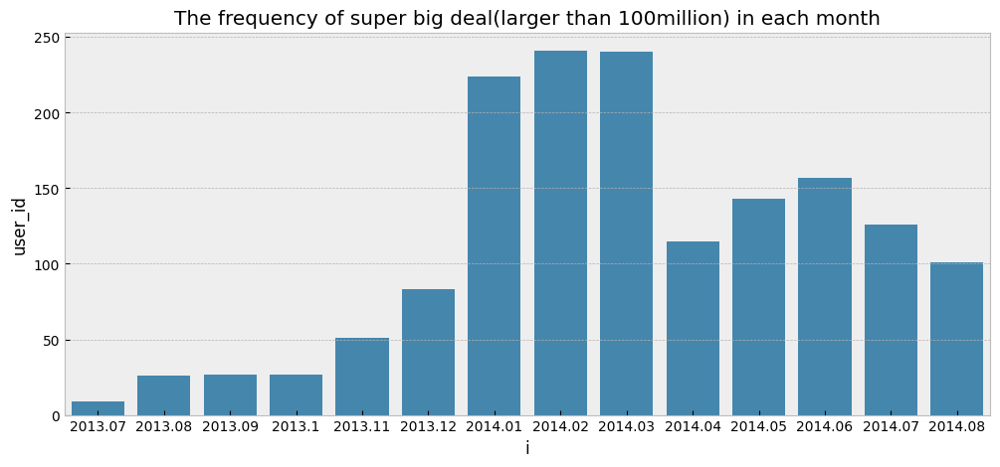

In [40]:

# 画出每个月大额交易的频次直方图

big_frequancy = balance_data[(balance_data['total_purchase_amt'] > 10000000) | (balance_data['total_redeem_amt'] > 10000000)][['month','year','user_id']].groupby(['year','month'], as_index=False).count()
big_frequancy['i'] = big_frequancy['year']  + big_frequancy['month'] / 100
plt.figure(figsize = [12,5])
ax = sns.barplot(x="i", y="user_id", data=big_frequancy)
plt.title("The frequency of super big deal(larger than 100million) in each month")

In [41]:
# 获取大额交易的数据集

balance_data['big_purchase'] = 0
balance_data.loc[balance_data['total_purchase_amt'] > 1000000, 'big_purchase'] = 1
balance_data['big_redeem'] = 0
balance_data.loc[balance_data['total_redeem_amt'] > 1000000, 'big_redeem'] = 1

In [42]:
# 对大额交易按每天做聚合操作

big_purchase = balance_data[balance_data['big_purchase'] == 1].groupby(['date'], as_index=False)['total_purchase_amt'].sum()
small_purchase = balance_data[balance_data['big_purchase'] == 0].groupby(['date'], as_index=False)['total_purchase_amt'].sum()
big_redeem = balance_data[balance_data['big_redeem'] == 1].groupby(['date'], as_index=False)['total_redeem_amt'].sum()
small_redeem = balance_data[balance_data['big_redeem'] == 0].groupby(['date'], as_index=False)['total_redeem_amt'].sum()

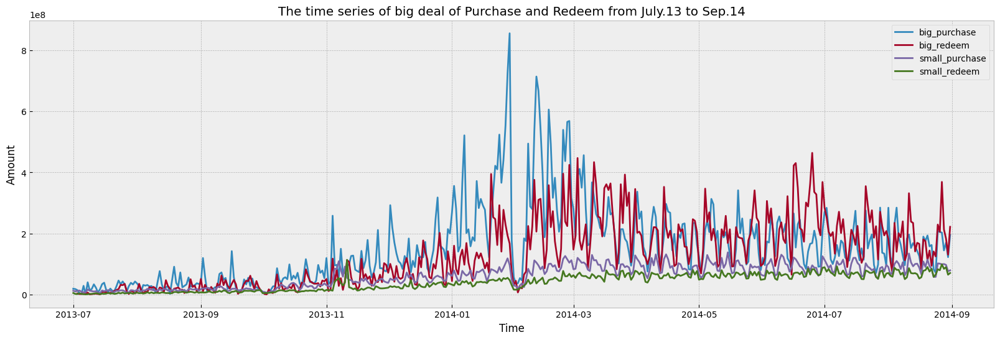

In [43]:

# 画出大额交易与小额交易的时序分布图

fig = plt.figure(figsize=(20,6))
plt.plot(big_purchase['date'], big_purchase['total_purchase_amt'],label='big_purchase')
plt.plot(big_redeem['date'], big_redeem['total_redeem_amt'],label='big_redeem')

plt.plot(small_purchase['date'], small_purchase['total_purchase_amt'],label='small_purchase')
plt.plot(small_redeem['date'], small_redeem['total_redeem_amt'],label='small_redeem')
plt.legend(loc='best')
plt.title("The time series of big deal of Purchase and Redeem from July.13 to Sep.14")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

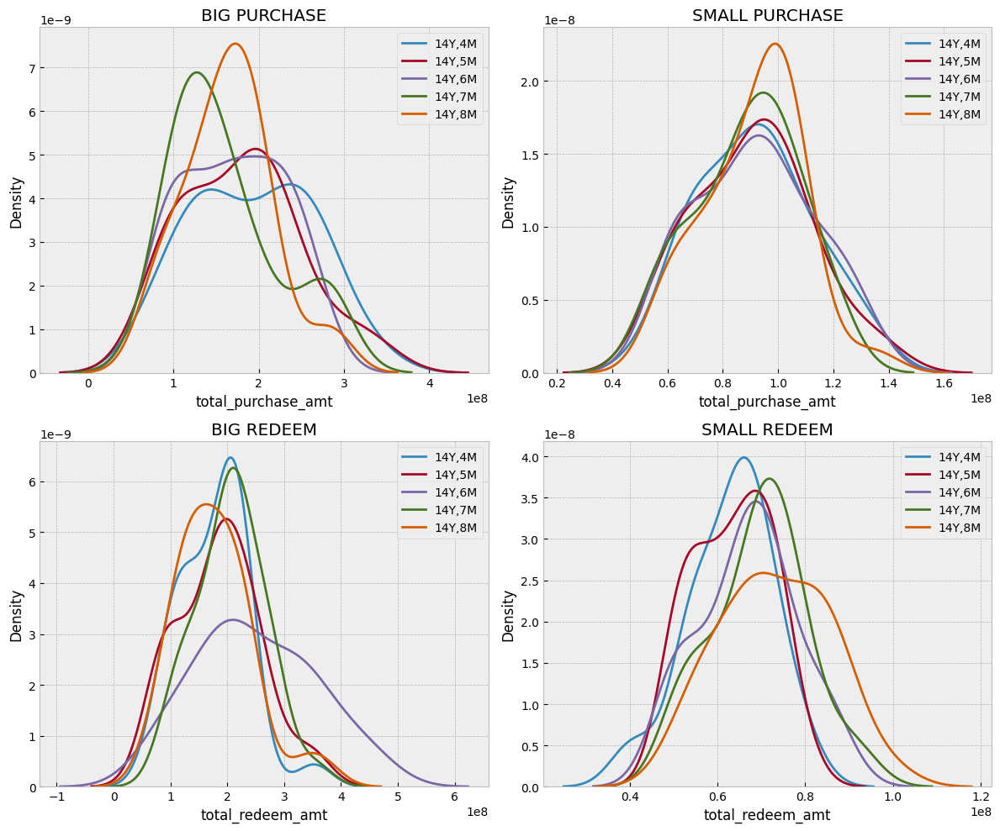

In [44]:
# 画出大额交易与小额交易的分布估计图
plt.figure(figsize=(12,10))

plt.subplot(2,2,1)
for i in range(4, 9):
    sns.kdeplot(big_purchase[(big_purchase['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (big_purchase['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_purchase_amt'],label='14Y,'+str(i)+'M')
plt.title('BIG PURCHASE')
plt.legend()

plt.subplot(2,2,2)
for i in range(4, 9):
    sns.kdeplot(small_purchase[(small_purchase['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (small_purchase['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_purchase_amt'],label='14Y,'+str(i)+'M')
plt.title('SMALL PURCHASE')
plt.legend()

plt.subplot(2,2,3)
for i in range(4, 9):
    sns.kdeplot(big_redeem[(big_redeem['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (big_redeem['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_redeem_amt'],label='14Y,'+str(i)+'M')
plt.title('BIG REDEEM')
plt.legend()

plt.subplot(2,2,4)
for i in range(4, 9):
    sns.kdeplot(small_redeem[(small_redeem['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (small_redeem['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_redeem_amt'],label='14Y,'+str(i)+'M')
plt.title('SMALL REDEEM')
plt.legend()

plt.tight_layout()
plt.show()

1. **大额购买（BIG PURCHASE）**：
   - 各个月份的大额购买金额分布存在明显的峰值，峰值大多集中在 1 到 2 亿之间。
   - 不同月份的分布略有差异，有些月份（如14年5月和14年6月）显示出较高的峰值，表明这些月份的大额购买行为更为集中。
   - 14年4月和14年8月的大额购买分布较为分散，表明这些月份的大额购买金额有较大的变异性。
2. **小额购买（SMALL PURCHASE）**：
   - 各个月份的小额购买金额分布比较集中，峰值大多集中在 0.8 到 1 亿之间。
   - 不同月份的小额购买行为相对一致，分布较为集中，没有明显的长尾现象。
3. **大额赎回（BIG REDEEM）**：
   - 各个月份的大额赎回金额分布存在明显的峰值，峰值大多集中在 2 到 3 亿之间。
   - 不同月份的分布差异较大，14年4月的大额赎回显示出一个明显的高峰，而14年8月的大额赎回分布较为分散。
   - 14年6月和14年7月的大额赎回行为较为一致，分布较为集中。
4. **小额赎回（SMALL REDEEM）**：
   - 各个月份的小额赎回金额分布比较集中，峰值大多集中在 0.6 到 0.8 亿之间。
   - 不同月份的小额赎回行为相对一致，分布较为集中，没有明显的长尾现象。

总的来说，分析大额和小额交易的分布，可以观察到：

- 大额交易（无论是购买还是赎回）的分布更为分散，峰值较高，说明金额较大的交易在不同月份间的变动较大。
- 小额交易的分布较为集中，峰值较低，说明金额较小的交易在不同月份间的变动较小。
- 某些月份的大额交易（如14年4月的大额赎回和14年5月的大额购买）表现出更为集中的交易行为，可能与当时的市场状况或其他外部因素有关。

In [45]:
# 添加时间戳

big_purchase['weekday'] = big_purchase['date'].dt.weekday
small_purchase['weekday'] = small_purchase['date'].dt.weekday
big_redeem['weekday'] = big_redeem['date'].dt.weekday
small_redeem['weekday'] = small_redeem['date'].dt.weekday

Text(0.5, 1.0, 'SMALL REDEEM')

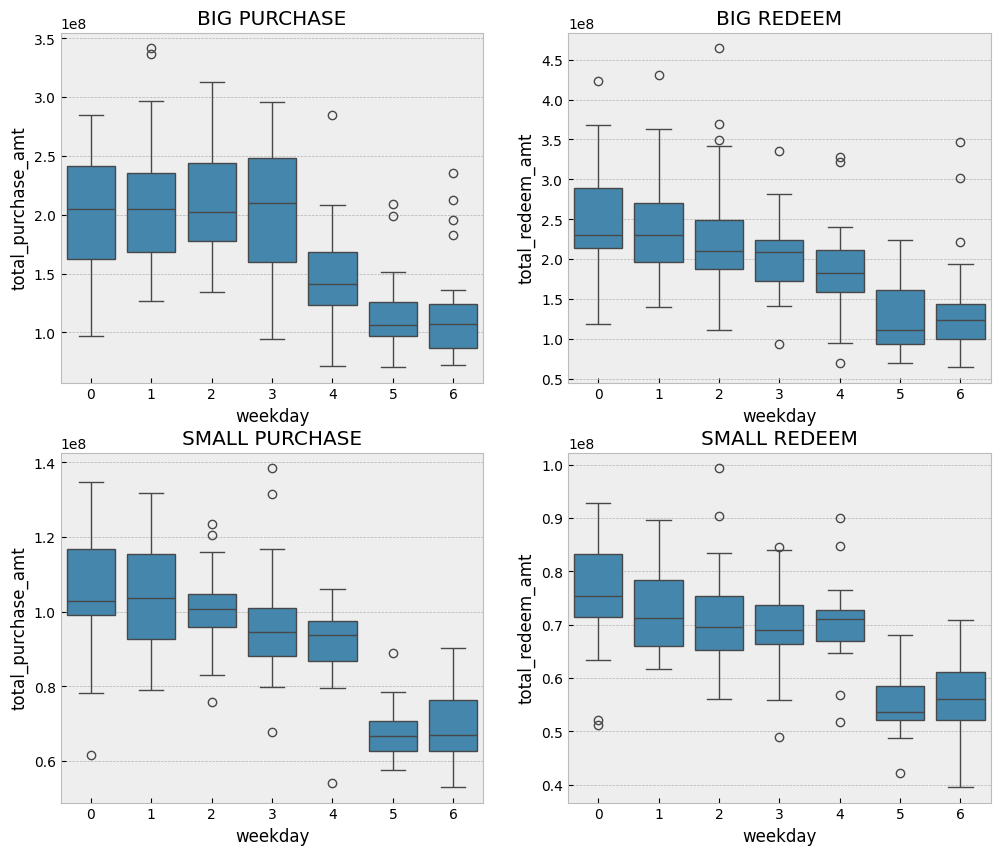

In [46]:
# 分析大额小额的翌日分布

plt.figure(figsize=(12, 10))

ax = plt.subplot(2,2,1)
ax = sns.boxplot(x="weekday", y="total_purchase_amt", data=big_purchase[big_purchase['date'] >= pd.to_datetime('2014/4/1')])
plt.title('BIG PURCHASE')

ax = plt.subplot(2,2,2)
ax = sns.boxplot(x="weekday", y="total_redeem_amt", data=big_redeem[big_redeem['date'] >= pd.to_datetime('2014/4/1')])
plt.title('BIG REDEEM')

ax = plt.subplot(2,2,3)
ax = sns.boxplot(x="weekday", y="total_purchase_amt", data=small_purchase[small_purchase['date'] >= pd.to_datetime('2014/4/1')])
plt.title('SMALL PURCHASE')

ax = plt.subplot(2,2,4)
ax = sns.boxplot(x="weekday", y="total_redeem_amt", data=small_redeem[small_redeem['date'] >= pd.to_datetime('2014/4/1')])
plt.title('SMALL REDEEM')

## 1.8)分析用户交易纪录表中其他变量

In [47]:
# 截断数据集

data_balance_1 = balance_data[balance_data['date'] > pd.to_datetime('2014/4/1')]

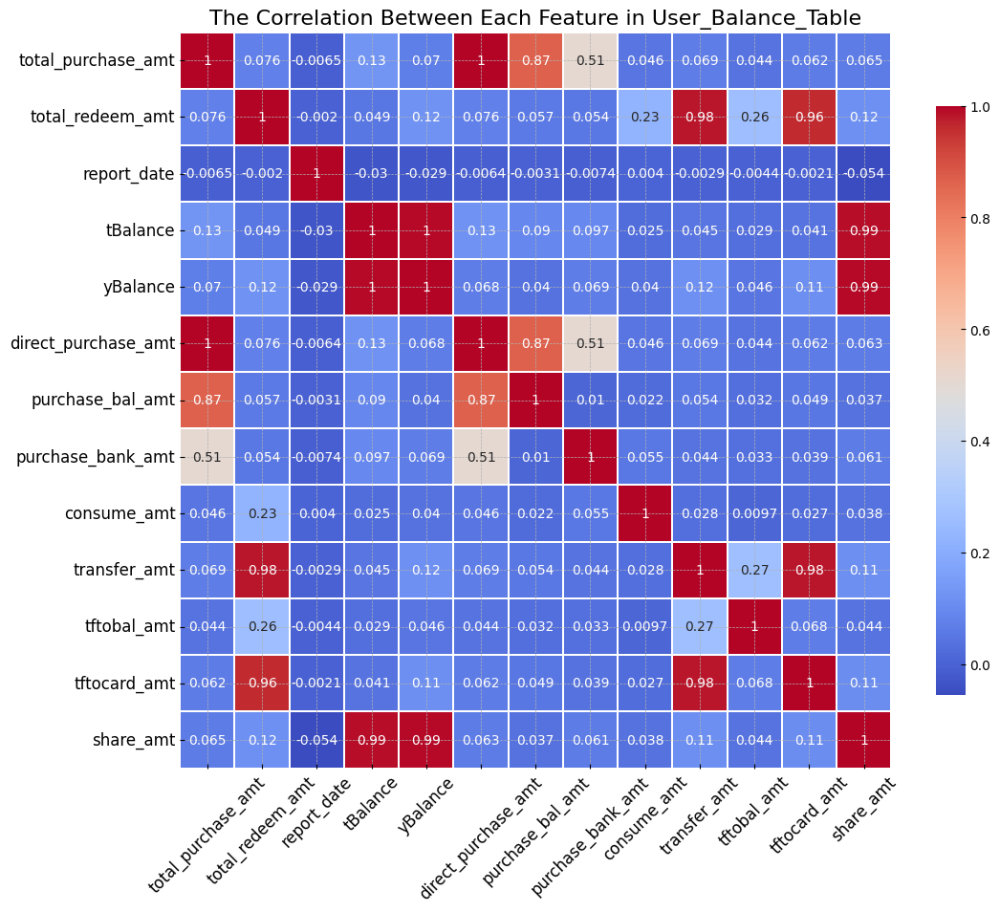

In [48]:
# 画出用户交易纪录表中其他变量与标签的相关性图

feature = ['total_purchase_amt','total_redeem_amt', 'report_date', 'tBalance', 'yBalance',
       'direct_purchase_amt', 'purchase_bal_amt', 'purchase_bank_amt',
        'consume_amt', 'transfer_amt', 'tftobal_amt',
       'tftocard_amt', 'share_amt']

# 计算特征的相关性矩阵
corr = data_balance_1[feature].corr()

# 设置绘图的大小
plt.figure(figsize=(12, 10))

# 使用更美观的调色板，设置注释字体大小
sns.heatmap(corr, linewidths=0.1, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})

# 设置标题和坐标轴标签的字体大小
plt.title("The Correlation Between Each Feature in User_Balance_Table", fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(rotation=0, fontsize=12)

plt.show()

## 1.9)对于银行利率的分析

In [49]:
# 读取银行利率并添加时间戳

bank = load_from_drive('1ZJh3YXHWa-pZjq3HElDsHpuzQh7qg9jZ', info = False)
bank = bank.rename(columns = {'mfd_date': 'date'})
bank_features = [x for x in bank.columns if x not in ['date']]
bank['date'] = pd.to_datetime(bank['date'], format= "%Y%m%d")
bank['day'] = bank['date'].dt.day
bank['month'] = bank['date'].dt.month
bank['year'] = bank['date'].dt.year
bank['week'] = bank['date'].dt.isocalendar().week
bank['weekday'] = bank['date'].dt.weekday

Downloading...
From: https://drive.google.com/uc?id=1ZJh3YXHWa-pZjq3HElDsHpuzQh7qg9jZ
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 19.5k/19.5k [00:00<00:00, 19.6MB/s]


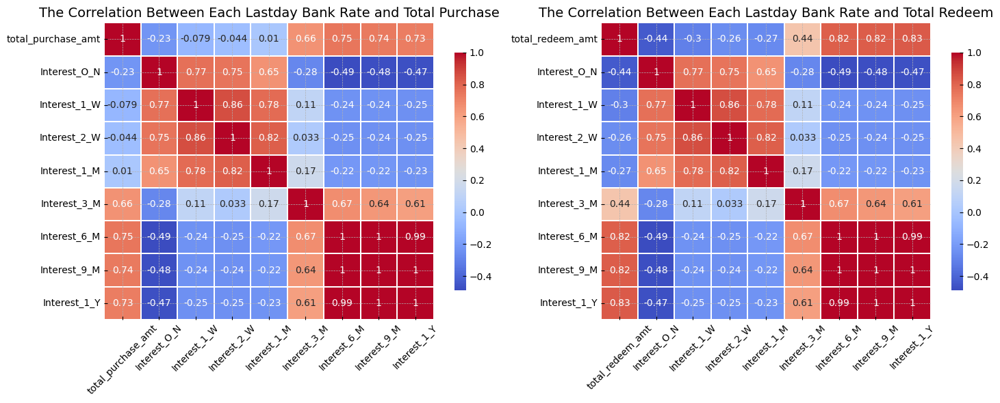

In [50]:
# 画出上一天银行及支付宝利率与标签的相关性图

bank['last_date'] = bank['date'] + datetime.timedelta(days=-1)

# 设置绘图的大小
plt.figure(figsize=(15, 6))

# 子图1：上一天银行利率和总购买金额的相关性
plt.subplot(1, 2, 1)
plt.title("The Correlation Between Each Lastday Bank Rate and Total Purchase", fontsize=14)
temp = pd.merge(bank[['last_date'] + bank_features], total_balance, left_on='last_date', right_on='date')[['total_purchase_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# 子图2：上一天银行利率和总赎回金额的相关性
plt.subplot(1, 2, 2)
plt.title("The Correlation Between Each Lastday Bank Rate and Total Redeem", fontsize=14)
temp = pd.merge(bank[['last_date'] + bank_features], total_balance, left_on='last_date', right_on='date')[['total_redeem_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.tight_layout()
plt.show()

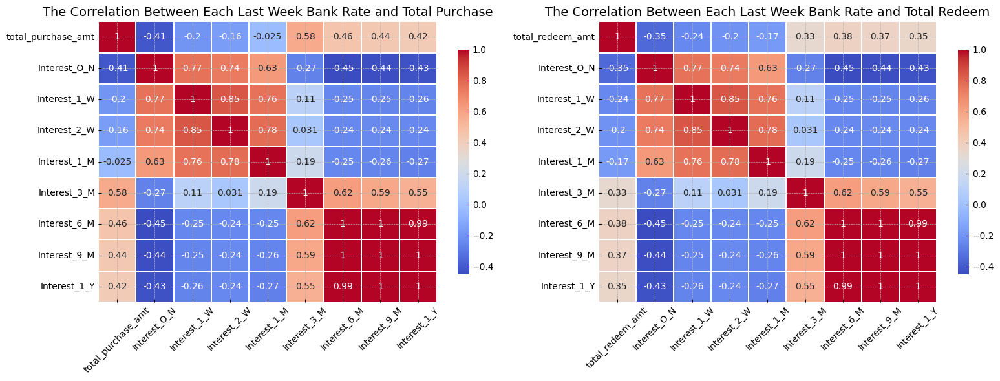

In [51]:
# 画出上一星期银行及支付宝利率与标签的相关性图

bank['last_week'] = bank['week'] - 1

# 设置绘图的大小
plt.figure(figsize=(16, 6))

# 子图1：上一周银行利率和总购买金额的相关性
plt.subplot(1, 2, 1)
plt.title("The Correlation Between Each Last Week Bank Rate and Total Purchase", fontsize=14)
temp = pd.merge(bank[['last_week', 'weekday'] + bank_features], total_balance, left_on=['last_week', 'weekday'], right_on=['week', 'weekday'])[['total_purchase_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# 子图2：上一周银行利率和总赎回金额的相关性
plt.subplot(1, 2, 2)
plt.title("The Correlation Between Each Last Week Bank Rate and Total Redeem", fontsize=14)
temp = pd.merge(bank[['last_week', 'weekday'] + bank_features], total_balance, left_on=['last_week', 'weekday'], right_on=['week', 'weekday'])[['total_redeem_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.tight_layout()
plt.show()

Text(0, 0.5, 'Rate')

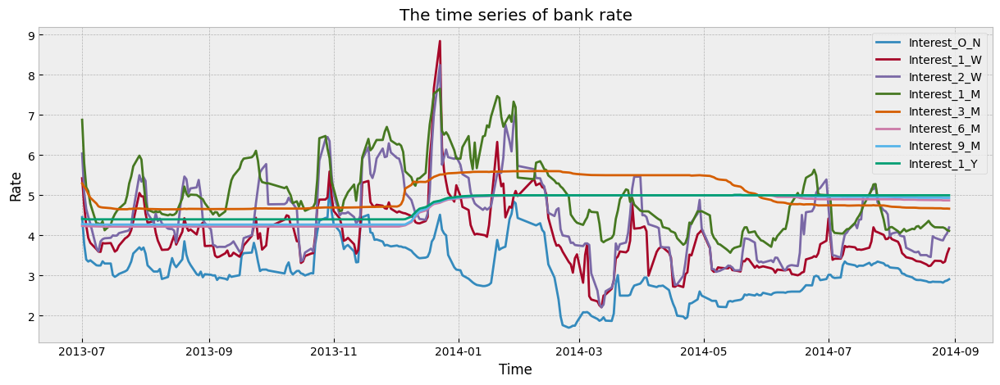

In [52]:
# 画出银行利率的时序图

plt.figure(figsize=(15,5))
for i in bank_features:
    plt.plot(bank['date'], bank[[i]] ,label=i)
plt.legend()
plt.title("The time series of bank rate")
plt.xlabel("Time")
plt.ylabel("Rate")

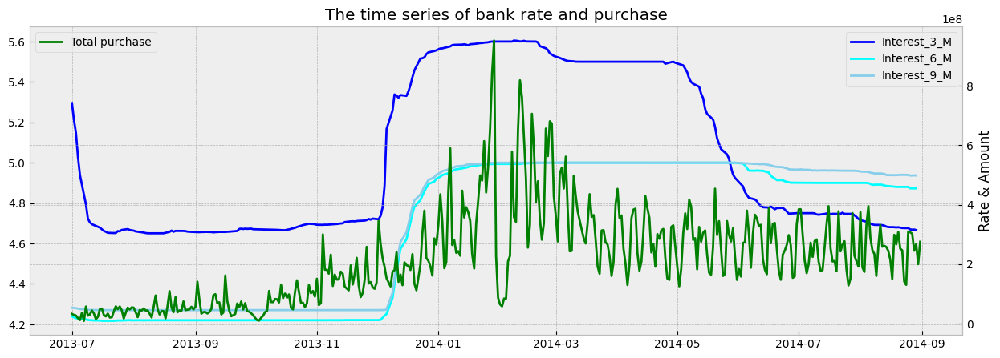

In [53]:
# 画出部分银行利率与购买量的时序图

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(bank['date'], bank['Interest_3_M'],'b',label="Interest_3_M")
plt.plot(bank['date'], bank['Interest_6_M'],'cyan',label="Interest_6_M")
plt.plot(bank['date'], bank['Interest_9_M'],'skyblue',label="Interest_9_M")

plt.legend()

ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_purchase_amt'],'g',label="Total purchase")

plt.legend(loc=2)
plt.title("The time series of bank rate and purchase")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")
plt.show()

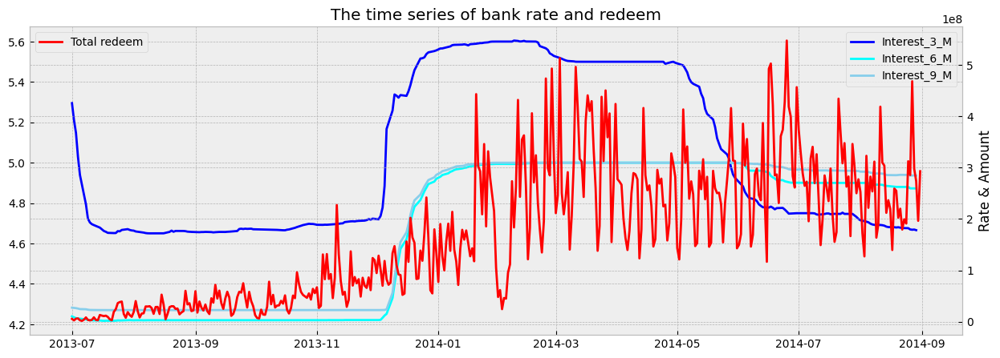

In [54]:
# 画出部分银行利率与赎回量的时序图

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(bank['date'], bank['Interest_3_M'],'b',label="Interest_3_M")
plt.plot(bank['date'], bank['Interest_6_M'],'cyan',label="Interest_6_M")
plt.plot(bank['date'], bank['Interest_9_M'],'skyblue',label="Interest_9_M")

plt.legend()

ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_redeem_amt'],'r',label="Total redeem")

plt.legend(loc=2)
plt.title("The time series of bank rate and redeem")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")

plt.show()

## 1.10)对于支付宝利率的分析

In [55]:
# 读取支付宝利率并添加时间戳

share = load_from_drive('1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI', info = False)
share = share.rename(columns = {'mfd_date': 'date'})
share_features = [x for x in share.columns if x not in ['date']]
share['date'] = pd.to_datetime(share['date'], format= "%Y%m%d")
share['day'] = share['date'].dt.day
share['month'] = share['date'].dt.month
share['year'] = share['date'].dt.year
share['week'] = share['date'].dt.isocalendar().week
share['weekday'] = share['date'].dt.weekday

Downloading...
From: https://drive.google.com/uc?id=1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 9.76k/9.76k [00:00<00:00, 4.89MB/s]


<Axes: >

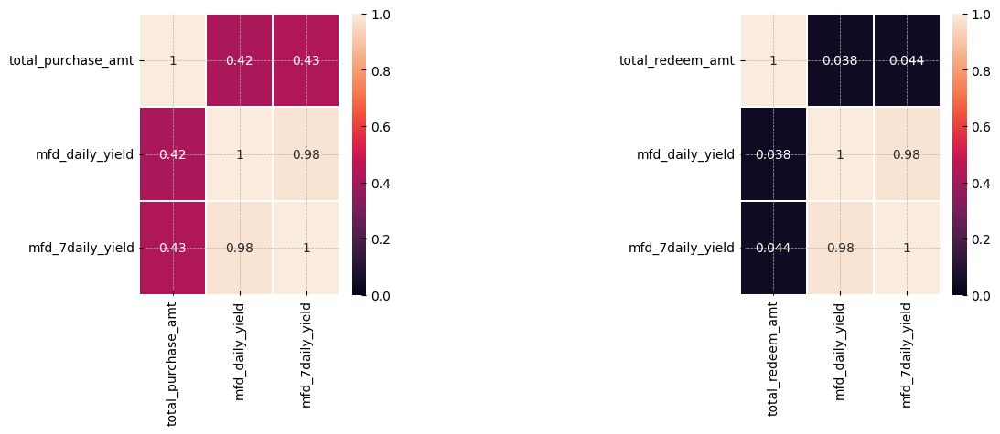

In [56]:

# 画出支付宝利率与标签的相关性图

share['last_date'] = share['date'] + datetime.timedelta(days=-1)
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
temp = pd.merge(share[['last_date']+share_features], total_balance, left_on='last_date', right_on='date')[['total_purchase_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)
plt.subplot(1,3,3)
temp = pd.merge(share[['last_date']+share_features], total_balance, left_on='last_date', right_on='date')[['total_redeem_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)

<Axes: >

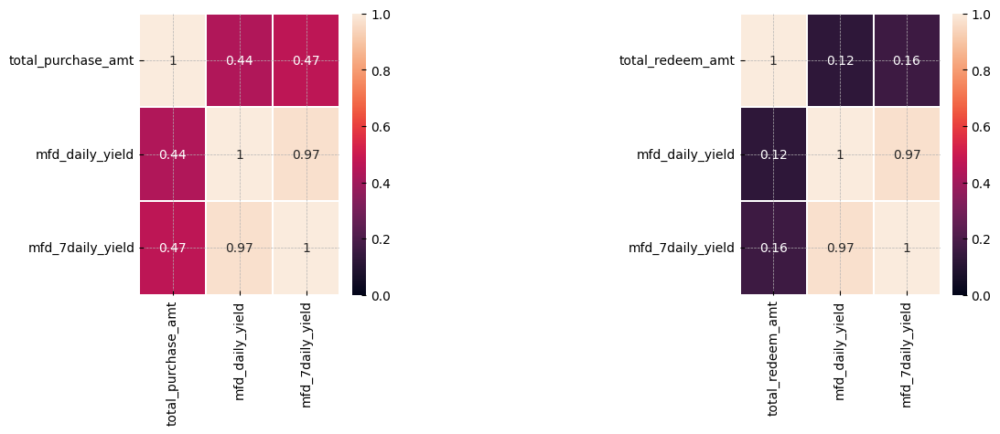

In [57]:
# 画出银行利率与标签的相关性图

share['last_week'] = share['week'] - 1
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
temp = pd.merge(share[['last_week','weekday']+share_features], total_balance, left_on=['last_week','weekday'], right_on=['week','weekday'])[['total_purchase_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)
plt.subplot(1,3,3)
temp = pd.merge(share[['last_week','weekday']+share_features], total_balance, left_on=['last_week','weekday'], right_on=['week','weekday'])[['total_redeem_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)

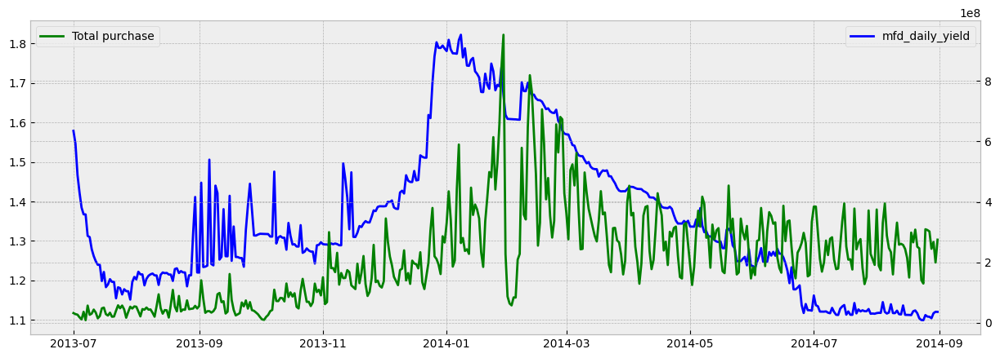

In [58]:
# 画出支付宝利率与购买量的时序图

fig,ax1 = plt.subplots(figsize=(15,5))
for i in share_features:
    plt.plot(share['date'], share[i],'b',label=i)
    break
plt.legend()
ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_purchase_amt'],'g',label="Total purchase")
plt.legend(loc=2)
plt.show()

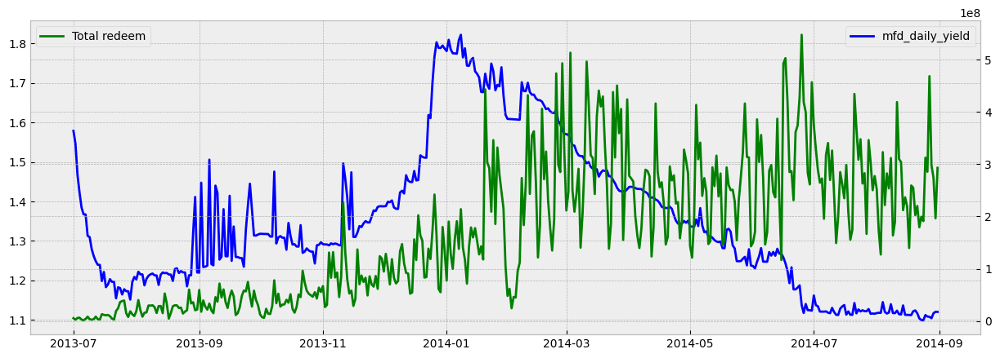

In [59]:
# 画出支付宝利率与赎回量的时序图

fig,ax1 = plt.subplots(figsize=(15,5))
for i in share_features:
    plt.plot(share['date'], share[i],'b',label=i)
    break
plt.legend()
ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_redeem_amt'],'g',label="Total redeem")
plt.legend(loc=2)
plt.show()

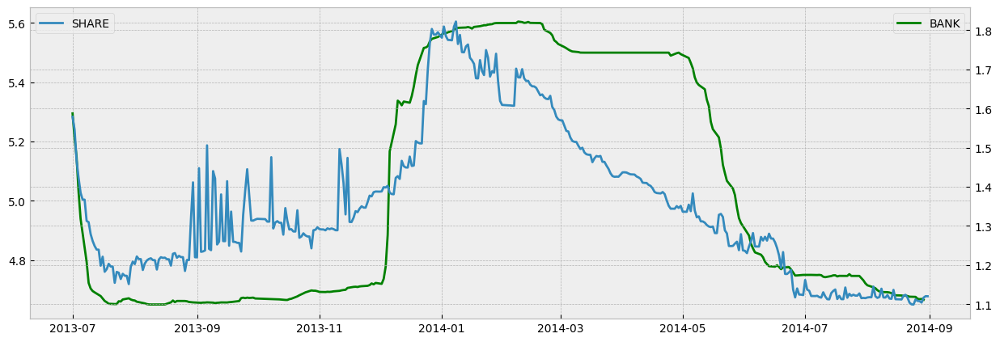

In [61]:
# 画出银行利率与支付宝利率的时序图

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(bank['date'], bank['Interest_3_M'],c='g',label= 'BANK')

plt.legend()
ax2=ax1.twinx()
plt.plot(share['date'], share['mfd_daily_yield'],label='SHARE')
plt.legend(loc=2)
plt.show()

<br> 由图可知
* 支付宝利率似乎对于购买金额的影响更大
* 银行利率似乎对于赎回金额的影响更大
* 支付宝利率的影响是暂时的
* 银行的利率的影响是长期的

<br> 基于以上分析，我们可以发现以下特点：
* 一周的哪一天
* 是否为周末
* 是否为假期
* 距离周一还有多长时间
* 距离周末还有多长时间
* 距离节日高峰还有多长时间
* 距离月初的时间
* 距离月末的时间
* 最后几个月的同比周平均值、最大值、最小值
* 每个月最后一天的交易额

# step2:特征分析

注，此处所有的金额单位都是分，例如用户某日买入100万，代表其购买了1万

## 2.1)分析大小额用户
前面的分析可以看出，某些用户的交易额很大，对于日交易量很明显，这里统计四月份后依旧活跃的大额用户(大于100万)

In [62]:
# 获得大额用户的集合

temp = balance_data[(balance_data['total_purchase_amt'] >= 1000000) | (balance_data['total_redeem_amt'] >= 1000000)]
big_users_set = set(temp[temp['date'] >= datetime.datetime(2014,4,1)]['user_id'])

In [63]:
len(big_users_set)

3903

In [64]:
balance_data['user_id'].nunique()

28041

大额用户占3903个，占总数的13%

In [65]:
# 标记大额用户

balance_data['big_user'] = 0
balance_data.loc[balance_data['user_id'].isin(big_users_set), 'big_user'] = 1

In [66]:
# 统计大额用户与小额用户的日总交易额的区别

total_balance_bigNsmall = balance_data.groupby(['date','big_user'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()

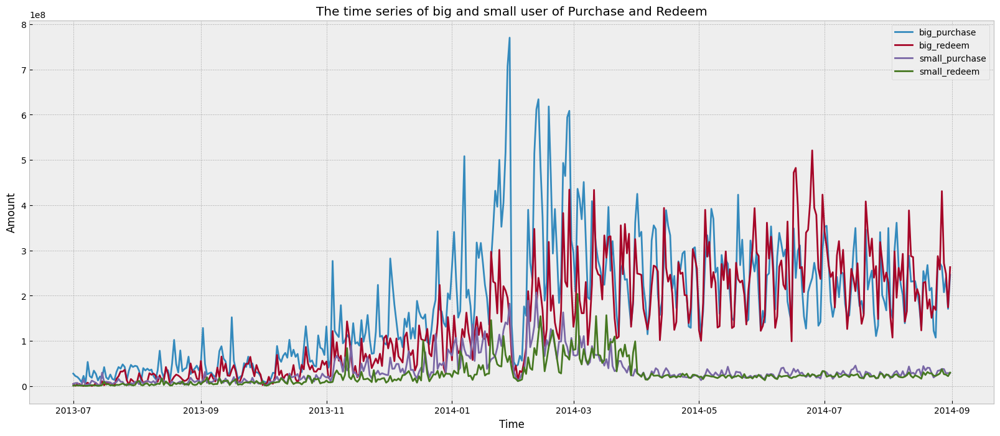

In [67]:
# 画出大额用户与小额用户交易的日总交易量图

fig = plt.figure(figsize=(20,8))
plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_purchase_amt'],label='big_purchase')
plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_redeem_amt'],label='big_redeem')

plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_purchase_amt'],label='small_purchase')
plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_redeem_amt'],label='small_redeem')
plt.legend(loc='best')
plt.title("The time series of big and small user of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

In [68]:
# 统计大额小额用户购买量占比

np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_purchase_amt']) / np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_purchase_amt'])

np.float64(5.1456178397775805)

In [69]:
# 统计大额小额用户赎回量占比

np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_redeem_amt']) / np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_redeem_amt'])

np.float64(5.422141272341089)

## 2.2)分析用户的交易频次

In [70]:
balance_data[balance_data['user_id']==1].sort_values('report_date').head(5)

,user_id,report_date,tBalance,yBalance,total_purchase_amt,direct_purchase_amt,purchase_bal_amt,purchase_bank_amt,total_redeem_amt,consume_amt,transfer_amt,tftobal_amt,tftocard_amt,share_amt,category1,category2,category3,category4,date,day,month,year,week,weekday,big_purchase,big_redeem,big_user
93,1,20140320,20111,0,20111,20111,0,20111,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2014-03-20,20,3,2014,12,3,0,0,0
59,1,20140321,20111,20111,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2014-03-21,21,3,2014,12,4,0,0,0
36,1,20140322,20113,20111,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-22,22,3,2014,12,5,0,0,0
94,1,20140323,20115,20113,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-23,23,3,2014,12,6,0,0,0
60,1,20140324,20117,20115,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-24,24,3,2014,13,0,0,0,0


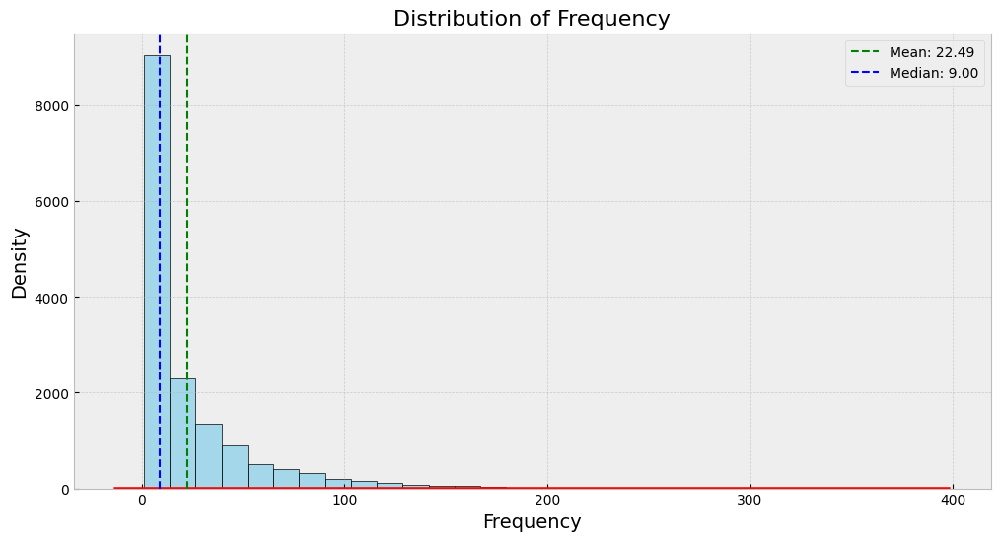

In [71]:
# 画出非0交易的分布图

# 计算频率
frequency = balance_data[(balance_data['direct_purchase_amt'] != 0) | (balance_data['total_redeem_amt'] != 0)][['user_id','tBalance']].groupby('user_id', as_index=False).count().rename({'tBalance':'freq'}, axis=1)

# 创建画布
plt.figure(figsize=(12, 6))

# 绘制直方图和核密度图
sns.histplot(frequency['freq'], kde=False, color='skyblue', bins=30, edgecolor='k', alpha=0.7)
sns.kdeplot(frequency['freq'], color='red', linewidth=2)

# 添加图形美化元素
plt.title('Distribution of Frequency', fontsize=16)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.axvline(frequency['freq'].mean(), color='green', linestyle='--', linewidth=1.5, label=f'Mean: {frequency["freq"].mean():.2f}')
plt.axvline(frequency['freq'].median(), color='blue', linestyle='--', linewidth=1.5, label=f'Median: {frequency["freq"].median():.2f}')
plt.legend()

# 显示图形
plt.show()

In [72]:
# 获取频繁交易用户集合

hot_users_set = set(frequency[frequency['freq'] > 30]['user_id'])

In [73]:

# 获取频繁用户的交易纪录

balance_data['is_hot_users'] = 0
balance_data.loc[balance_data['user_id'].isin(hot_users_set) , 'is_hot_users'] = 1

In [74]:
# 统计频繁用户与非频繁用户的日总交易额的区别

total_balance_hotNcold = balance_data.groupby(['date','is_hot_users'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()

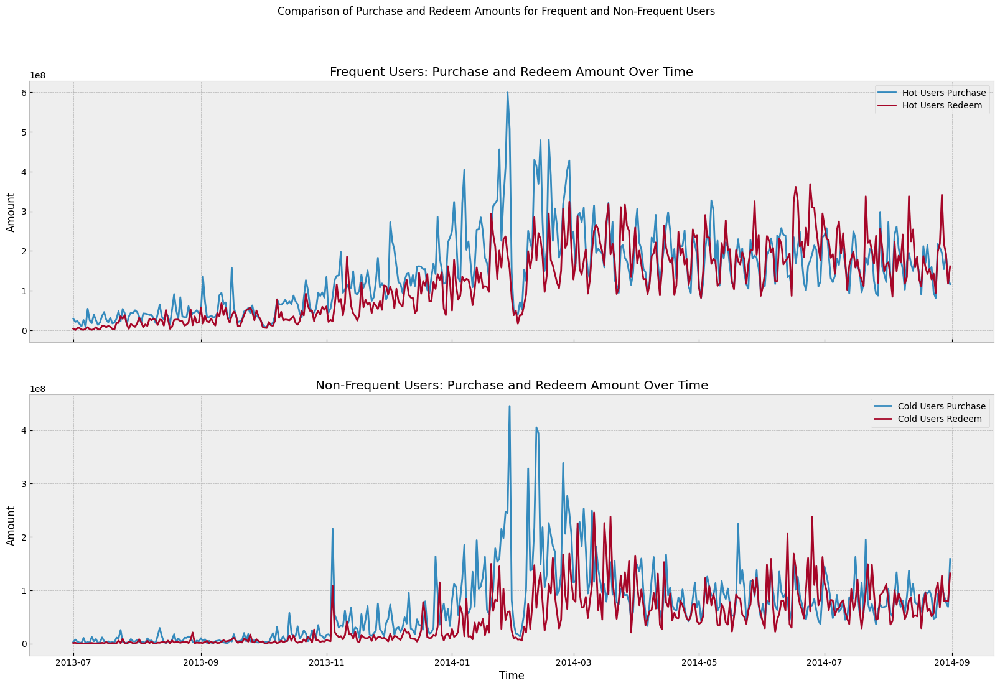

In [75]:
# 绘制频繁用户与非频繁用户总购买赎回量的时序图

# 创建子图
fig, axs = plt.subplots(2, 1, figsize=(20, 12), sharex=True)

# 绘制频繁用户的总购买量和赎回量
axs[0].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['total_purchase_amt'], label='Hot Users Purchase')
axs[0].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['total_redeem_amt'], label='Hot Users Redeem')
axs[0].legend(loc='best')
axs[0].set_title("Frequent Users: Purchase and Redeem Amount Over Time")
axs[0].set_ylabel("Amount")

# 绘制非频繁用户的总购买量和赎回量
axs[1].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['total_purchase_amt'], label='Cold Users Purchase')
axs[1].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['total_redeem_amt'], label='Cold Users Redeem')
axs[1].legend(loc='best')
axs[1].set_title("Non-Frequent Users: Purchase and Redeem Amount Over Time")
axs[1].set_xlabel("Time")
axs[1].set_ylabel("Amount")

plt.suptitle("Comparison of Purchase and Redeem Amounts for Frequent and Non-Frequent Users")
plt.show()

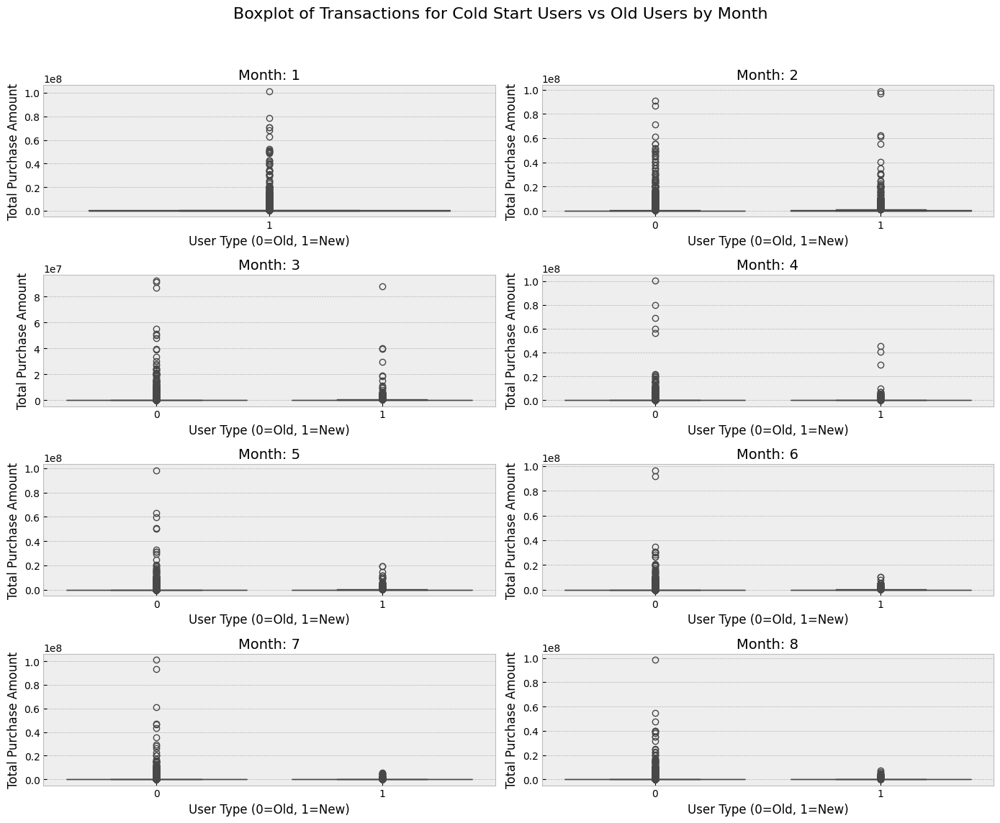

In [76]:
# 画出冷启动用户与老用户交易的箱型图
# 预处理数据
temp = balance_data[['year', 'month', 'user_id', 'total_purchase_amt', 'total_redeem_amt']].groupby(['year', 'month', 'user_id'], as_index=False).sum()
user_old_set = set()

# 创建绘图
plt.figure(figsize=(14, 12))

for i in range(1, 9):
    # 当前月份的数据
    newset = set(temp[(temp['year'] == 2014) & (temp['month'] == i)]['user_id'])
    this_month = balance_data[(balance_data['year'] == 2014) & (balance_data['month'] == i)]
    this_month['cold'] = 0
    this_month.loc[this_month['user_id'].isin(newset - user_old_set), 'cold'] = 1

    # 创建子图
    ax = plt.subplot(4, 2, i)
    sns.boxplot(x="cold", y="total_purchase_amt", data=this_month[(this_month['direct_purchase_amt'] != 0) | (this_month['total_redeem_amt'] != 0)], ax=ax)

    # 设置子图标题和标签
    ax.set_title(f'Month: {i}', fontsize=14)
    ax.set_xlabel('User Type (0=Old, 1=New)', fontsize=12)
    ax.set_ylabel('Total Purchase Amount', fontsize=12)

    # 更新老用户集合
    user_old_set = user_old_set | newset

# 主标题
plt.suptitle('Boxplot of Transactions for Cold Start Users vs Old Users by Month', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## 2.3)分析用户的其他属性

In [77]:

# 用户的其他属性
users = load_from_drive('1wPen9jGqP1nNVsdYeRNh3sHDoRXpSSaI', info = False)
users.head()

Downloading...
From: https://drive.google.com/uc?id=1wPen9jGqP1nNVsdYeRNh3sHDoRXpSSaI
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 746k/746k [00:00<00:00, 15.8MB/s]


,user_id,sex,city,constellation
0,2,1,6411949,狮子座
1,12,1,6412149,摩羯座
2,22,1,6411949,双子座
3,23,1,6411949,双鱼座
4,25,1,6481949,双鱼座


In [78]:

# 添加城市、星座、性别

balance_data = pd.merge(balance_data, users, on='user_id')

In [79]:
# balance_data = balance_data.drop('sex_x	city_x constellation_x sex_y city_y constellation_y'.split(), axis=1)

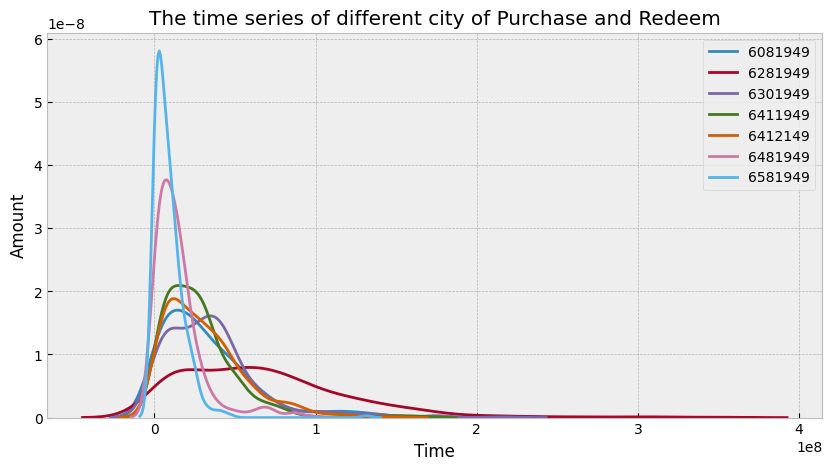

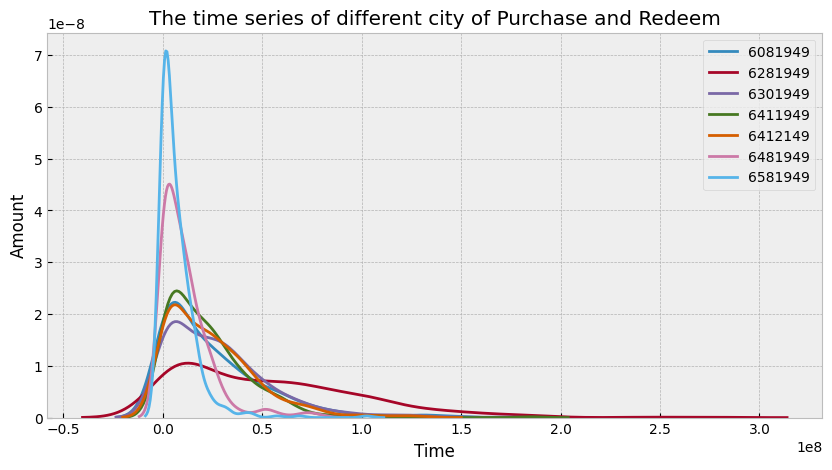

In [80]:
# 统计每个城市用户的日总交易额的区别并绘制分布估计图

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['city']):
    temp = balance_data.groupby(['date','city'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['city'] == i]['total_purchase_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of different city of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['city']):
    temp = balance_data.groupby(['date','city'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['city'] == i]['total_redeem_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of different city of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

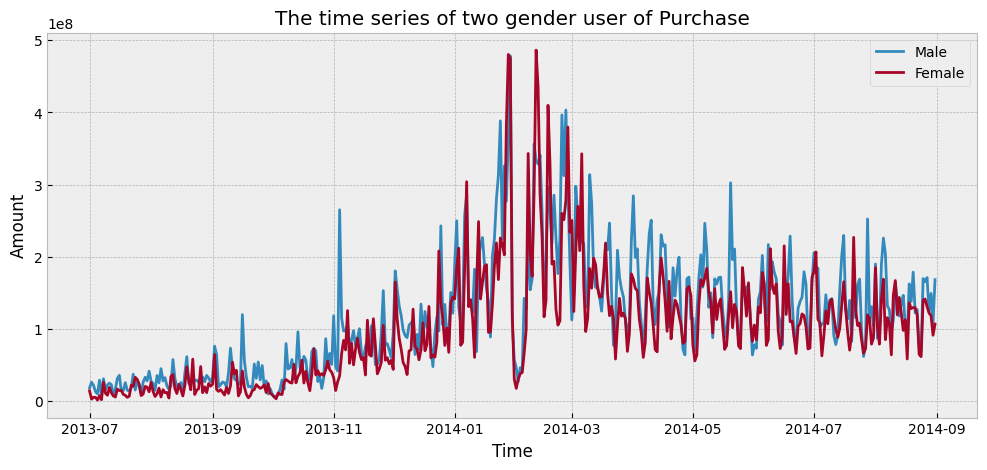

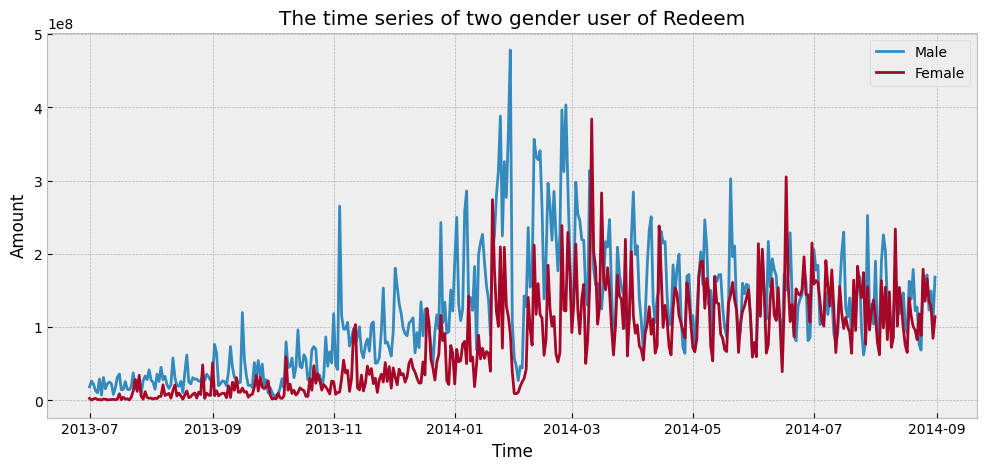

In [81]:
# 统计每个性别用户的日总交易额的区别，并绘制时序图

temp = balance_data.groupby(['date','sex'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()

fig = plt.figure(figsize=(12,5))
plt.plot(temp[temp['sex'] == 1]['date'], temp[temp['sex'] == 1]['total_purchase_amt'],label='Male')
plt.plot(temp[temp['sex'] == 0]['date'], temp[temp['sex'] == 0]['total_purchase_amt'],label='Female')
plt.legend(loc='best')
plt.title("The time series of two gender user of Purchase")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

fig = plt.figure(figsize=(12,5))
plt.plot(temp[temp['sex'] == 1]['date'], temp[temp['sex'] == 1]['total_purchase_amt'],label='Male')
plt.plot(temp[temp['sex'] == 0]['date'], temp[temp['sex'] == 0]['total_redeem_amt'],label='Female')
plt.legend(loc='best')
plt.title("The time series of two gender user of Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

In [84]:
# Change the Font to Chinese because there is Chinese Font in matplotlib

# !wget -O TaipeiSansTCBeta-Regular.ttf https://drive.google.com/uc?id=1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_&export=download

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.font_manager import fontManager

fontManager.addfont('TaipeiSansTCBeta-Regular.ttf')
mpl.rc('font', family='Taipei Sans TC Beta')

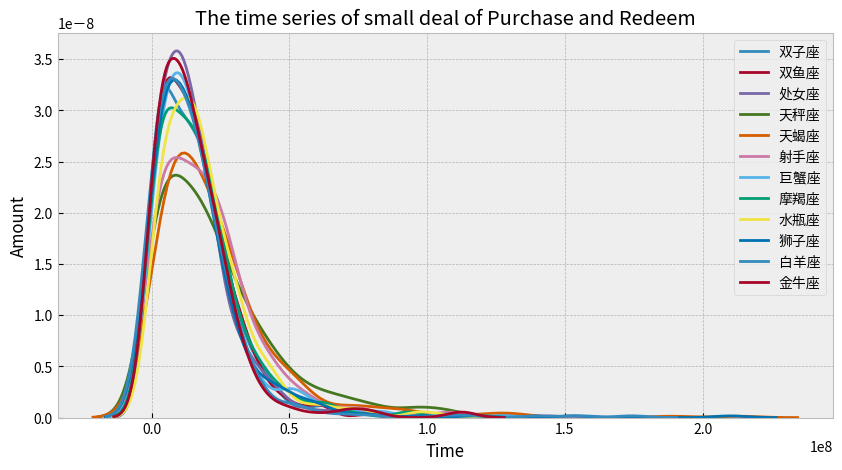

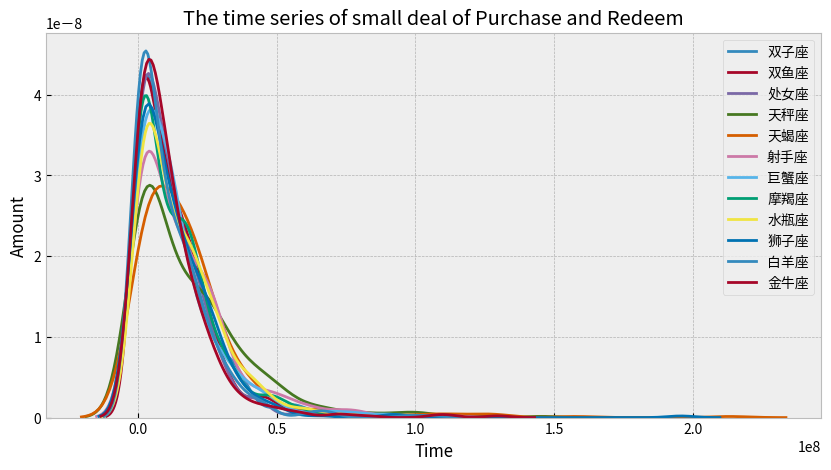

In [85]:

# 统计每个星座用户的日总交易额的区别 并绘制分布估计图

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['constellation']):
    temp = balance_data.groupby(['date','constellation'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['constellation'] == i]['total_purchase_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of small deal of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['constellation']):
    temp = balance_data.groupby(['date','constellation'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['constellation'] == i]['total_redeem_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of small deal of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

## 2.4)其他分析

In [86]:
temp = balance_data.groupby(['date'], as_index=False)[['direct_purchase_amt','share_amt']].sum()

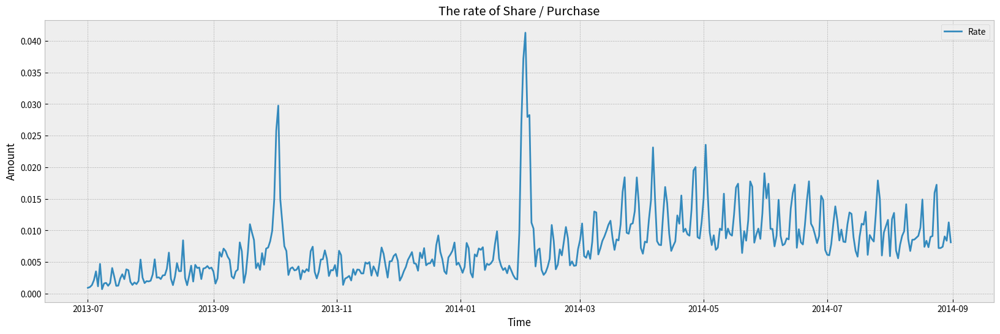

In [87]:
# 画出每日利息的增长/直接购买量的时序图

fig = plt.figure(figsize=(20,6))
plt.plot(temp['date'],  temp['share_amt'] / temp['direct_purchase_amt'] ,label='Rate')
plt.legend(loc='best')
plt.title("The rate of Share / Purchase")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

In [88]:
# 加载支付宝利率数据

share = load_from_drive('1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI', info = False)
share = share.rename(columns = {'mfd_date': 'date'})
share_features = [x for x in share.columns if x not in ['date']]
share['date'] = pd.to_datetime(share['date'], format= "%Y%m%d")
share['day'] = share['date'].dt.day
share['month'] = share['date'].dt.month
share['year'] = share['date'].dt.year
share['week'] = share['date'].dt.isocalendar().week
share['weekday'] = share['date'].dt.weekday

Downloading...
From: https://drive.google.com/uc?id=1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 9.76k/9.76k [00:00<?, ?B/s]


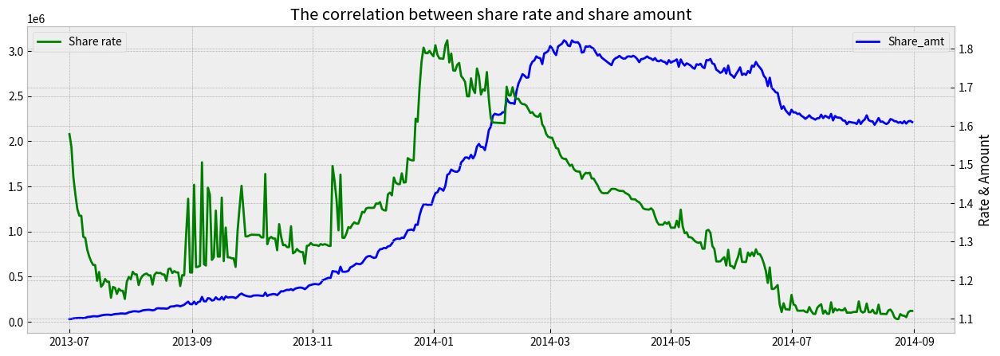

In [89]:
# 绘制支付宝利率与交易额的时序图

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(temp['date'], temp['share_amt'],'b',label="Share_amt")
plt.legend()

ax2=ax1.twinx()
plt.plot(share['date'], share['mfd_daily_yield'],'g',label="Share rate")

plt.legend(loc=2)
plt.title("The correlation between share rate and share amount")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")

plt.show()

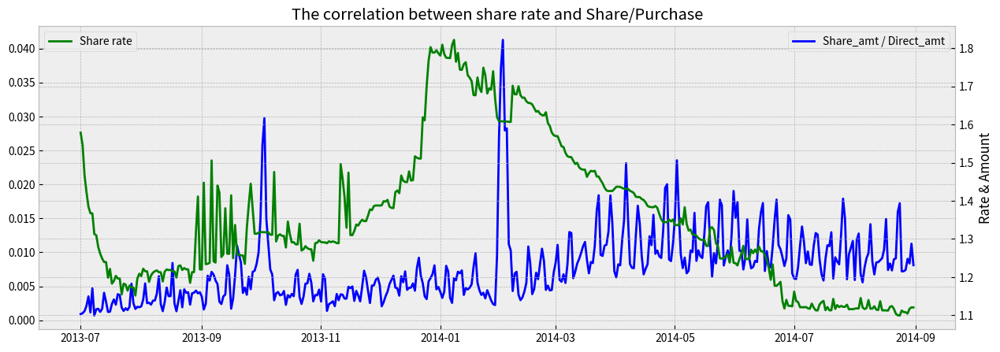

In [90]:
# 支付宝利率与每日利息的增长/直接购买量的时序图

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(temp['date'], temp['share_amt'] / temp['direct_purchase_amt'],'b',label="Share_amt / Direct_amt")
plt.legend()

ax2=ax1.twinx()
plt.plot(share['date'], share['mfd_daily_yield'],'g',label="Share rate")

plt.legend(loc=2)
plt.title("The correlation between share rate and Share/Purchase")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")

plt.show()

In [91]:
# 聚合两种不同购买方式

temp = balance_data.groupby(['date'], as_index=False)[['purchase_bal_amt','purchase_bank_amt']].sum()

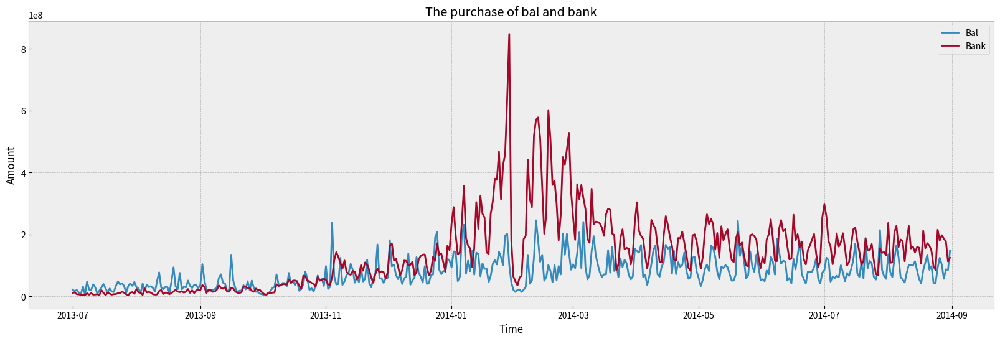

In [92]:

# 画出不同购买方式日购买量的时序图

fig = plt.figure(figsize=(20,6))
plt.plot(temp['date'], temp['purchase_bal_amt'],label='Bal')
plt.plot(temp['date'], temp['purchase_bank_amt'],label='Bank')
plt.legend(loc='best')
plt.title("The purchase of bal and bank")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

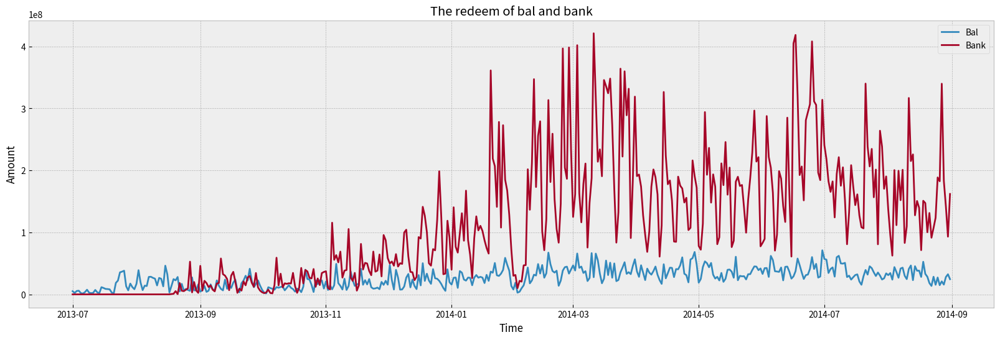

In [93]:

# 画出不同赎回方式日赎回量的时序图

temp = balance_data.groupby(['date'], as_index=False)[['tftobal_amt','tftocard_amt']].sum()
fig = plt.figure(figsize=(20,6))
plt.plot(temp['date'], temp['tftobal_amt'],label='Bal')
plt.plot(temp['date'], temp['tftocard_amt'],label='Bank')
plt.legend(loc='best')
plt.title("The redeem of bal and bank")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

虽然支付宝或者银行卡买入区别不大，但是redeem上的差异性相当明显。

# step3:时间序列规则

# 周期因子模型

&emsp;&emsp;鉴于余额宝的时间序列数据表现出强烈的周期性特征，故本项目采用周期因子模型。  
* 计算周期因子factors
* 计算base
* 预测=base*factors

## 关于周期因子模型

基本规则法快速入门
&emsp;&emsp;假设给定下面的数据，任务是预测第四周每天的客流量。  

| 周一 | 周二 | 周三 | 周四 | 周五 | 周六 | 周日 | 周均值 |
| :- | :- | :- | :- | :- | :- | :- | :- |
| 第一周 | 20 | 10 | 70 | 50 | 250 | 200 | 100 | 100 |
| 第二周 | 26 | 18 | 66 | 50 | 180 | 140 | 80 | 80 |
| 第三周 | 15 | 8 | 67	| 60 | 270 | 160 | 120 | 100 |

&emsp;&emsp;明显能看到周一到周日的周期波动。预测的核心任务就是尽可能准确的提取这种周期。  
&emsp;&emsp;第一步: 除以周均值，得到一个比例。
&emsp;&emsp;第二步: 按列取中位数。
&emsp;&emsp;就可以得到一组鲁棒的周期因子。

| 周一 | 周二 | 周三 | 周四	| 周五 | 周六 |	周日 |
| :- | :- | :- | :- | :- | :- | :- |
| 第一周 | 0.2	| 0.1 | 0.7	| 0.5 | 2.5	| 2	| 1 |
| 第二周 | 0.325 | 0.225 | 0.825 | 0.625 | 2.25 | 1.75	| 1 |
| 第三周 | 0.15 | 0.08	| 0.67 | 0.6 | 2.7 | 1.6 | 1.2 |
| 中位数 | 0.2	| 0.1 | 0.7	| 0.6 | 2.5 | 1.75 | 1 |

&emsp;&emsp;做预测时，只要将周期因子，乘以一个base，就可以做下一周的预测啦。比如说，我们取最后一周的平均客流量100作为base，那么我们直接乘上周期因子，就得到下一周的预测:

| 周一 | 周二 | 周三 | 周四	| 周五 | 周六 | 周日 |
| :- | :- | :- | :- | :- | :- | :- |
| 中位数 | 0.2	| 0.1 | 0.7	| 0.6 | 2.5	| 1.75 | 1 |
| 预测 (base=100) | 20 | 10 | 70 | 60	| 250 | 175	| 100 |

&emsp;&emsp;这里只拿了三周来举例。实际应用当然要取更长的时段啦。具体取几周以测试集的效果来确定。   
&emsp;&emsp;针对周期因子的优化  
&emsp;&emsp;按列提取中位数是一种简单而有效的提取周期因子的方法。中位数十分鲁棒，不受极端值的影响。但中位数损失了很多信息。实践中，可以在此基础上进一步优化。比如可以提取一个均值和一个中位数，然后将均值和中位数融合。融合的比例按照测试集的表现来确定。也可以根据与预测周的时间距离来赋予不同的权重。  
&emsp;&emsp;针对base的优化  
&emsp;&emsp;直接用最后一周的平均客流量作为base并不一定是最好的方法。也许最后三天或最后五天的均值能更好的反映最新的情况。但是，我们不能直接对最后三天客流量取均值（最后三天是周末，这样取的base就偏大了）。需要去掉周期性因素后，再取平均。具体做法，就是用客流量除以周期因子。  

| 周一 | 周二 | 周三 | 周四	| 周五 | 周六 | 周日 |
| :- | :- | :- | :- | :- | :- | :- |
| 第三周 | 15 | 8 | 67	| 60 | 270 | 160 | 120 |
| 中位数 | 0.2 | 0.1 | 0.7	| 0.6 | 2.5	| 1.75 | 1 |
| 去周期以后的客流量	| 75 | 80 | 95.7 | 100 | 108 | 91.4	| 120 |

&emsp;&emsp;这样我们就可以取最后三天的平均，(108+91.4+120)/3=106.5，作为base。具体取多少天的，也要通过测试集的表现来确定。当然也可以按某些函数形式来给每天赋予不同的权重。

# 参考资料

## 基本规则法快速入门

假设给定下面的数据，任务是预测第四周每天的客流量。

|        | 周一 | 周二 | 周三 | 周四 | 周五 | 周六 | 周日 | 周均值 |
| ------ | ---- | ---- | ---- | ---- | ---- | ---- | ---- | ------ |
| 第一周 | 20   | 10   | 70   | 50   | 250  | 200  | 100  | 100    |
| 第二周 | 26   | 18   | 66   | 50   | 180  | 140  | 80   | 80     |
| 第三周 | 15   | 8    | 67   | 60   | 270  | 160  | 120  | 100    |

明显能看到周一到周日的周期波动。预测的核心任务就是尽可能准确的提取这种周期。
 **第一步**: 除以周均值，得到一个比例。
 **第二步**: 按列取中位数。
 就可以得到一组鲁棒的周期因子。

|        | 周一  | 周二  | 周三  | 周四  | 周五 | 周六 | 周日 |
| ------ | ----- | ----- | ----- | ----- | ---- | ---- | ---- |
| 第一周 | 0.2   | 0.1   | 0.7   | 0.5   | 2.5  | 2    | 1    |
| 第二周 | 0.325 | 0.225 | 0.825 | 0.625 | 2.25 | 1.75 | 1    |
| 第三周 | 0.15  | 0.08  | 0.67  | 0.6   | 2.7  | 1.6  | 1.2  |
| 中位数 | 0.2   | 0.1   | 0.7   | 0.6   | 2.5  | 1.75 | 1    |

做预测时，只要将周期因子，乘以一个base，就可以做下一周的预测啦。比如说，我们取最后一周的平均客流量100作为base，那么我们直接乘上周期因子，就得到下一周的预测:

|                 | 周一 | 周二 | 周三 | 周四 | 周五 | 周六 | 周日 |
| --------------- | ---- | ---- | ---- | ---- | ---- | ---- | ---- |
| 中位数          | 0.2  | 0.1  | 0.7  | 0.6  | 2.5  | 1.75 | 1    |
| 预测 (base=100) | 20   | 10   | 70   | 60   | 250  | 175  | 100  |

这里只拿了三周来举例。实际应用当然要取更长的时段啦。具体取几周以测试集的效果来确定。

### 针对周期因子的优化

按列提取中位数是一种简单而有效的提取周期因子的方法。中位数十分鲁棒，不受极端值的影响。但中位数损失了很多信息。实践中，可以在此基础上进一步优化。比如可以提取一个均值和一个中位数，然后将均值和中位数融合。融合的比例按照测试集的表现来确定。也可以根据与预测周的时间距离来赋予不同的权重。

### 针对base的优化

直接用最后一周的平均客流量作为base并不一定是最好的方法。也许最后三天或最后五天的均值能更好的反映最新的情况。但是，我们不能直接对最后三天客流量取均值（最后三天是周末，这样取的base就偏大了）。需要去掉周期性因素后，再取平均。具体做法，就是用客流量除以周期因子。

|                    | 周一 | 周二 | 周三 | 周四 | 周五 | 周六 | 周日 |
| ------------------ | ---- | ---- | ---- | ---- | ---- | ---- | ---- |
| 第三周             | 15   | 8    | 67   | 60   | 270  | 160  | 120  |
| 中位数             | 0.2  | 0.1  | 0.7  | 0.6  | 2.5  | 1.75 | 1    |
| 去周期以后的客流量 | 75   | 80   | 95.7 | 100  | 108  | 91.4 | 120  |

这样我们就可以取最后三天的平均，(108+91.4+120)/3=106.5，作为base。具体取多少天的，也要通过测试集的表现来确定。当然也可以按某些函数形式来给每天赋予不同的权重。

In [94]:

# 载入数据

balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date = '2014-03-01')
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')

Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=4d5490ae-8c88-4edd-bfe9-88febe5aa4b2
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 158M/158M [00:05<00:00, 29.9MB/s] 


In [95]:

# 创建数据的深层拷贝

data = total_balance.copy()
data

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
0,2014-03-01,362865580.0000,211279011.0000,1,3,2014,9,5
1,2014-03-02,276202230.0000,246199417.0000,2,3,2014,9,6
2,2014-03-03,505305862.0000,513017360.0000,3,3,2014,10,0
3,2014-03-04,524146340.0000,250562978.0000,4,3,2014,10,1
4,2014-03-05,454295491.0000,209072753.0000,5,3,2014,10,2
...,...,...,...,...,...,...,...,...
209,2014-09-26,NaN,NaN,26,9,2014,39,4
210,2014-09-27,NaN,NaN,27,9,2014,39,5
211,2014-09-28,NaN,NaN,28,9,2014,39,6
212,2014-09-29,NaN,NaN,29,9,2014,40,0


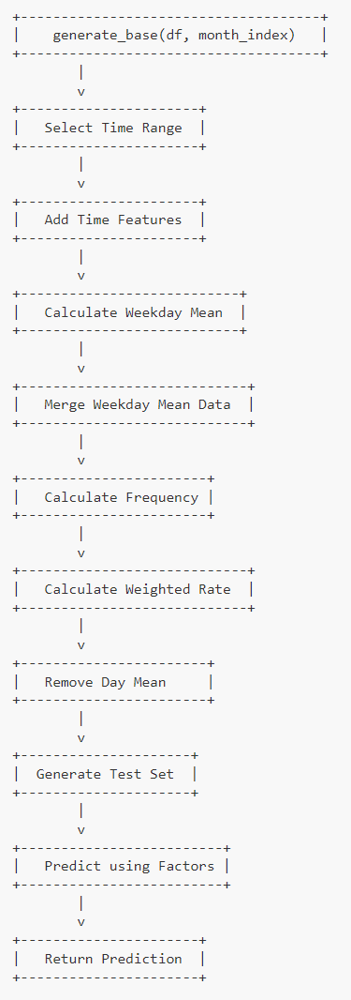


"翌日因子"（Next-Day Factor）指的是在时间序列预测中，根据历史数据中的某些特征，预测未来的某个时间点的数值变化。在这个上下文中，翌日因子是指根据历史数据中的某些特征（比如星期几、日期等），预测下一个时间点（即翌日）的数值变化。


**链路和过程**：

1. **数据筛选和处理**：

   - 筛选出从"2014-03-01"开始，到特定的"month_index"之前的数据。这里"month_index"表示一个指定的月份索引，用于选取特定时间段的数据。

   **结果**： 数据框中只保留了从"2014-03-01"开始到特定月份之前的数据。

2. **加入时间戳**：

   - 添加了各种时间特征，包括星期几、日期、周数和月份。

   **结果**： 数据框中增加了"weekday"（星期几）、"day"（日期）、"week"（周数）和"month"（月份）列。

3. **统计翌日因子**：

   - 计算每个星期几的平均购买金额和赎回金额，并将这些均值除以总购买和赎回金额的均值，以得到翌日因子。

   **结果**： `mean_of_each_weekday`数据框包含了每个星期几的购买和赎回金额的平均值以及计算得到的购买和赎回翌日因子。

4. **合并统计结果到原数据集**：

   - 将翌日因子合并到原始数据集，以便后续计算。

   **结果**： 原始数据框中增加了购买和赎回翌日因子列。

5. **分别统计翌日在(1~31)号出现的频次**：

   - 统计每个日期在星期几出现的频次，以及对应的翌日因子。

   **结果**： `weekday_count`数据框包含了每个日期在星期几出现的频次，以及根据星期几的频次计算得到的购买和赎回翌日因子。

6. **依据频次对翌日因子进行加权，获得日期因子**：

   - 将购买和赎回翌日因子根据每个日期的频次进行加权，得到日期因子。

   **结果**： `day_rate`数据框包含了每个日期的购买和赎回日期因子。

7. **将训练集中所有日期的均值剔除日期残差得到base**：

   - 计算每个日期的购买和赎回均值，然后将加权的日期因子与均值合并，得到调整后的基准值。

   **结果**： `day_pre`数据框包含了每个日期的购买和赎回基准值。

8. **生成测试集数据**：

   - 根据月份、日期和基准值生成测试集数据。

   **结果**： 生成的测试集数据包含了日期、购买和赎回基准值。

9. **基于base与翌日因子获得最后的预测结果**：

   - 将测试集数据与翌日因子合并，再次计算购买和赎回金额，最终得到预测结果。

   **结果**： `day_pre`数据框被重新计算，其中的购买和赎回金额根据购买和赎回翌日因子进行了调整，得到最终的预测结果。

In [96]:


# 定义生成时间序列规则预测结果的方法
def generate_base(df: pd.DataFrame, month_index: int) -> pd.DataFrame:
    # 选中固定时间段的数据集
    total_balance = df.copy()  # 复制传入的数据DataFrame以免修改原始数据
    total_balance = total_balance[['date', 'total_purchase_amt', 'total_redeem_amt']]  # 选择特定列的数据
    total_balance = total_balance[(total_balance['date'] >= pd.to_datetime('2014/3/1')) & (total_balance['date'] < pd.to_datetime('2014/{}/1'.format(month_index)))]  # 筛选特定时间段的数据

    # 加入时间戳
    total_balance['weekday'] = total_balance['date'].dt.weekday  # 添加星期几信息
    total_balance['day'] = total_balance['date'].dt.day          # 添加日期信息
    total_balance['week'] = total_balance['date'].dt.isocalendar().week      # 添加周数信息
    total_balance['month'] = total_balance['date'].dt.month      # 添加月份信息

    # 统计翌日因子
    mean_of_each_weekday = total_balance[['weekday'] + ['total_purchase_amt', 'total_redeem_amt']].groupby('weekday', as_index=False).mean()  # 统计每个星期几的购买和赎回平均金额
    for name in ['total_purchase_amt', 'total_redeem_amt']:
        mean_of_each_weekday = mean_of_each_weekday.rename(columns={name: name+'_weekdaymean'})  # 为统计结果添加后缀以区分翌日因子
    mean_of_each_weekday['total_purchase_amt_weekdaymean'] /= np.mean(total_balance['total_purchase_amt'])  # 计算购买金额的翌日因子
    mean_of_each_weekday['total_redeem_amt_weekdaymean'] /= np.mean(total_balance['total_redeem_amt'])    # 计算赎回金额的翌日因子

    # 合并统计结果到原数据集
    total_balance = pd.merge(total_balance, mean_of_each_weekday, on='weekday', how='left')  # 将翌日因子合并到原始数据集
    # print(total_balance)


    # 分别统计翌日在(1~31)号出现的频次
    weekday_count = total_balance[['day', 'weekday', 'date']].groupby(['day', 'weekday'], as_index=False).count()  # 统计每个日期在星期几出现的次数
    weekday_count = pd.merge(weekday_count, mean_of_each_weekday, on='weekday')  # 合并统计结果和翌日因子

    # 依据频次对翌日因子进行加权，获得日期因子
    weekday_count['total_purchase_amt_weekdaymean'] *= weekday_count['date'] / len(np.unique(total_balance['month']))  # 根据频次加权计算购买金额的日期因子
    weekday_count['total_redeem_amt_weekdaymean'] *= weekday_count['date'] / len(np.unique(total_balance['month']))    # 根据频次加权计算赎回金额的日期因子
    day_rate = weekday_count.drop(['weekday', 'date'], axis=1).groupby('day', as_index=False).sum()  # 计算每个日期的加权因子之和

    # 将训练集中所有日期的均值剔除日期残差得到base
    day_mean = total_balance[['day'] + ['total_purchase_amt', 'total_redeem_amt']].groupby('day', as_index=False).mean()  # 计算每个日期的购买和赎回均值
    day_pre = pd.merge(day_mean, day_rate, on='day', how='left')  # 将加权因子合并到每个日期的均值上
    day_pre['total_purchase_amt'] /= day_pre['total_purchase_amt_weekdaymean']  # 将购买金额除以购买翌日因子
    day_pre['total_redeem_amt'] /= day_pre['total_redeem_amt_weekdaymean']        # 将赎回金额除以赎回翌日因子

    # 生成测试集数据
    for index, row in day_pre.iterrows():
        if month_index in (2, 4, 6, 9) and row['day'] == 31:
            break
        day_pre.loc[index, 'date'] = datetime.datetime(2014, month_index, int(row['day']), 0, 0, 0)  # 根据月份和日期生成测试集的日期

    # 基于base与翌日因子获得最后的预测结果
    day_pre['weekday'] = day_pre['date'].dt.weekday  # 添加星期几信息
    day_pre = day_pre[['date', 'weekday'] + ['total_purchase_amt', 'total_redeem_amt']]  # 选择需要的列
    day_pre = pd.merge(day_pre, mean_of_each_weekday, on='weekday')  # 合并翌日因子
    day_pre['total_purchase_amt'] *= day_pre['total_purchase_amt_weekdaymean']  # 根据购买翌日因子调整购买金额
    day_pre['total_redeem_amt'] *= day_pre['total_redeem_amt_weekdaymean']        # 根据赎回翌日因子调整赎回金额

    day_pre = day_pre.sort_values('date')[['date'] + ['total_purchase_amt', 'total_redeem_amt']]  # 按日期排序并选择需要的列
    return day_pre  # 返回生成的时间序列预测结果DataFrame

In [97]:
# 生成预测结果（以及残差）

base_list = []
for i in range(4, 10):
    base_list.append(generate_base(data, i).reset_index(drop=True))

base = pd.concat(base_list).reset_index(drop=True)

In [98]:
for i in ['total_purchase_amt','total_redeem_amt']:
    base = base.rename(columns={i: i+'_base'})

In [99]:
base_res = pd.merge(data.reset_index(drop=True), base.reset_index(drop=True), on='date', how='left').reset_index(drop=True)
base_res

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday,total_purchase_amt_base,total_redeem_amt_base
0,2014-03-01,362865580.0000,211279011.0000,1,3,2014,9,5,NaN,NaN
1,2014-03-02,276202230.0000,246199417.0000,2,3,2014,9,6,NaN,NaN
2,2014-03-03,505305862.0000,513017360.0000,3,3,2014,10,0,NaN,NaN
3,2014-03-04,524146340.0000,250562978.0000,4,3,2014,10,1,NaN,NaN
4,2014-03-05,454295491.0000,209072753.0000,5,3,2014,10,2,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
209,2014-09-26,NaN,NaN,26,9,2014,39,4,221701520.1815,306329996.0163
210,2014-09-27,NaN,NaN,27,9,2014,39,5,173675867.5541,218142847.5830
211,2014-09-28,NaN,NaN,28,9,2014,39,6,180985508.4888,249228870.4353
212,2014-09-29,NaN,NaN,29,9,2014,40,0,295381730.1155,351559762.6468


In [100]:
base_res['purchase_residual'] = base_res['total_purchase_amt'] / base_res['total_purchase_amt_base']
base_res['redeem_residual'] = base_res['total_redeem_amt'] / base_res['total_redeem_amt_base']

In [101]:
base_res

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday,total_purchase_amt_base,total_redeem_amt_base,purchase_residual,redeem_residual
0,2014-03-01,362865580.0000,211279011.0000,1,3,2014,9,5,NaN,NaN,NaN,NaN
1,2014-03-02,276202230.0000,246199417.0000,2,3,2014,9,6,NaN,NaN,NaN,NaN
2,2014-03-03,505305862.0000,513017360.0000,3,3,2014,10,0,NaN,NaN,NaN,NaN
3,2014-03-04,524146340.0000,250562978.0000,4,3,2014,10,1,NaN,NaN,NaN,NaN
4,2014-03-05,454295491.0000,209072753.0000,5,3,2014,10,2,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
209,2014-09-26,NaN,NaN,26,9,2014,39,4,221701520.1815,306329996.0163,NaN,NaN
210,2014-09-27,NaN,NaN,27,9,2014,39,5,173675867.5541,218142847.5830,NaN,NaN
211,2014-09-28,NaN,NaN,28,9,2014,39,6,180985508.4888,249228870.4353,NaN,NaN
212,2014-09-29,NaN,NaN,29,9,2014,40,0,295381730.1155,351559762.6468,NaN,NaN


In [102]:
# 对结果表重命名

base_res = base_res[['date','total_purchase_amt','total_redeem_amt','purchase_residual','redeem_residual','total_purchase_amt_base', 'total_redeem_amt_base']]
for i in base_res.columns:
    if i == 'date':
        base_res[i] = base_res[i].astype(str)
        base_res[i] = base_res[i].str.replace('-','')

In [103]:
from collections.abc import Iterable

# 分割数据集
def split_data_underline(data):
    data['date'] = pd.to_datetime(data['date'])
    trainset = data[(datetime.datetime(2014, 4, 1) <= data['date']) & (data['date'] < datetime.datetime(2014, 8, 1))]
    testset = data[(datetime.datetime(2014, 8, 1) <= data['date']) & (data['date'] < datetime.datetime(2014, 9, 1))]
    return trainset, testset

trainset, testset = split_data_underline(base_res)

# 定义评估函数
def AE(y: Iterable, yhat: Iterable) -> Iterable:
    return np.abs(y - yhat) / np.abs(y)

def total_AE(purchasehat: Iterable, redeemhat: Iterable, purchase: Iterable, redeem: Iterable, h: float = 0.3) -> float:
    purchase_score = sum(np.exp(-AE(purchase, purchasehat) / h) * 10)
    redeem_score = sum(np.exp(-AE(redeem, redeemhat) / h) * 10)
    return purchase_score * 0.45 + redeem_score * 0.55

# 计算测试集上的得分
score = total_AE(
    testset['total_purchase_amt'],
    testset['total_redeem_amt'],
    testset['total_purchase_amt_base'],
    testset['total_redeem_amt_base']
)

print("Score on the test set:", score)


Score on the test set: 186.60893633571055


# step4:特征工程

In [104]:
# 为方面后面操作，设置全局index变量

labels = ['total_purchase_amt','total_redeem_amt']
date_indexs = ['week','year','month','weekday','day']

In [105]:
# 读取数据集

balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date = '2014-03-01')
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')

Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=f971c35e-23c2-4a11-9730-6187c8645d70
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 158M/158M [00:04<00:00, 35.1MB/s] 


# 特征提取

当下时间序列预测的方法主要有三种

- 第一个是传统的时间序列预测方法，典型代表有ARIMA和指数平滑法
- 第二个是基于机器学习的方法，目前用的最多的是lightgbm和xgboost
- 第三个是基于深度学习的方法，如RNN、LSTM等

现在传统时序预测的方法的预测精度都已经不如基于机器学习和深度学习的方法了，但是后者依赖于特征工程，特征调教的好的话是可以达到很高的预测精度的

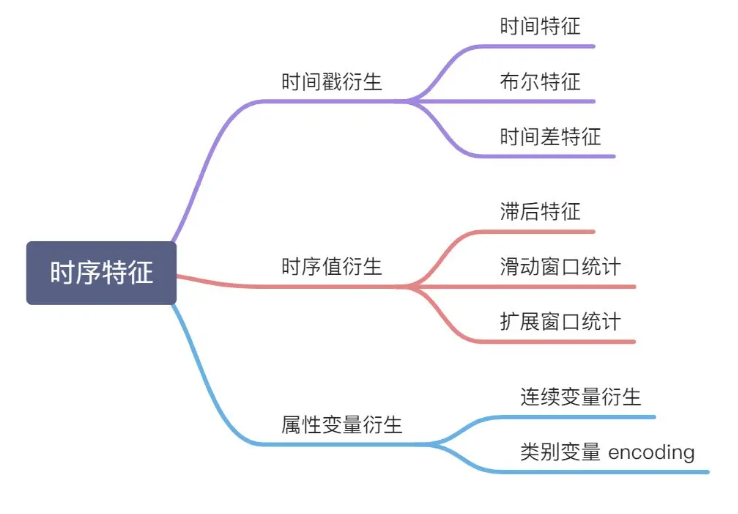



## 一、基于日期的静态特征

### 1.1 提取 is 特征

布尔特征

是否年初/年末
是否月初/月末
是否周末
是否节假日
是否特殊日期
是否早上/中午/晚上
...

In [106]:
# 获取节假日集合

def get_holiday_set()->Set[datetime.date]:
    holiday_set = set()
    # 清明节
    holiday_set = holiday_set | {datetime.date(2014,4,5), datetime.date(2014,4,6), datetime.date(2014,4,7)}
    # 劳动节
    holiday_set = holiday_set | {datetime.date(2014,5,1), datetime.date(2014,5,2), datetime.date(2014,5,3)}
    # 端午节
    holiday_set = holiday_set | {datetime.date(2014,5,31), datetime.date(2014,6,1), datetime.date(2014,6,2)}
    # 中秋节
    holiday_set = holiday_set | {datetime.date(2014,9,6), datetime.date(2014,9,7), datetime.date(2014,9,8)}
    # 国庆节
    holiday_set = holiday_set | {datetime.date(2014,10,1), datetime.date(2014,10,2), datetime.date(2014,10,3),\
                                 datetime.date(2014,10,4), datetime.date(2014,10,5), datetime.date(2014,10,6),\
                                datetime.date(2014,10,7)}
    # 中秋节
    holiday_set = holiday_set | {datetime.date(2013,9,19), datetime.date(2013,9,20), datetime.date(2013,9,21)}
    # 国庆节
    holiday_set = holiday_set | {datetime.date(2013,10,1), datetime.date(2013,10,2), datetime.date(2013,10,3),\
                                 datetime.date(2013,10,4), datetime.date(2013,10,5), datetime.date(2013,10,6),\
                                datetime.date(2013,10,7)}
    return holiday_set

In [107]:
# 提取所有 is特征

def extract_is_feature(data: pd.DataFrame)->pd.DataFrame:
    total_balance = data.copy().reset_index(drop=True)

    # 是否是Weekend
    total_balance['is_weekend'] = 0
    total_balance.loc[total_balance['weekday'].isin((5,6)), 'is_weekend'] = 1
    # 是否是假期
    total_balance['is_holiday'] = 0
    total_balance.loc[total_balance['date'].isin(get_holiday_set()), 'is_holiday'] = 1

    # 是否是节假日的第一天
    last_day_flag = 0
    total_balance['is_firstday_of_holiday'] = 0
    for index, row in total_balance.iterrows():
        if last_day_flag == 0 and row['is_holiday'] == 1:
            total_balance.loc[index, 'is_firstday_of_holiday'] = 1
        last_day_flag = row['is_holiday']

    # 是否是节假日的最后一天
    total_balance['is_lastday_of_holiday'] = 0
    for index, row in total_balance.iterrows():
        if row['is_holiday'] == 1 and total_balance.loc[index+1, 'is_holiday'] == 0:
             total_balance.loc[index, 'is_lastday_of_holiday'] = 1

    # 是否是节假日后的上班第一天
    total_balance['is_firstday_of_work'] = 0
    last_day_flag = 0
    for index, row in total_balance.iterrows():
        if last_day_flag == 1 and row['is_holiday'] == 0:
            total_balance.loc[index, 'is_firstday_of_work'] = 1
        last_day_flag = row['is_lastday_of_holiday']

    # 是否不用上班
    total_balance['is_work'] = 1
    total_balance.loc[(total_balance['is_holiday'] == 1) | (total_balance['is_weekend'] == 1), 'is_work'] = 0
    special_work_day_set = {datetime.date(2014,5,4), datetime.date(2014,9,28)}
    total_balance.loc[total_balance['date'].isin(special_work_day_set), 'is_work'] = 1

    # 是否明天要上班
    total_balance['is_gonna_work_tomorrow'] = 0
    for index, row in total_balance.iterrows():
        if index == len(total_balance)-1:
            break
        if row['is_work'] == 0 and total_balance.loc[index+1, 'is_work'] == 1:
             total_balance.loc[index, 'is_gonna_work_tomorrow'] = 1

    # 昨天上班了吗
    total_balance['is_worked_yestday'] = 0
    for index, row in total_balance.iterrows():
        if index <= 1:
            continue
        if total_balance.loc[index-1, 'is_work'] == 1:
             total_balance.loc[index, 'is_worked_yestday'] = 1

    # 是否是放假前一天
    total_balance['is_lastday_of_workday'] = 0
    for index, row in total_balance.iterrows():
        if index == len(total_balance)-1:
            break
        if row['is_holiday'] == 0 and total_balance.loc[index+1, 'is_holiday'] == 1:
             total_balance.loc[index, 'is_lastday_of_workday'] = 1

    # 是否周日要上班
    total_balance['is_work_on_sunday'] = 0
    for index, row in total_balance.iterrows():
        if index == len(total_balance)-1:
            break
        if row['weekday'] == 6 and row['is_work'] == 1:
             total_balance.loc[index, 'is_work_on_sunday'] = 1

    # 是否是月初第一天
    total_balance['is_firstday_of_month'] = 0
    total_balance.loc[total_balance['day'] == 1, 'is_firstday_of_month'] = 1

    # 是否是月初第二天
    total_balance['is_secday_of_month'] = 0
    total_balance.loc[total_balance['day'] == 2, 'is_secday_of_month'] = 1

    # 是否是月初
    total_balance['is_premonth'] = 0
    total_balance.loc[total_balance['day'] <= 10, 'is_premonth'] = 1

    # 是否是月中
    total_balance['is_midmonth'] = 0
    total_balance.loc[(10 < total_balance['day']) & (total_balance['day'] <= 20), 'is_midmonth'] = 1

    # 是否是月末
    total_balance['is_tailmonth'] = 0
    total_balance.loc[20 < total_balance['day'], 'is_tailmonth'] = 1

    # 是否是每个月第一个周
    total_balance['is_first_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 1, 'is_first_week'] = 1

    # 是否是每个月第一个周
    total_balance['is_second_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 2, 'is_second_week'] = 1

    # 是否是每个月第一个周
    total_balance['is_third_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 3, 'is_third_week'] = 1

    # 是否是每个月第四个周
    total_balance['is_fourth_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 0, 'is_fourth_week'] = 1

    return total_balance.reset_index(drop=True)

In [108]:
# 提取is特征到数据集

total_balance = extract_is_feature(total_balance)

In [109]:
# 编码翌日特征

def encode_data(data: pd.DataFrame, feature_name: str = 'weekday', encoder=OneHotEncoder()) -> pd.DataFrame:
    """
    对给定的DataFrame数据进行独热编码，并返回编码后的DataFrame。

    Parameters:
    - data: pd.DataFrame，待编码的数据集。
    - feature_name: str，要进行独热编码的特征名称，默认为'weekday'。
    - encoder: 编码器对象，默认为OneHotEncoder()。

    Returns:
    - pd.DataFrame，编码后的DataFrame。

    Raises:
    - 无异常处理。
    """
    # 复制数据集
    total_balance = data.copy()

    # 使用编码器对特征进行独热编码
    week_feature = encoder.fit_transform(np.array(total_balance[feature_name]).reshape(-1, 1)).toarray()

    # 将编码后的特征转换为DataFrame
    week_feature = pd.DataFrame(week_feature, columns=[feature_name + '_onehot_' + str(x) for x in range(len(week_feature[0]))])

    # 将编码后的特征与原始数据集合并
    featureWeekday = pd.concat([total_balance, week_feature], axis=1)

    # 返回编码后的DataFrame
    return featureWeekday


In [110]:
# 编码翌日特征到数据集

total_balance = encode_data(total_balance)

In [111]:
# 生成is特征集合

# 获取包含"is"的列名列表
is_columns = [x for x in total_balance.columns if 'is' in x]

# 提取包含"is"的列
feature = total_balance[is_columns + date_indexs + labels + ['date']]

### 1.2 is特征的下标签分布分析

In [112]:
def draw_boxplot(data: pd.DataFrame, label: str = 'total_purchase_amt') -> None:
    # 设置绘图样式
    sns.set(style="whitegrid")

    # 创建子图
    f, axes = plt.subplots(5, 4, figsize=(18, 18))

    # 获取列名
    global date_indexs, labels
    count = 0
    # 定义颜色调色板
    colors = sns.color_palette("Set2")

    for i in [x for x in data.columns if x not in date_indexs + labels + ['date']]:
        # 绘制箱型图，并指定颜色
        sns.boxenplot(x=i, y=label, data=data, ax=axes[count // 4][count % 4], palette=colors)

        # 去除x轴和y轴标签
        axes[count // 4][count % 4].set_xlabel(None)
        axes[count // 4][count % 4].set_ylabel(None)

        # 设置特征名称为子图标题
        axes[count // 4][count % 4].set_title(i,color = '#ff6c42')

        count += 1

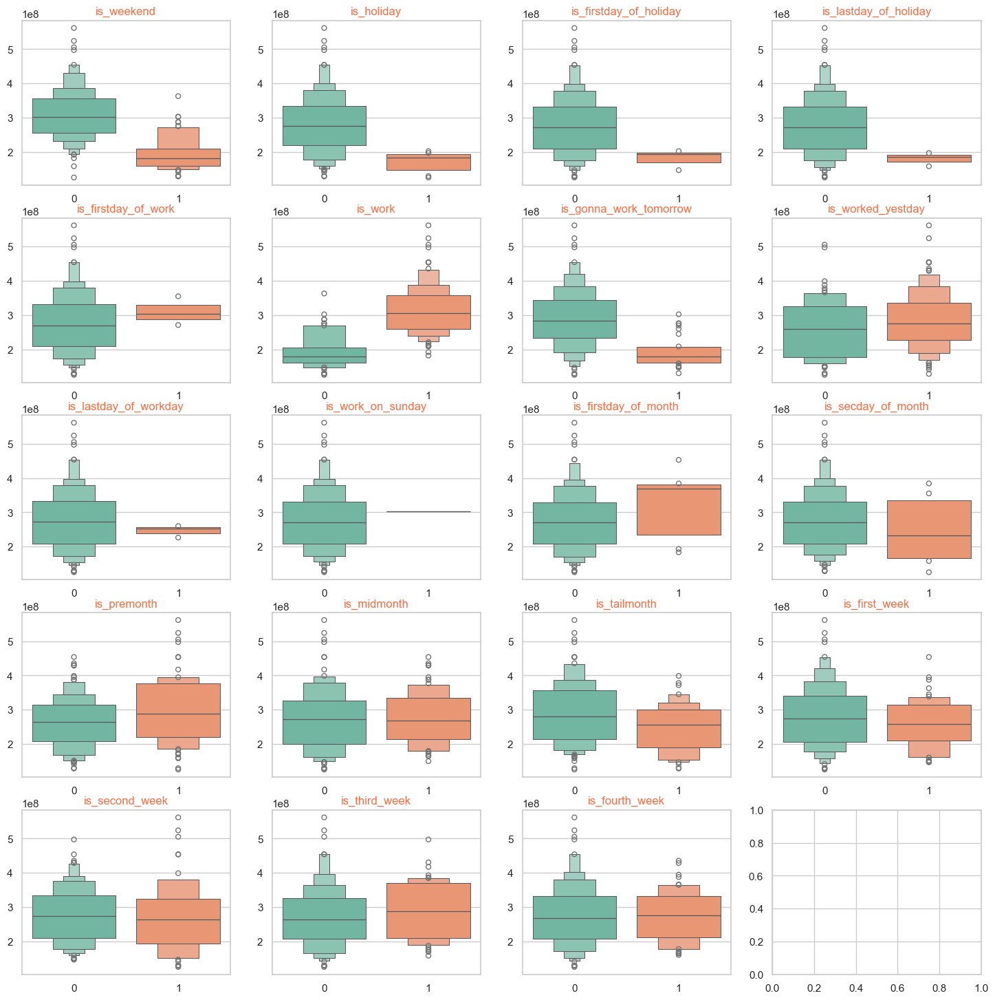

In [113]:
draw_boxplot(feature,label = 'total_purchase_amt')

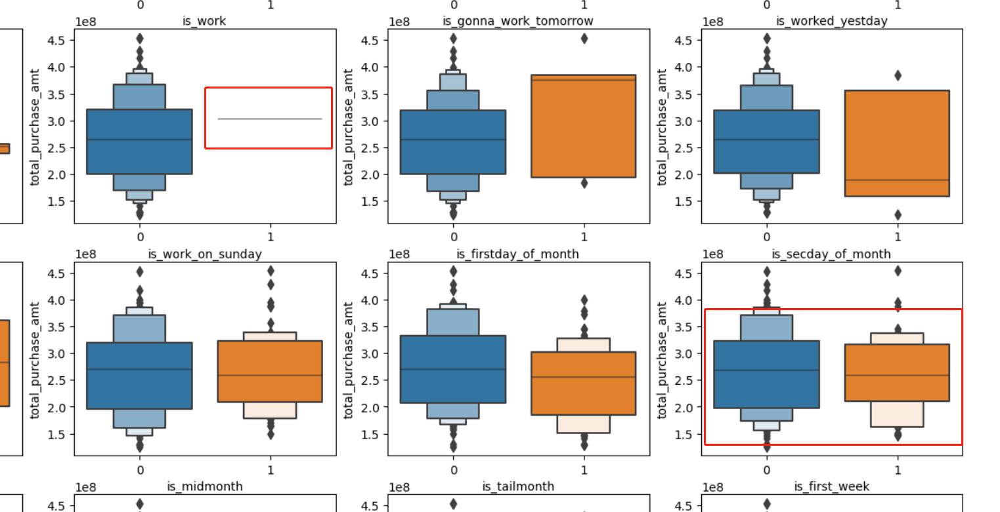

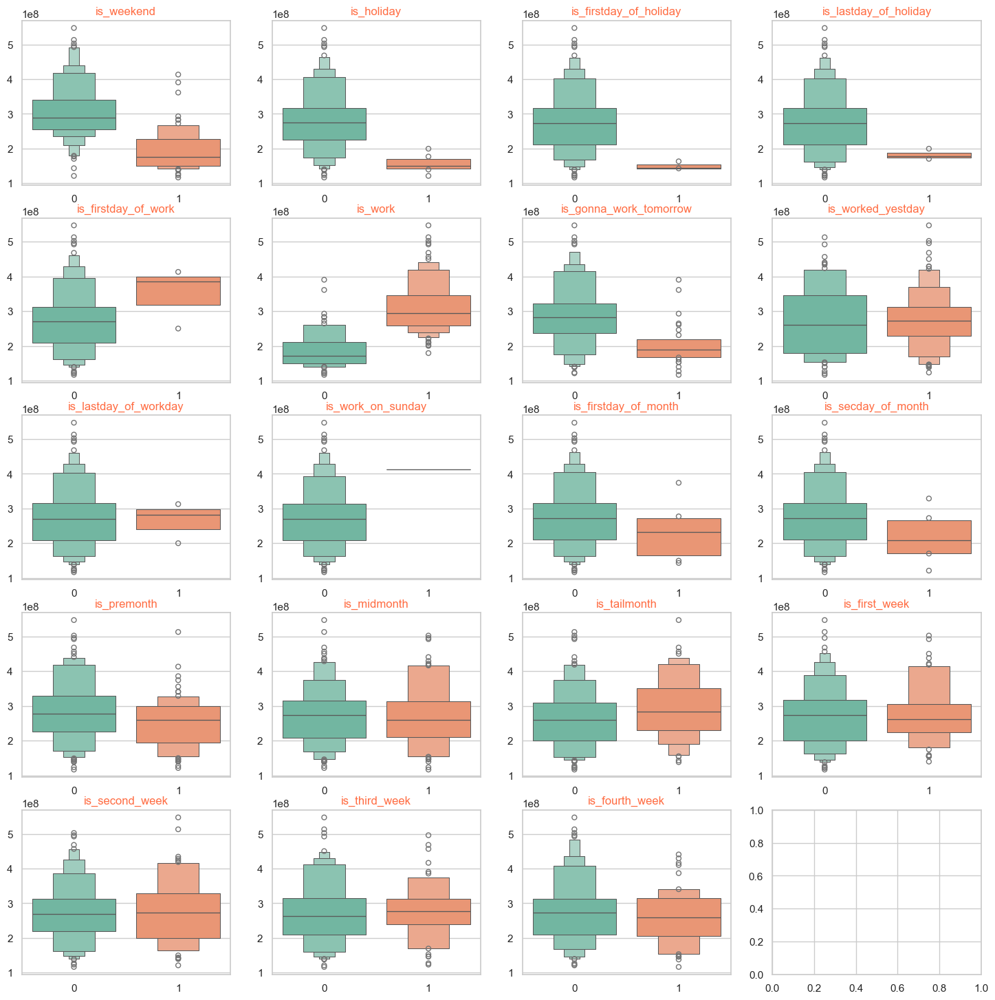

In [114]:
draw_boxplot(feature,label = 'total_redeem_amt')

In [115]:
## 剔除看起来较差的特征

purchase_feature_seems_useless = [
      #样本量太少，建模时无效；但若确定这是一个有用规则，可以对结果做修正
      'is_work_on_sunday',
      #中位数差异不明显
      'is_first_week'
]


### 1.3 IS 特征的相关性分析

In [116]:
# 画相关性热力图

def draw_correlation_heatmap(data: pd.DataFrame, way: str = 'pearson') -> None:
    feature = data.copy()
    plt.figure(figsize=(20,10))
    plt.title('The ' + way +' coleration between total purchase and each feature')
    sns.heatmap(feature[[x for x in feature.columns if x not in ['total_redeem_amt', 'date'] ]].corr(way),
                linecolor='white',
                linewidths=0.2,
                annot = True,
                fmt=".3f",  # 保留三位小数
                annot_kws={"size": 8},  # 调整文字大小
                cmap="RdBu")

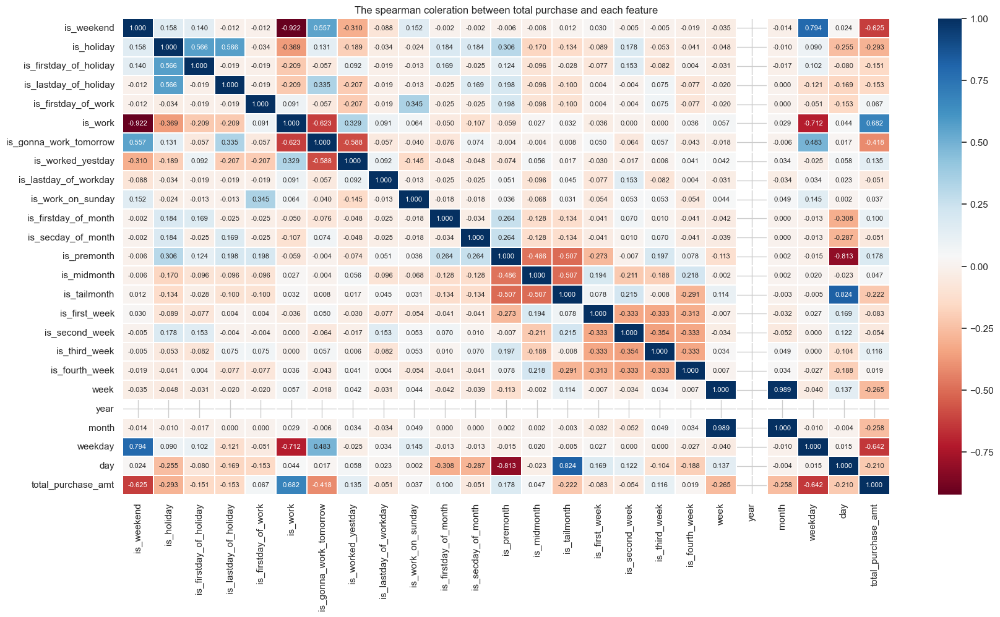

In [117]:
draw_correlation_heatmap(feature, 'spearman')

In [118]:
# 剔除相关性较低的特征

temp = np.abs(feature[[x for x in feature.columns
                       if x not in ['total_redeem_amt', 'date'] ]].corr('spearman')['total_purchase_amt'])
feature_low_correlation = list(set(temp[temp < 0.1].index))

In [119]:
feature_low_correlation

['is_lastday_of_workday',
 'is_second_week',
 'is_fourth_week',
 'is_first_week',
 'is_work_on_sunday',
 'is_secday_of_month',
 'is_midmonth',
 'is_firstday_of_work',
 'is_firstday_of_month']

## 二、基于距离的特征

### 2.1 距离特征提取

In [120]:
# 提取距离特征

def extract_distance_feature(data: pd.DataFrame)->pd.DataFrame:
    total_balance = data.copy()

    # 距离放假还有多少天
    total_balance['dis_to_nowork'] = 0
    for index, row in total_balance.iterrows():
        if row['is_work'] == 0:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_work'] == 1:
                    total_balance.loc[index - step, 'dis_to_nowork'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_nowork'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_work'] == 1:
            total_balance.loc[index, 'dis_from_nowork'] = step
        else:
            step = 0

    # 距离上班还有多少天
    total_balance['dis_to_work'] = 0
    for index, row in total_balance.iterrows():
        if row['is_work'] == 1:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_work'] == 0:
                    total_balance.loc[index - step, 'dis_to_work'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_work'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_work'] == 0:
            total_balance.loc[index, 'dis_from_work'] = step
        else:
            step = 0


    # 距离节假日还有多少天
    total_balance['dis_to_holiday'] = 0
    for index, row in total_balance.iterrows():
        if row['is_holiday'] == 1:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_holiday'] == 0:
                    total_balance.loc[index - step, 'dis_to_holiday'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_holiday'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_holiday'] == 0:
            total_balance.loc[index, 'dis_from_holiday'] = step
        else:
            step = 0

    # 距离节假日最后一天还有多少天
    total_balance['dis_to_holiendday'] = 0
    for index, row in total_balance.iterrows():
        if row['is_lastday_of_holiday'] == 1:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_lastday_of_holiday'] == 0:
                    total_balance.loc[index - step, 'dis_to_holiendday'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_holiendday'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_lastday_of_holiday'] == 0:
            total_balance.loc[index, 'dis_from_holiendday'] = step
        else:
            step = 0

    # 距离月初第几天
    total_balance['dis_from_startofmonth'] = np.abs(total_balance['day'])

    # 距离月的中心点有几天
    total_balance['dis_from_middleofmonth'] = np.abs(total_balance['day'] - 15)

    # 距离星期的中心有几天
    total_balance['dis_from_middleofweek'] = np.abs(total_balance['weekday'] - 3)

    # 距离星期日有几天
    total_balance['dis_from_endofweek'] = np.abs(total_balance['weekday'] - 6)

    return total_balance

In [121]:
# 拼接距离特征到原数据集

total_balance = extract_distance_feature(total_balance)

### 2.2 距离特征分析

In [122]:
# 获取距离特征的列名

feature = total_balance[[x for x in total_balance.columns if x not in date_indexs]]
dis_feature_indexs = [x for x in feature.columns if (x not in date_indexs + labels + ['date']) & ('dis_' in x)]

点线图（Point plot）是一种用于展示两个变量之间关系的图表类型。它适用于连续变量和分类变量之间的关系，通常用于比较不同组别之间的均值或中位数。

点线图的作用包括：

1. 显示趋势：点线图可以帮助我们观察不同类别或组别之间的变量均值或中位数的趋势，从而更直观地了解数据的变化规律。

2. 比较差异：通过点线图，我们可以直观地比较不同类别或组别之间的变量均值或中位数的差异，帮助我们发现数据中的模式和趋势。

3. 展示可信区间：点线图通常会显示可信区间（confidence intervals），这有助于我们评估均值或中位数估计的准确性，并提供关于数据变异程度的信息。

4. 突出异常值：点线图可以帮助我们识别异常值，这些异常值可能表明数据中的特殊情况或异常事件。

In [123]:
# 画点线

def draw_point_feature(data: pd.DataFrame) -> None:
    # Copy the data
    feature = data.copy()

    # Create subplots
    f, axes = plt.subplots(data.shape[1] // 3, 3, figsize=(30, data.shape[1] // 3 * 4))

    # Counter
    count = 0

    # Iterate over feature columns to draw point plots
    for i in [x for x in feature.columns if (x not in date_indexs + labels + ['date'])]:
        # Draw point plot
        sns.pointplot(x=i, y="total_purchase_amt",
                      marker="o",  # Set marker style to circle
                      data=feature,  # Data source
                      ax=axes[count // 3][count % 3] if data.shape[1] > 3 else axes[count])  # Set subplot position

        # Update counter
        count += 1

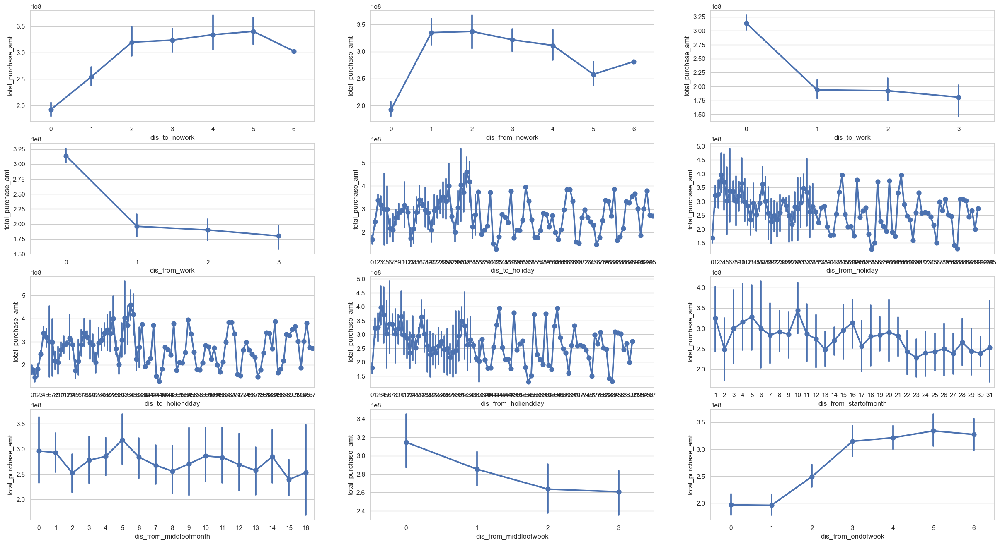

In [124]:
draw_point_feature(feature[['total_purchase_amt'] + dis_feature_indexs])

In [125]:
# 处理距离过远的时间点

def dis_change(x):
    if x > 5:
        x = 10
    return x

In [126]:
# 处理特殊距离

dis_holiday_feature = [x for x in total_balance.columns if 'dis' in x and 'holi' in x]
dis_month_feature = [x for x in total_balance.columns if 'dis' in x and 'month' in x]
total_balance[dis_holiday_feature] = total_balance[dis_holiday_feature].applymap(dis_change)
total_balance[dis_month_feature] = total_balance[dis_month_feature].applymap(dis_change)

In [127]:
feature = total_balance[[x for x in total_balance.columns if x not in date_indexs]]

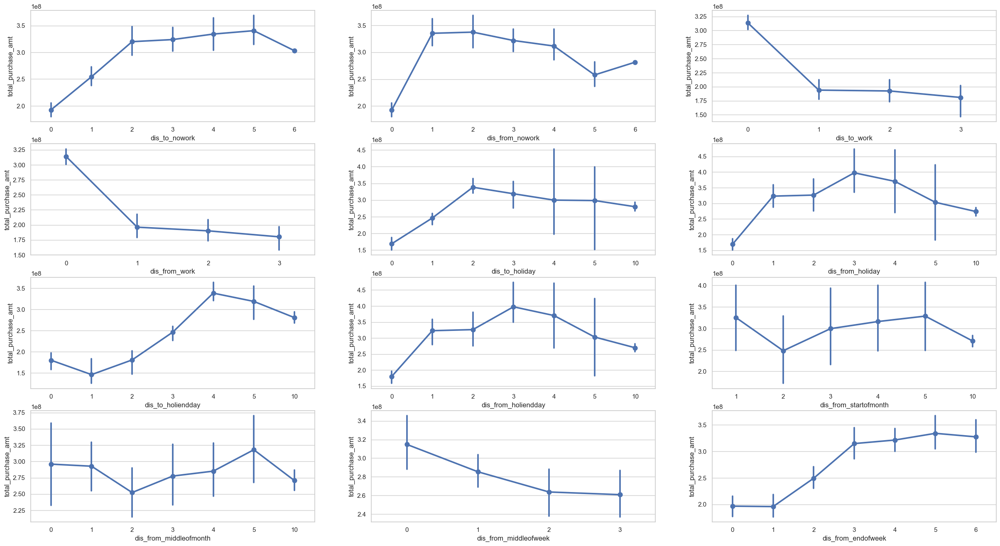

In [128]:
# 画处理后的点线图

draw_point_feature(feature[['total_purchase_amt'] + dis_feature_indexs])

In [129]:
## 剔除看起来用处不大的特征
purchase_feature_seems_useless += [
                                  #即使做了处理，但方差太大，不可信，规律不明显
                                  'dis_to_holiday',
                                  #方差太大，不可信
                                  'dis_from_startofmonth',
                                  #方差太大，不可信
                                  'dis_from_middleofmonth'
]

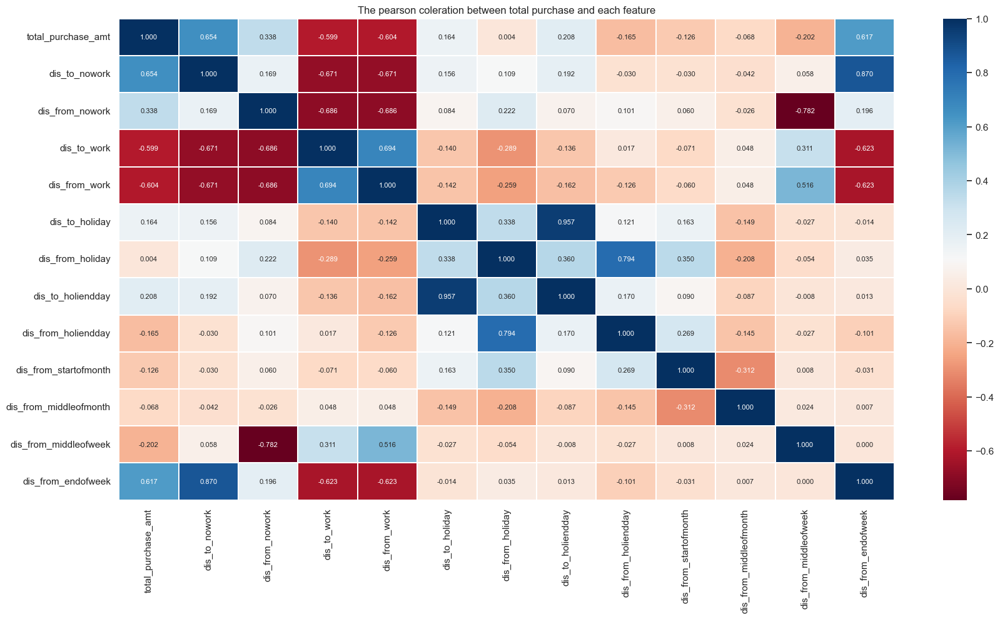

In [130]:
# 画出相关性图

draw_correlation_heatmap(feature[['total_purchase_amt'] + dis_feature_indexs])

In [131]:
# 剔除相关性较差的特征

temp = np.abs(feature[[x for x in feature.columns
                       if ('dis' in x) | (x in ['total_purchase_amt']) ]].corr()['total_purchase_amt'])
feature_low_correlation += list(set(temp[temp < 0.1].index) )

In [132]:
feature_low_correlation

['is_lastday_of_workday',
 'is_second_week',
 'is_fourth_week',
 'is_first_week',
 'is_work_on_sunday',
 'is_secday_of_month',
 'is_midmonth',
 'is_firstday_of_work',
 'is_firstday_of_month',
 'dis_from_middleofmonth',
 'dis_from_holiday']

## 三、波峰波谷特征

### 3.1 提取波峰特征

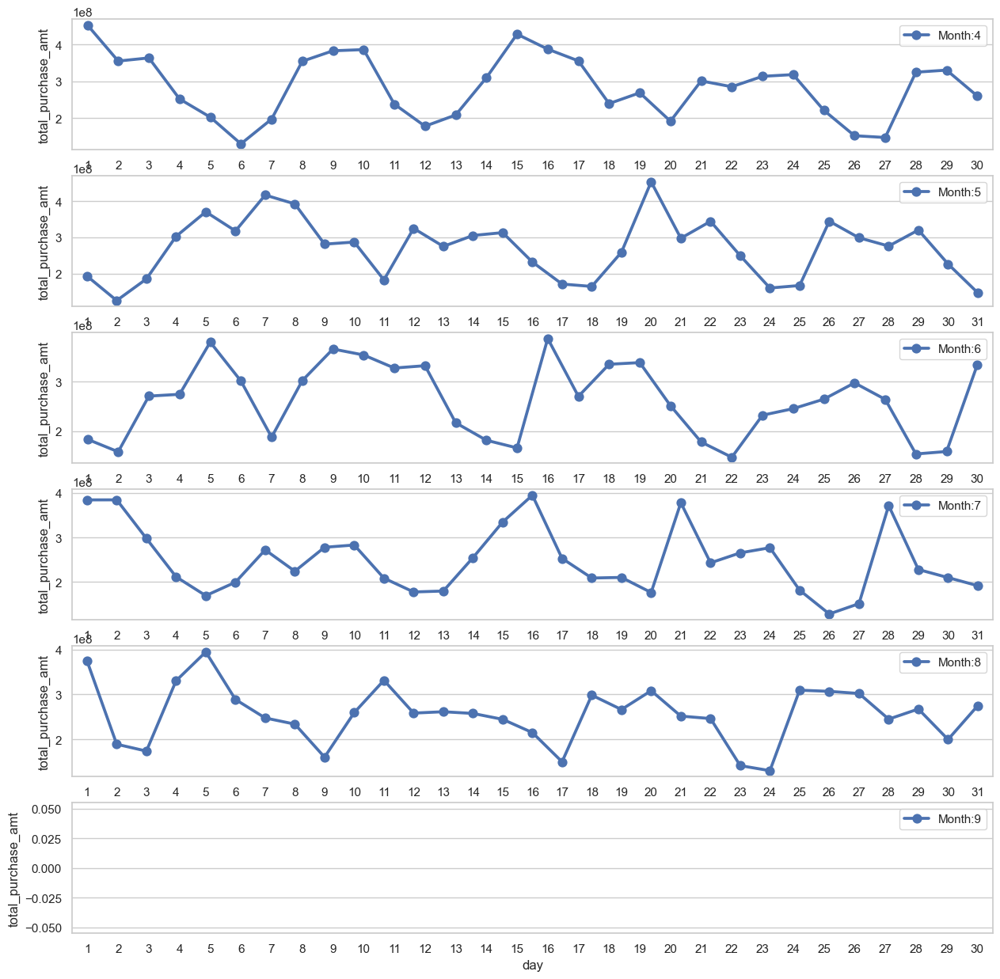

In [133]:
# 观察波峰特点
import datetime
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(15,15))
for i in range(4, 10):
    plt.subplot(6,1,i - 3)
    total_balance_2 = total_balance[(total_balance['date'].dt.date >= datetime.date(2014,i,1)) \
                                    & (total_balance['date'].dt.date < datetime.date(2014,i+1,1))]
    sns.pointplot(x=total_balance_2['day'],y=total_balance_2['total_purchase_amt'], label='Month:' + str(i))
    plt.legend()
plt.show()


In [134]:
#Purchase

#0401(周二)                                     0406（周日，清明节第二天）
#0410(周四，与周二近似)                         0412（周六，与周日近似）
#0415（周二）                                   0420（周日）
#0424（周四，与周二在近似水平）                 0427（周日）
#0429（周二）                                   0502（周五，劳动节第二天）
#0507（周三，与周二差异较大，可能受劳务节影响） 0511（周日）
#0512（周一，与周二有一定差距）                 0518（周日）
#0519（周二）                                   0525（周日）
#0526（周一，与周二有一定差距）                 0531（周六，月末）
#0605（周四，与周二差异大，可能受端午节影响）   0607（周六，可能受端午节影响）
#0609（周一，与周二近似）                       0615（周日）
#0616（周一，与周二差异大）                     0622（周日）
#0626（周四，与周二差异不大）                   0629（周日）
#0701（周二）                                   0705（周六，与周日差距不大）
#0707（周一，与周二有差距）                     0713（周日）
#0716（周三，与周二有一定差距）                 0720（周日）
#0721（周一，与周二有明显差距）                 0726（周六，与周日近似）
#0728（周一，与周二有明显差距）                 0803（周日）
#0805（周二）                                   0809（周六，与周日有较大差距）
#0811（周一，有周二有较大差距）                 0817（周日）
#0818（周一，与周二差距不大）                   0824（周日）

In [135]:
# 设定波峰日期

def extract_peak_feature(data: pd.DataFrame)->pd.DataFrame:
    total_balance = data.copy()
    # 距离purchase波峰（即周二）有几天
    total_balance['dis_from_purchase_peak'] = np.abs(total_balance['weekday'] - 1)

    # 距离purchase波谷（即周日）有几天，与dis_from_endofweek相同
    total_balance['dis_from_purchase_valley'] = np.abs(total_balance['weekday'] - 6)

    return total_balance

In [136]:
# 提取波峰特征

total_balance = extract_peak_feature(total_balance)
feature = total_balance[[x for x in total_balance.columns if x not in date_indexs]]

### 3.2 分析波峰特征

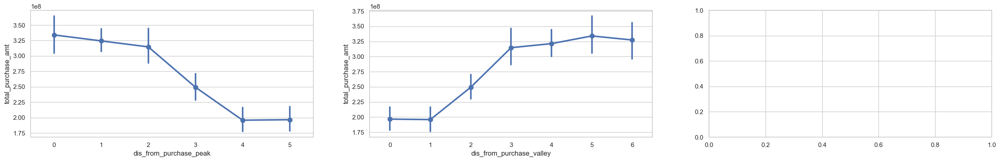

In [137]:
draw_point_feature(feature[['total_purchase_amt'] + ['dis_from_purchase_peak','dis_from_purchase_valley']])

### 3.3 分析波峰特征相关性

In [138]:
temp = np.abs(feature[[x for x in feature.columns if ('peak' in x) or ('valley' in x) or (x in ['total_purchase_amt']) ]].corr()['total_purchase_amt'])
temp

total_purchase_amt         1.0000
dis_from_purchase_peak     0.6396
dis_from_purchase_valley   0.6170
Name: total_purchase_amt, dtype: float64

## 四、加入周期因子作为特征

### 4.1 提取周期因子

In [139]:
def generate_rate(df, month_index):
    """
    生成购买和赎回的周和日均值比例

    参数：
        df: 包含日期、总购买金额和总赎回金额的DataFrame
        month_index: 要生成比例的月份索引

    返回值：
        weekday_rate: 每周的平均比例
        day_rate: 每日的平均比例
    """

    # 复制输入的 DataFrame
    total_balance = df.copy()

    # 从总余额中提取日期、总购买金额和总赎回金额
    pure_balance = total_balance[['date','total_purchase_amt','total_redeem_amt']]

    # 筛选出指定月份之前的数据
    pure_balance = pure_balance[(pure_balance['date'].dt.date >= datetime.date(2014, 3, 1)) \
                                & (pure_balance['date'].dt.date < datetime.date(2014, month_index, 1))]

    # 提取日期的星期几、日期、周数和月份
    pure_balance['weekday'] = pure_balance['date'].dt.weekday
    pure_balance['day'] = pure_balance['date'].dt.day
    pure_balance['week'] = pure_balance['date'].dt.isocalendar().week
    pure_balance['month'] = pure_balance['date'].dt.month

    # 计算每周的平均购买和赎回比例
    weekday_rate = pure_balance[['weekday']+labels].groupby('weekday', as_index=False).mean()
    for name in labels:
        weekday_rate = weekday_rate.rename(columns={name: name+'_weekdaymean'})
    weekday_rate['total_purchase_amt_weekdaymean'] /= np.mean(pure_balance['total_purchase_amt'])
    weekday_rate['total_redeem_amt_weekdaymean'] /= np.mean(pure_balance['total_redeem_amt'])

    # 将每周的平均比例与原始数据合并
    pure_balance = pd.merge(pure_balance, weekday_rate, on='weekday', how='left')

    # 计算每天的购买和赎回比例
    weekday_count = pure_balance[['day','weekday','date']].groupby(['day','weekday'], as_index=False).count()
    weekday_count = pd.merge(weekday_count, weekday_rate, on='weekday')
    weekday_count['total_purchase_amt_weekdaymean'] *= weekday_count['date'] / (len(set(pure_balance['month'])) - 1)
    weekday_count['total_redeem_amt_weekdaymean'] *= weekday_count['date'] / (len(set(pure_balance['month'])) - 1)
    day_rate = weekday_count.drop(['weekday','date'], axis=1).groupby('day', as_index=False).sum()

    # 重命名列
    weekday_rate.columns = ['weekday','purchase_weekdayrate','redeem_weekdayrate']
    day_rate.columns = ['day','purchase_dayrate','redeem_dayrate']

    # 将每天的日期添加到 DataFrame 中
    day_rate['date'] = datetime.datetime(2014, month_index, 1)
    for index, row in day_rate.iterrows():
        if month_index in (2, 4, 6, 9) and row['day'] == 31:
            continue
        day_rate.loc[index, 'date'] = datetime.datetime(2014, month_index, int(row['day']))

    # 添加星期几，并计算每日的购买和赎回比例
    day_rate['weekday'] = day_rate['date'].dt.weekday
    day_rate = pd.merge(day_rate, weekday_rate, on='weekday')
    day_rate['purchase_dayrate'] = day_rate['purchase_weekdayrate'] / day_rate['purchase_dayrate']
    day_rate['redeem_dayrate'] = day_rate['redeem_weekdayrate'] / day_rate['redeem_dayrate']

    # 添加月份信息
    weekday_rate['month'] = month_index
    day_rate['month'] = month_index

    # 返回每周和每日的比例
    return weekday_rate, day_rate[['day','purchase_dayrate','redeem_dayrate','month']].sort_values('day')


In [140]:
# 生成周期因子并合并到数据集

weekday_rate_list = []
day_rate_list = []
for i in range(3, 10):
    weekday_rate, day_rate = generate_rate(total_balance, i)
    weekday_rate_list.append(weekday_rate.reset_index(drop=True))
    day_rate_list.append(day_rate.reset_index(drop=True))

weekday_rate_list = pd.concat(weekday_rate_list).reset_index(drop=True)
day_rate_list = pd.concat(day_rate_list).reset_index(drop=True)
total_balance = pd.merge(total_balance, weekday_rate_list, on=['weekday','month'], how='left')
total_balance = pd.merge(total_balance, day_rate_list, on=['day','month'], how='left')

In [141]:
# 对周期因子进行特殊处理 中位数来填充缺失值

for i in [x for x in total_balance.columns
          if 'rate' in x and x not in labels + date_indexs]:
    total_balance[i] = total_balance[i].fillna(np.nanmedian(total_balance[i]))

### 4.2 分析周期因子的相关性

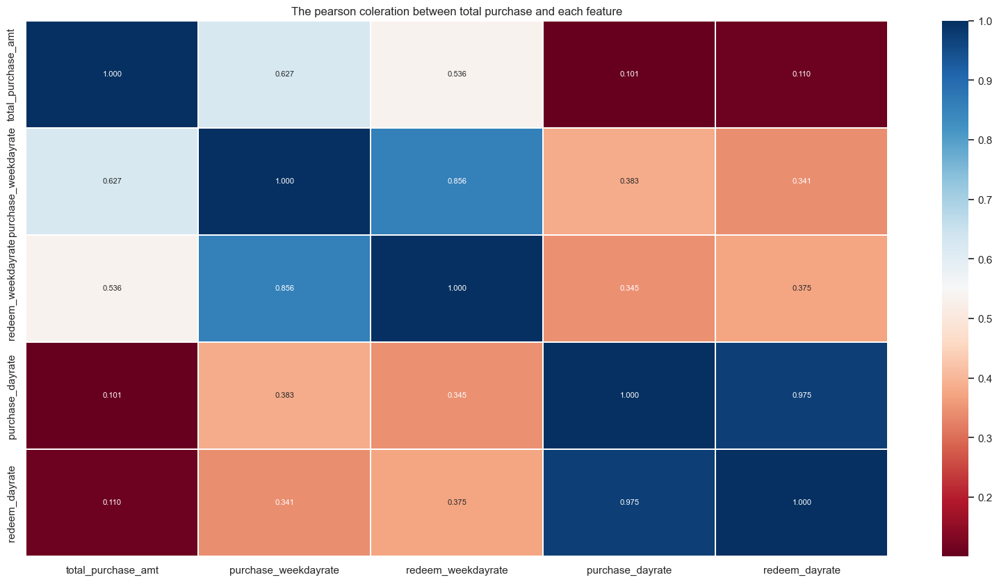

In [142]:
# 画出相关性图

draw_correlation_heatmap(total_balance[['total_purchase_amt']
                                       + [x for x in total_balance.columns
                                          if 'rate' in x and x not in labels + date_indexs]])

In [143]:
# 剔除相关性低的特征

feature = total_balance.drop(date_indexs, axis=1)

## 五、加入动态时序特征

### 5.1 提取动态特征

主要是针对每周中不同星期的购买金额进行统计，并计算其统计特征，如中位数、平均值、最小值、最大值、标准差和偏度等。

In [144]:
def get_amtfeature_with_time(data: pd.DataFrame) -> pd.DataFrame:
    # 复制输入数据集的一部分，并保留必要的列（labels、date_indexs和'date'）
    df_tmp_ = data[labels + date_indexs + ['date']].copy()
    total_balance = data.copy()  # 复制整个输入数据集

    # 选择日期大于等于2014年3月3日的数据
    df_tmp_ = df_tmp_[(df_tmp_['date'].dt.date >= datetime.date(2014, 3, 3))]

    # 添加新特征：星期几、第几周、日期中的天和月份
    df_tmp_['weekday'] = df_tmp_['date'].dt.weekday + 1
    df_tmp_['week'] = df_tmp_['date'].dt.isocalendar().week - min(df_tmp_['date'].dt.isocalendar().week) + 1
    df_tmp_['day'] = df_tmp_['date'].dt.day
    df_tmp_['month'] = df_tmp_['date'].dt.month

    # 重置索引
    df_tmp_.reset_index(inplace=True)
    del df_tmp_['index']

    # 创建一个新的 DataFrame 用于存储每周中每天的购买金额
    df_purchase = pd.DataFrame(columns=['weekday1', 'weekday2', 'weekday3', 'weekday4',
                                         'weekday5', 'weekday6', 'weekday7'])
    count = 0

    # 遍历数据，将每个星期的购买金额存储到 df_purchase 中对应的列中
    for i in range(len(df_tmp_)):
        df_purchase.loc[count, 'weekday'+str(df_tmp_.loc[i, 'weekday'])] = df_tmp_.loc[i, 'total_purchase_amt']
        if df_tmp_.loc[i, 'weekday'] == 7:
            count = count + 1

    # 初始化用于存储动态特征的列
    df_tmp_['purchase_weekday_median'] = np.nan
    df_tmp_['purchase_weekday_mean'] = np.nan
    df_tmp_['purchase_weekday_min'] = np.nan
    df_tmp_['purchase_weekday_max'] = np.nan
    df_tmp_['purchase_weekday_std'] = np.nan
    df_tmp_['purchase_weekday_skew'] = np.nan

    # 计算动态特征：购买金额的中位数、平均值、最小值、最大值、标准差和偏度
    for i in range(len(df_tmp_)):
        if i > 4*7-1:  # 从2014年3月31日开始统计
            df_tmp_.loc[i, 'purchase_weekday_median'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                       'weekday'+str(df_tmp_.loc[i, 'weekday'])].median()
            df_tmp_.loc[i, 'purchase_weekday_mean'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                     'weekday'+str(df_tmp_.loc[i, 'weekday'])].mean()
            df_tmp_.loc[i, 'purchase_weekday_min'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                    'weekday'+str(df_tmp_.loc[i, 'weekday'])].min()
            df_tmp_.loc[i, 'purchase_weekday_max'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                    'weekday'+str(df_tmp_.loc[i, 'weekday'])].max()
            df_tmp_.loc[i, 'purchase_weekday_std'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                    'weekday'+str(df_tmp_.loc[i, 'weekday'])].std()
            df_tmp_.loc[i, 'purchase_weekday_skew'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                     'weekday'+str(df_tmp_.loc[i, 'weekday'])].skew()

    # 要合并到总体数据集的特征列列表
    colList = ['purchase_weekday_median', 'purchase_weekday_mean', 'purchase_weekday_min',
               'purchase_weekday_max', 'purchase_weekday_std', 'purchase_weekday_skew']

    # 将新特征列合并到原始数据集中，基于天和月份
    total_balance = pd.merge(total_balance, df_tmp_[colList+['day', 'month']], on=['day', 'month'], how='left')

    return total_balance


In [145]:
# 合并特征到数据集

total_balance = get_amtfeature_with_time(total_balance)

In [146]:
# 对动态特征做特殊处理

for i in [x for x in total_balance.columns
          if '_weekday_' in x and x not in labels + date_indexs]:
    total_balance[i] = total_balance[i].fillna(np.nanmedian(total_balance[i]))

### 5.2 分析动态特征相关性

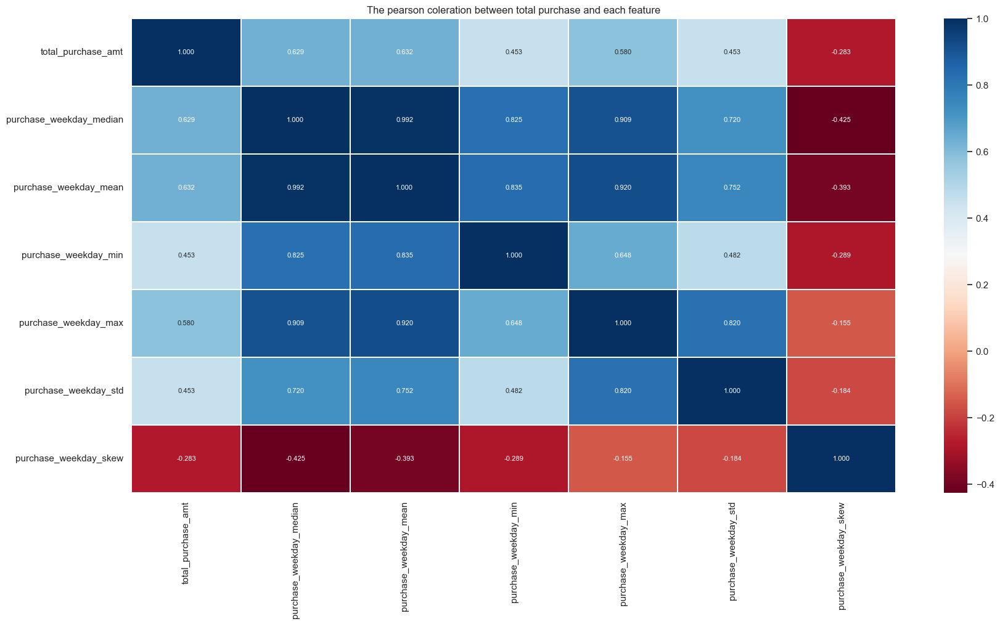

In [147]:
# 绘制动态特征的相关性图

draw_correlation_heatmap(total_balance[['total_purchase_amt'] +
                                      ['purchase_weekday_median',
                                      'purchase_weekday_mean','purchase_weekday_min',
                                       'purchase_weekday_max','purchase_weekday_std',
                                       'purchase_weekday_skew'
                                      ]])

In [148]:
feature[labels + ['dis_to_nowork', 'dis_to_work', 'dis_from_work', 'purchase_weekdayrate',
       'redeem_dayrate', 'weekday_onehot_5', 'weekday_onehot_6',
       'dis_from_nowork', 'is_holiday', 'weekday_onehot_1', 'weekday_onehot_2',
       'weekday_onehot_0', 'dis_from_middleofweek', 'dis_from_holiendday',
       'weekday_onehot_3', 'is_lastday_of_holiday', 'is_firstday_of_holiday',
       'weekday_onehot_4', 'is_worked_yestday', 'is_second_week',
       'is_third_week', 'dis_from_startofmonth', 'dis_from_holiday', 'total_purchase_amt',
       'total_redeem_amt', 'date']].to_csv('residual_purchase_origined.csv', index=False)

#  特征劣汰剔除

### 1.1 剔除无法有效分割数据集的特征

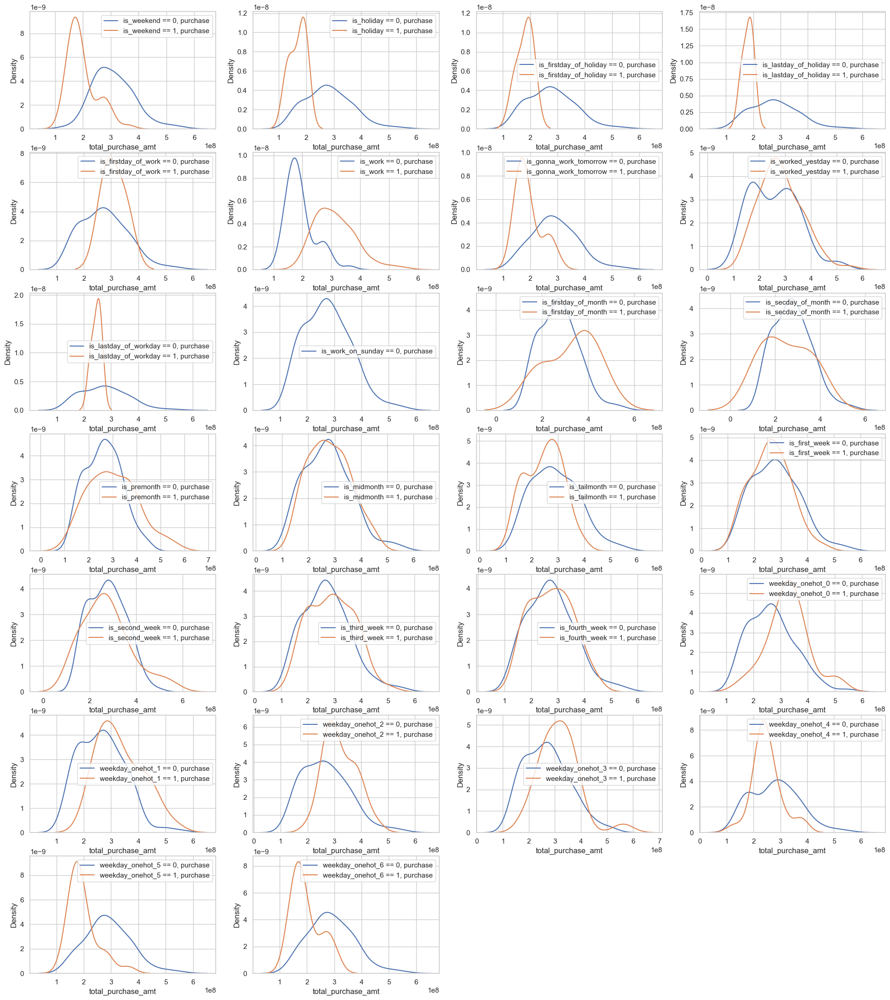

In [149]:
# 画出各个特征分割数据集的分布估计图
plt.figure(figsize=(4 * 6, 6 * len(feature.columns) / 6))
count = 0
for i in [x for x in feature.columns
          if (x not in labels + date_indexs + ['date'])
          & ('amt' not in x) & ('dis' not in x) & ('rate' not in x)]:
    count += 1
    # if feature[feature[i] == 0].empty:
    #     continue
    plt.subplot(12, 4, count)

    ax = sns.kdeplot(feature[feature[i] == 0]['total_purchase_amt'], label= str(i) + ' == 0, purchase')
    ax = sns.kdeplot(feature[feature[i] == 1]['total_purchase_amt'], label= str(i) + ' == 1, purchase')
    plt.legend()

In [150]:
# 剔除对数据集划分不明显的特征

purchase_feature_seems_useless += ['is_gonna_work_tomorrow','is_fourth_week','weekday_onehot_4']

# 选出优胜特征

In [151]:
# 分割数据集

def split_data_underline(data):
    import datetime
    trainset = data[(datetime.date(2014,4,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,8,1))]
    testset = data[(datetime.date(2014,8,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,9,1))]
    return trainset, testset

### 1.1 使用SHAP包获取优胜特征

> SHAP testues represent the fair score of features depending on their contribution towards the total score in the set of features.

> SHAP also can visualize how the score changes when the feature testue is low/high on each data.

SHAP的基本原理是对特征的不同取值进行排列组合，并计算每种排列组合下对预测结果的影响。具体来说，SHAP值衡量了每个特征值对于模型输出的“贡献”，即在所有可能的特征组合中，每个特征值对于预测结果的平均影响程度。这种平均影响程度可以用于解释单个预测结果的模型预测。

In [152]:
duplicated_col = feature.columns.duplicated()
feature = feature.loc[:,~duplicated_col]

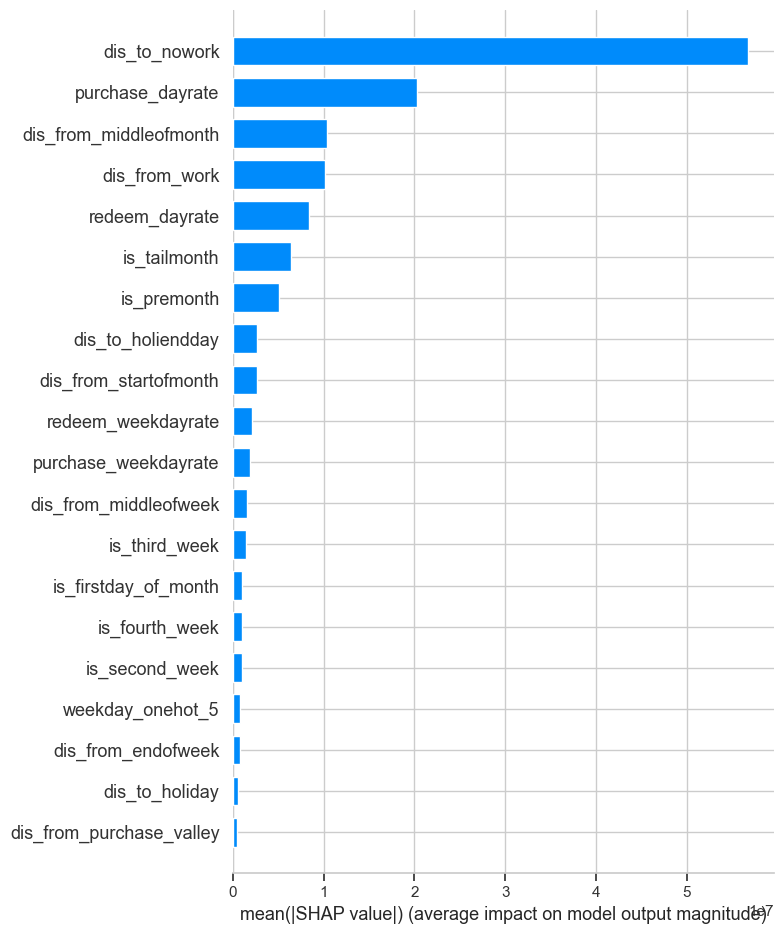

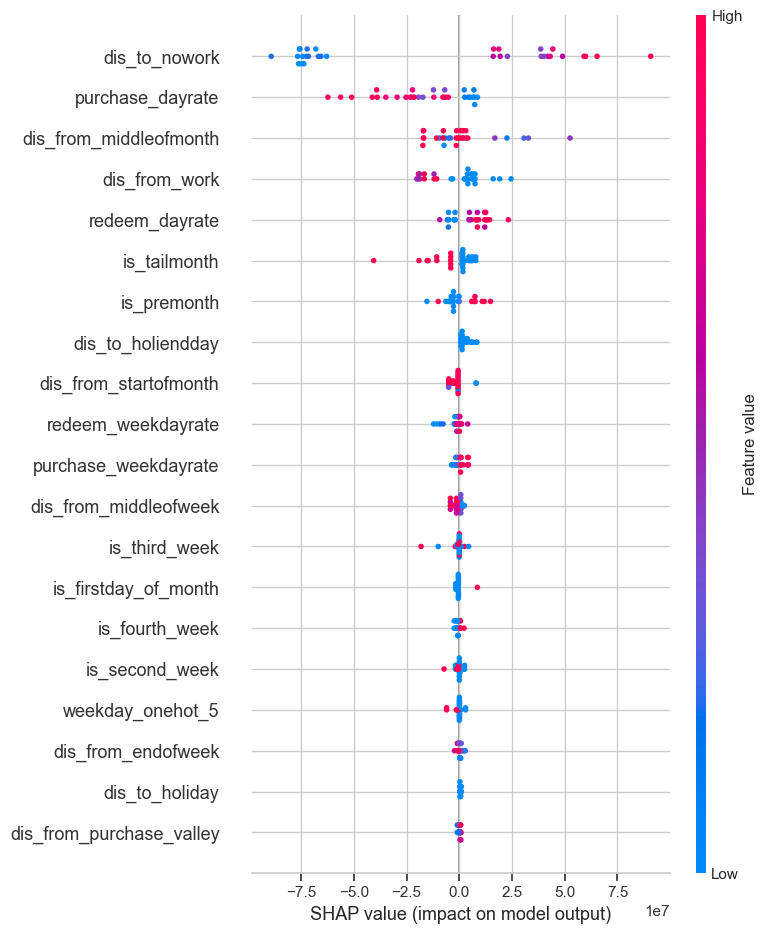

In [153]:
shap.initjs()
from sklearn import tree
model = tree.DecisionTreeRegressor()
train, test = split_data_underline(feature.dropna())
features = [x for x in train.columns if x not in date_indexs]
model.fit(train[features].drop(labels+['date'], axis=1), train['total_purchase_amt'])

explainer = shap.TreeExplainer(model)
shap_testues = explainer.shap_values(test[features].drop(labels+['date'], axis=1))

shap.summary_plot(shap_testues, test[features].drop(labels+['date'], axis=1), plot_type='bar')

shap.summary_plot(shap_testues, test[features].drop(labels+['date'], axis=1))

tree_important_purchase = pd.DataFrame(np.mean(np.abs(shap_testues), axis=0),[x for x in features if x not in labels + date_indexs + ['date']]).reset_index()

In [154]:
tree_important_purchase = tree_important_purchase.sort_values(0, ascending=False).reset_index(drop=True)
tree_important_purchase = list(tree_important_purchase[:30]['index'])

In [155]:
tree_important_purchase

['dis_to_nowork',
 'purchase_dayrate',
 'dis_from_middleofmonth',
 'dis_from_work',
 'redeem_dayrate',
 'is_tailmonth',
 'is_premonth',
 'dis_to_holiendday',
 'dis_from_startofmonth',
 'redeem_weekdayrate',
 'purchase_weekdayrate',
 'dis_from_middleofweek',
 'is_third_week',
 'is_firstday_of_month',
 'is_fourth_week',
 'is_second_week',
 'weekday_onehot_5',
 'dis_from_endofweek',
 'dis_to_holiday',
 'dis_from_purchase_valley',
 'weekday_onehot_0',
 'is_lastday_of_holiday',
 'is_first_week',
 'is_lastday_of_workday',
 'weekday_onehot_1',
 'dis_from_holiendday',
 'is_midmonth',
 'dis_from_nowork',
 'weekday_onehot_2',
 'is_gonna_work_tomorrow']

In [156]:
# 输出选择的特征

def draw_cloud(feature_index: List[str])->None:
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    ciyun = WordCloud(background_color='white', max_font_size=40)
    ciyun.generate(text=''.join([x+' ' for x in feature_index if x != 'total_purchase_amt']))
    plt.imshow(ciyun, interpolation='bilinear')
    plt.axis("off")


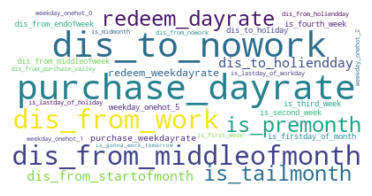

In [157]:
draw_cloud(tree_important_purchase)

### 1.2 使用Permutation importance包获取优胜特征

Permutation importance是一种用于解释机器学习模型的特征重要性的方法。它通过对特征进行随机置换（即打乱特征值的顺序），然后观察模型性能的变化来衡量特征的重要性。其基本思想是，如果某个特征对于模型的预测具有重要性，那么将其打乱后，模型的性能将受到较大影响；反之，如果某个特征对于模型的预测不重要，那么将其打乱后，模型的性能变化应该较小。

In [162]:
model = LinearRegression()
train, test = split_data_underline(feature.dropna())
model.fit(train[features].drop(labels+['date'], axis=1), train['total_purchase_amt'])
perm = PermutationImportance(model, random_state=42).fit(test[features].drop(labels+['date'], axis=1), test['total_purchase_amt'])
liner_important_purchase = pd.DataFrame(np.abs(perm.feature_importances_), [x for x in features if x not in labels + date_indexs + ['date']]).reset_index()
eli5.show_weights(perm, feature_names=list(str(x) for x in features if x not in labels + ['date']))


Weight,Feature
2.7721 ± 1.0007,redeem_weekdayrate
2.4609 ± 0.8026,dis_to_work
0.9072 ± 0.7078,dis_from_endofweek
0.8767 ± 0.2668,dis_from_purchase_valley
0.5286 ± 0.2775,is_gonna_work_tomorrow
0.3869 ± 0.2305,purchase_dayrate
0.2385 ± 0.2484,is_firstday_of_month
0.1503 ± 0.1062,dis_from_purchase_peak
0.1477 ± 0.1220,is_premonth
0.1419 ± 0.1316,weekday_onehot_5


In [163]:
liner_important_purchase = liner_important_purchase.sort_values(0, ascending=False).reset_index(drop=True)
liner_important_purchase = list(liner_important_purchase[:30]['index'])


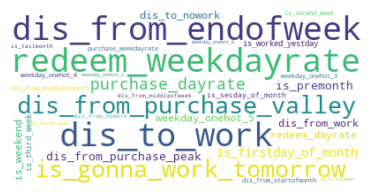

In [164]:
draw_cloud(liner_important_purchase)

### 1.3 量特征集合取交集选出最终优胜特征

In [165]:
winer_features_purchase = list(set(tree_important_purchase)\
                     & set(liner_important_purchase))

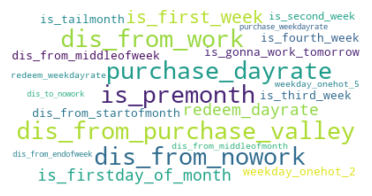

In [166]:
draw_cloud(winer_features_purchase)

In [167]:
# 分割数据集

labels = ['total_purchase_amt', 'total_redeem_amt']

def split_data_underline(data: pd.DataFrame)->pd.DataFrame:
    trainset = data[(datetime.date(2014,4,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,8,1))]
    testset = data[(datetime.date(2014,8,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,9,1))]
    return trainset, testset

def split_data_online(data: pd.DataFrame)->pd.DataFrame:
    trainset = data[(datetime.date(2014,4,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,9,1))]
    testset = data[(datetime.date(2014,9,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,10,1))]
    return trainset, testset

In [168]:
# 定义评价函数

def AE(y: Iterable, yhat: Iterable)->Iterable:
    return np.abs(y - yhat) / np.abs(y)

def total_AE(purchasehat: Iterable, redeemhat: Iterable, purchase: Iterable, redeem: Iterable, h: int = 0.3)->Iterable:
    return sum(map(lambda x : np.exp(-x/h)*10, AE(purchase, purchasehat))) * 0.45 + sum(map(lambda x : np.exp(-x/h)*10, AE(redeem, redeemhat))) * 0.55

In [169]:
# 在不同的时间段对模型进行验证

def week_evalution_single(data: pd.DataFrame, model: object, types: str)->pd.DataFrame:
    results = []
    a_month = relativedelta(months=1)
    for i in [datetime.date(2014, 8, 1), datetime.date(2014, 7, 25), datetime.date(2014, 7, 18), datetime.date(2014, 7, 11),
          datetime.date(2014, 7, 4), datetime.date(2014, 6, 27), datetime.date(2014, 6,20)]:
        trainset = data[(i - 4 * a_month <= data['date'].dt.date) & (data['date'].dt.date < i)]
        testset = data[(i <= data['date'].dt.date) & (data['date'].dt.date < i + a_month)]
        if len(testset) == 0 or len(trainset) == 0:
            i = datetime.date(2014, 4, 20)
            trainset = data[(i - 4 * a_month <= data['date'].dt.date) & (data['date'].dt.date < i)]
            testset = data[(i <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014, 9, 1))]
        feature = [x for x in trainset.columns if x not in ['total_purchase_amt','total_redeem_amt','date']]

        model.fit(X=trainset[feature], y=trainset['total_' + types + '_amt'])
        result_lr = model.predict(testset[feature])

        h = 0.3
        results.append(sum(AE(testset['total_' + types + '_amt'], result_lr).apply(lambda x : np.exp(-x/h))*10))
    return pd.DataFrame(results)

In [170]:
# 输出评级表格

def draw_eva_table(df: pd.DataFrame)->pd.DataFrame:
    rest = df.copy()
    rest['interval'] = [datetime.date(2014, 8, 1), datetime.date(2014, 7, 25), datetime.date(2014, 7, 18), datetime.date(2014, 7, 11),
          datetime.date(2014, 7, 4), datetime.date(2014, 6, 27), datetime.date(2014, 6,20)]
    return rest

In [171]:
# 对生成结果进行可视化

def visual(result_purchase_lr: Iterable, result_redeem_lr: Iterable, testset: pd.DataFrame)->None:
    fig = plt.figure(figsize=(10,4))
    plt.plot(testset['date'], result_purchase_lr, label='predicted_purchase')
    plt.plot(testset['date'], testset['total_purchase_amt'], label='real_purchase')

    plt.legend(loc='best')
    plt.title("The distribution of real and predict purchase")
    plt.xlabel("Time")
    plt.ylabel("Amount")
    plt.show()
    fig = plt.figure(figsize=(10,4))
    sns.barplot(x = testset['date'].dt.day ,y = result_purchase_lr - testset['total_purchase_amt'])

    fig = plt.figure(figsize=(10,4))
    plt.plot(testset['date'], result_redeem_lr, label='predicted_redeem')
    plt.plot(testset['date'], testset['total_redeem_amt'], label='real_redeem')

    plt.legend(loc='best')
    plt.title("The distribution of real and predict redeem")
    plt.xlabel("Time")
    plt.ylabel("Amount")
    plt.show()
    fig = plt.figure(figsize=(10,4))
    sns.barplot(x = testset['date'].dt.day ,y = result_redeem_lr - testset['total_redeem_amt'])

In [172]:
# 定义提取线下最好效果特征的函数

def feature_extract(data: pd.DataFrame, model: object, types: str)->Tuple[List[str], List[float]]:
    features = [x for x in data.columns if x not in labels + ['date']]
    random.shuffle(features)
    results = []
    score = -1
    for i in features:
        score_update = np.mean(week_evalution_single(data[results + [i] + labels + ['date']], model, types))
        if score_update > score:
            score = score_update
            results.append(i)
    return results, score

def robust_feature_extract(data: pd.DataFrame, model: object, types: str):
    results = []
    score = -1
    for i in range(10):
        results_update, score_update = feature_extract(data, model, types)
        if score_update > score:
            score = score_update
            results = results_update
        print(results_update, score_update)
    return results

In [173]:
# 定义AIC,BIC评价指标

def AIC(L: Iterable, delta: float, n_features: int):
    return L * np.log10(delta) + 2 * (n_features + 1)
def BIC(L: Iterable, delta: float, n_features: int):
    return L * np.log10(delta) + (n_features + 1) * np.log10(L)

In [174]:
# 使用AIC指标融合模型

def feature_extract_AIC(data: pd.DataFrame, model: object, types: str)->Tuple[List[str], float]:
    features = [x for x in data.columns if x not in labels + ['date']]
    random.shuffle(features)
    results = []
    test_score = 1e9
    train_score = 0
    for i in features:
        test_score_update = np.mean(week_evalution_single(data[results + [i] + labels + ['date']], model, types)[0])
        if test_score_update < test_score:
            test_score = test_score_update
            results.append(i)

    trainset, testset = split_data_underline(data)
    feature = results
    model.fit(X=trainset[feature], y=trainset['total_' + types + '_amt'])
    train_result_lr = model.predict(trainset[feature])
    delta = mean_squared_error(train_result_lr, trainset['total_' + types + '_amt'])
    #delta = np.sum(AE(trainset['total_' + types + '_amt'], train_result_lr).apply(lambda x : np.exp(-x/0.1))*10)
    return results, AIC(len(trainset), delta, len(feature))

def multi_model(data: pd.DataFrame, model: object, types: str)->Tuple[List[List[str]], float]:
    features = []
    weights = []
    for i in range(100):
        results_update, score_update = feature_extract_AIC(data, model, types)
        features.append(results_update)
        weights.append(score_update)
    avg = np.mean(weights)
    weights = [x - avg for x in weights]
    weights = [np.power((-1 * x / 2), 10) for x in weights]
    summ = np.sum(weights)
    weights = [x / summ for x in weights]
    return features, weights

In [175]:
# 生成线上结果

def generate_online_result(df: pd.DataFrame, feature: Iterable, model = LinearRegression(), target:str = 'total_purchase_amt')->Iterable:
    trainset, testset = split_data_online(df)
    model.fit(X=trainset[feature], y=trainset[target])
    result_purchase_lr = model.predict(testset[feature])
    return result_purchase_lr

In [176]:
def generate_under_result(df: pd.DataFrame, feature: Iterable, model = LinearRegression(), target:str = 'total_purchase_amt')->Iterable:
    trainset, testset = split_data_underline(df)
    model.fit(X=trainset[feature], y=trainset[target])
    result_purchase_lr = model.predict(testset[feature])
    return result_purchase_lr

In [177]:
# 生成线上提交的格式

def normalize_upload_file(result_purchase_lr: Iterable, result_redeem_lr: Iterable, testset: pd.DataFrame)->pd.DataFrame:
    testset['total_purchase_amt'] = result_purchase_lr
    testset['total_redeem_amt'] = result_redeem_lr
    online_upload = testset[['date','total_purchase_amt','total_redeem_amt']]
    online_upload['date'] = online_upload['date'].astype(str)
    online_upload['date'] = online_upload['date'].str.replace('-','')
    return online_upload

In [178]:
# 线上结果可视化

def draw_result(result_purchase_lr: Iterable, result_redeem_lr: Iterable, testset: pd.DataFrame):
    fig = plt.figure(figsize=(12,6))
    plt.plot(testset['date'], result_purchase_lr, label='online_purchase', linewidth = 0.7, linestyle = '--', marker = 'o')
    plt.plot(testset['date'], result_redeem_lr, label='online_redeem', linewidth = 1.2, marker = '*')
    plt.legend(loc='best')
    plt.title("The predict values")
    plt.xlabel("Time")
    plt.ylabel("Amount")

In [179]:
# 重载DataFrame加法

def add_two_df(df1, df2, features = None, left_a = 0.45, right_a = 0.55):
    data = df1.copy()
    if not features:
        features = [x for x in data.columns if x != 'interval']
    for i in features:
        data[i] = (data[i] * left_a + df2[i] * right_a)
    return data

In [180]:
# 重载DataFrame乘法

def scale_df(df1, features = None, eta = 1):
    data = df1.copy()
    if not features:
        features = [x for x in data.columns if x != 'interval']
    for i in features:
        data[i] *= eta
    return data

#  特征劣汰剔除

## 一、仅使用IS特征



In [181]:
winer_features_purchase

['dis_from_purchase_valley',
 'purchase_dayrate',
 'dis_from_nowork',
 'is_premonth',
 'dis_from_work',
 'is_first_week',
 'is_firstday_of_month',
 'redeem_dayrate',
 'is_gonna_work_tomorrow',
 'weekday_onehot_2',
 'dis_from_middleofweek',
 'is_tailmonth',
 'is_third_week',
 'dis_from_startofmonth',
 'is_fourth_week',
 'is_second_week',
 'dis_from_middleofmonth',
 'redeem_weekdayrate',
 'weekday_onehot_5',
 'dis_from_endofweek',
 'dis_to_nowork',
 'purchase_weekdayrate']

In [182]:
data = feature[['date','total_purchase_amt','total_redeem_amt']+winer_features_purchase].copy()
data['date'] = pd.to_datetime(data['date'])

In [183]:
trainset, testset = split_data_underline(data)
result_purchase_lr = generate_under_result(data, [x for x in data.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], target='total_purchase_amt')
result_redeem_lr = generate_under_result(data, [x for x in data.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], target='total_redeem_amt')

### 1.1 八月预测

In [184]:
total_AE(result_purchase_lr, result_redeem_lr, testset['total_purchase_amt'], testset['total_redeem_amt'])

np.float64(185.908391357933)

In [185]:
draw_eva_table(week_evalution_single(data, model=LinearRegression(), types = 'purchase'))

,0,interval
0,205.7622,2014-08-01
1,192.7039,2014-07-25
2,186.6693,2014-07-18
3,193.8890,2014-07-11
4,165.2049,2014-07-04
5,171.4884,2014-06-27
6,170.4699,2014-06-20


### 1.2 滑动窗口测试

In [186]:
draw_eva_table(week_evalution_single(data, LinearRegression(), 'redeem'))

,0,interval
0,169.6643,2014-08-01
1,134.2580,2014-07-25
2,162.6899,2014-07-18
3,149.5044,2014-07-11
4,154.7978,2014-07-04
5,174.3305,2014-06-27
6,163.7869,2014-06-20


### 1.3 对比分析

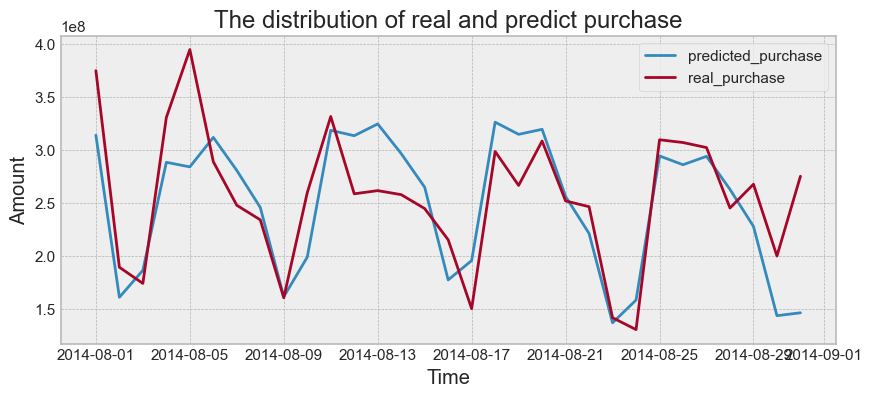

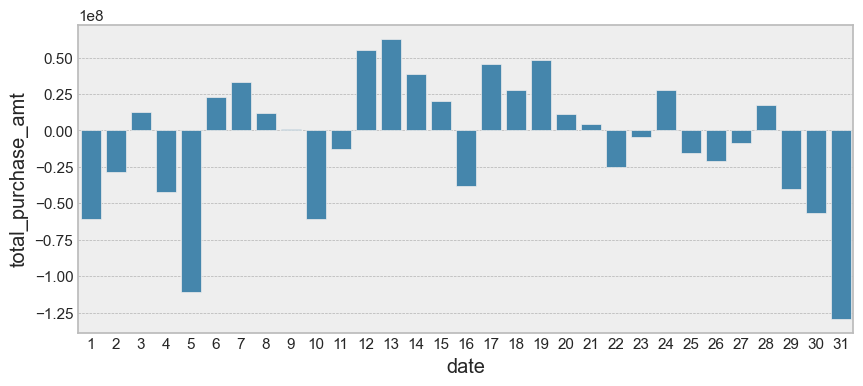

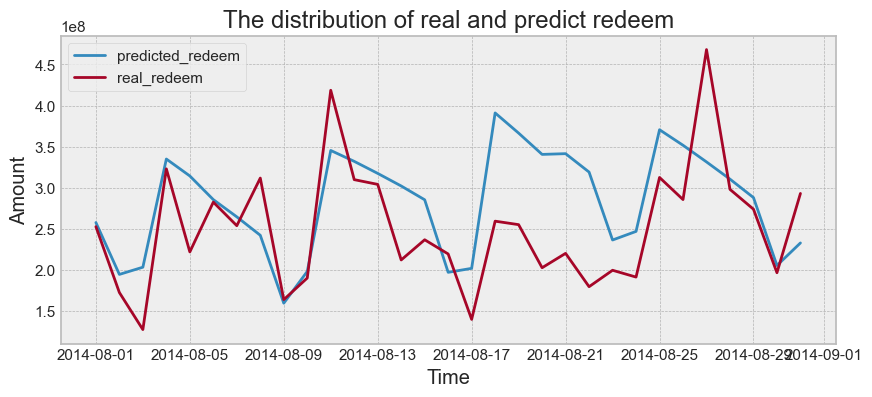

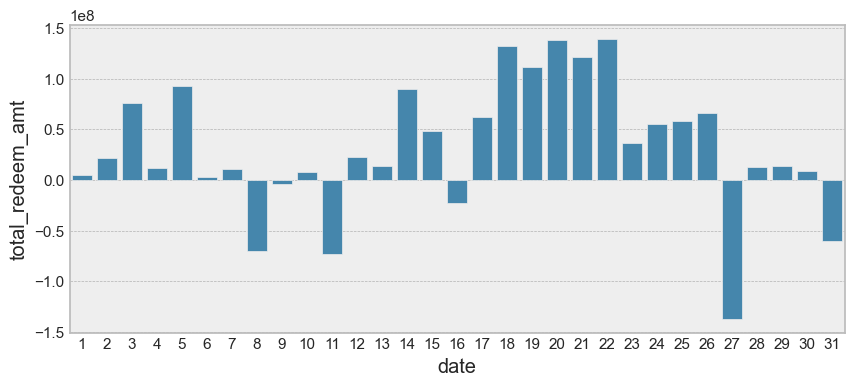

In [187]:
visual(result_purchase_lr, result_redeem_lr, testset)

In [188]:
result_purchase_lr = generate_online_result(data, [x for x in trainset.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], LinearRegression(),'total_purchase_amt')
result_redeem_lr = generate_online_result(data, [x for x in trainset.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], LinearRegression(),'total_redeem_amt')

### 1.4 九月预测

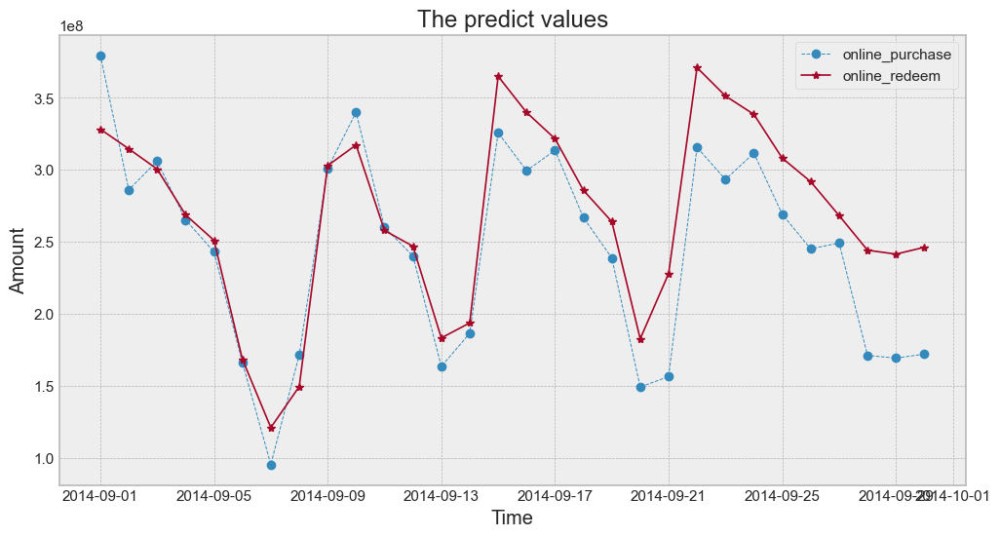

In [189]:
trainset, testset = split_data_online(data)
draw_result(result_purchase_lr, result_redeem_lr, testset)

In [190]:
# from datetime import datetime
# now = datetime.now().strftime("%Y-%m-%d")
# save_path = '路径'
# normalize_upload_file(result_purchase_lr, result_redeem_lr, testset).to_csv(save_path+f'{now}_only_is.csv',index=False,header=None)

## 1.5 多模型对比分析

Evaluating Models: 100%|██████████| 13/13 [00:08<00:00,  1.46model/s, Current Model=KNeighborsRegressor]     


Text(0, 0.5, 'Score')

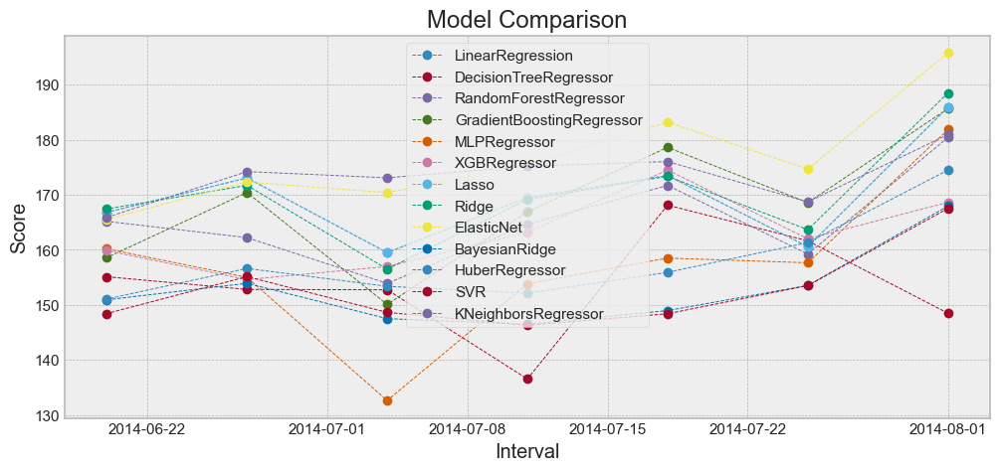

In [191]:
def multi_model_eva(data, types: str = 'purchase'):
    results = pd.DataFrame()
    models = [
        LinearRegression(),
        DecisionTreeRegressor(),
        RandomForestRegressor(),
        GradientBoostingRegressor(),
        MLPRegressor(solver='lbfgs'),
        xgb.XGBRegressor(objective='reg:squarederror'),
        Lasso(),
        Ridge(),
        ElasticNet(),
        BayesianRidge(),
        HuberRegressor(),
        SVR(),
        KNeighborsRegressor()
    ]

    # Initialize tqdm to track progress
    progress_bar = tqdm(models, desc="Evaluating Models", unit="model")

    for model in progress_bar:
        model_name = repr(model).split('(')[0]
        if results.empty:
            results = draw_eva_table(week_evalution_single(data, model, types)).rename(columns={0: model_name})
        else:
            results = pd.merge(results,
                               draw_eva_table(week_evalution_single(data, model, types)).rename(columns={0: model_name}),
                               on='interval')

        # Update tqdm description with current model name
        progress_bar.set_postfix({'Current Model': model_name})

    results = results[['interval'] + [x for x in results.columns if x != 'interval']]
    return results

multi_result = add_two_df(multi_model_eva(data, 'purchase'), multi_model_eva(data, 'redeem')).set_index('interval')
multi_result

multi_result.plot(figsize = (12,5),kind = 'line', marker = 'o', linewidth = 0.7, linestyle = '--')
plt.title('Model Comparison')
plt.xlabel('Interval')
plt.ylabel('Score')

In [192]:
from prophet import Prophet

Importing plotly failed. Interactive plots will not work.


Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=742ee42f-4664-4452-9520-83e03005315e
To: e:\Desktop\Github\资金流入流出\notebook\downloaded_file.csv
100%|██████████| 158M/158M [00:04<00:00, 32.4MB/s] 
15:23:18 - cmdstanpy - INFO - Chain [1] start processing
15:23:18 - cmdstanpy - INFO - Chain [1] done processing
15:23:18 - cmdstanpy - INFO - Chain [1] start processing
15:23:18 - cmdstanpy - INFO - Chain [1] done processing


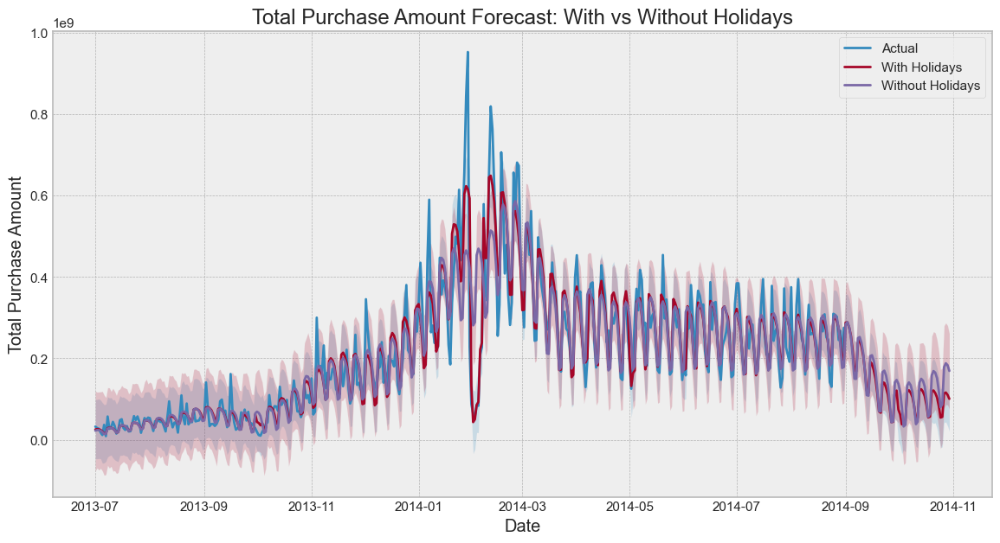

In [ ]:
# 准备Prophet模型所需的数据格式

balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date = None)
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')

df_purchase = total_balance[['date', 'total_purchase_amt']].rename(columns={'date': 'ds', 'total_purchase_amt': 'y'})

# 添加特殊日期数据
special_dates = [
    '2014-04-01', '2014-04-06', '2014-04-10', '2014-04-12', '2014-04-15', '2014-04-20',
    '2014-04-24', '2014-04-27', '2014-04-29', '2014-05-02', '2014-05-07', '2014-05-11',
    '2014-05-12', '2014-05-18', '2014-05-19', '2014-05-25', '2014-05-26', '2014-05-31',
    '2014-06-05', '2014-06-07', '2014-06-09', '2014-06-15', '2014-06-16', '2014-06-22',
    '2014-06-26', '2014-06-29', '2014-07-01', '2014-07-05', '2014-07-07', '2014-07-13',
    '2014-07-16', '2014-07-20', '2014-07-21', '2014-07-26', '2014-07-28', '2014-08-03',
    '2014-08-05', '2014-08-09', '2014-08-11', '2014-08-17', '2014-08-18', '2014-08-24'
]

holidays = pd.DataFrame({
    'holiday': 'special_day',
    'ds': pd.to_datetime(special_dates),
    'lower_window': 0,
    'upper_window': 1
})

# 创建并训练包含节假日的Prophet模型
m_with_holidays = Prophet(
    holidays=holidays,
    seasonality_mode='multiplicative',
    changepoint_prior_scale=0.1,
    seasonality_prior_scale=20,
    yearly_seasonality=True,
    daily_seasonality=True
)
m_with_holidays.add_country_holidays(country_name='CN')  # 添加中国节假日
m_with_holidays.fit(df_purchase)

# 创建并训练不包含节假日的Prophet模型
m_without_holidays = Prophet(
    seasonality_mode='multiplicative',
    changepoint_prior_scale=0.1,
    seasonality_prior_scale=20,
    yearly_seasonality=True,
    daily_seasonality=True
)
m_without_holidays.fit(df_purchase)

# 生成未来30天的日期
future = m_with_holidays.make_future_dataframe(periods=30)

# 进行预测
forecast_with_holidays = m_with_holidays.predict(future)
forecast_without_holidays = m_without_holidays.predict(future)

# 可视化结果对比
plt.figure(figsize=(14, 7))
plt.plot(df_purchase['ds'], df_purchase['y'], label='Actual')
plt.plot(forecast_with_holidays['ds'], forecast_with_holidays['yhat'], label='With Holidays')
plt.plot(forecast_without_holidays['ds'], forecast_without_holidays['yhat'], label='Without Holidays')
plt.fill_between(forecast_with_holidays['ds'], forecast_with_holidays['yhat_lower'], forecast_with_holidays['yhat_upper'], alpha=0.2) # 添加置信区间
plt.fill_between(forecast_without_holidays['ds'], forecast_without_holidays['yhat_lower'], forecast_without_holidays['yhat_upper'], alpha=0.2) # 添加置信区间
plt.title('Total Purchase Amount Forecast: With vs Without Holidays')
plt.xlabel('Date')
plt.ylabel('Total Purchase Amount')
plt.legend()
plt.show()